#Backbone: EfficientNet-B6 ← CNN
아키텍처: Hierarchical 
학습 전략: K-Fold (5개 모델)
예측 방식: Ensemble (5개 평균)
Augumentation 6 -> 8개-> TTA도 적용
TTA interference 추가
Soft Voting으로 변경

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, f1_score
from PIL import Image
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Step 0: 하이퍼파라미터 설정
# ============================================================================

BATCH_SIZE = 16
NUM_EPOCHS = 100        
EARLY_STOP_PATIENCE = 10
ALPHA = 0.3
K_FOLDS = 5
RANDOM_STATE = 42

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"✓ Device: {device}")

✓ Device: cuda


In [3]:
# Step 1: 데이터 로드
# ============================================================================

train_csv = pd.read_csv('train.csv')
meta_csv = pd.read_csv('meta.csv')

print(f"✓ Train 데이터: {len(train_csv)}장")
print(f"✓ 총 클래스: {len(meta_csv)}개")

✓ Train 데이터: 1570장
✓ 총 클래스: 17개


In [4]:
meta_csv

,target,class_name
0,0,account_number
1,1,application_for_payment_of_pregnancy_medical_e...
2,2,car_dashboard
3,3,confirmation_of_admission_and_discharge
4,4,diagnosis
5,5,driver_lisence
6,6,medical_bill_receipts
7,7,medical_outpatient_certificate
8,8,national_id_card
9,9,passport


In [5]:
# Step 2: Semantic Grouping
# ============================================================================

class_group_mapping = {
    'account_number': 'other',
    'application_for_payment_of_pregnancy_medical_expenses': 'medical',
    'car_dashboard': 'vehicle',
    'confirmation_of_admission_and_discharge': 'medical',
    'diagnosis': 'medical',
    'driver_lisence': 'identity',
    'medical_bill_receipts': 'medical',
    'medical_outpatient_certificate': 'medical',
    'national_id_card': 'identity',
    'passport': 'identity',
    'payment_confirmation': 'medical',
    'pharmaceutical_receipt': 'medical',
    'prescription': 'medical',
    'resume': 'document',
    'statement_of_opinion': 'document',
    'vehicle_registration_certificate': 'vehicle',
    'vehicle_registration_plate': 'vehicle',
}

group_to_idx = {'medical': 0, 'identity': 1, 'vehicle': 2, 'document': 3, 'other': 4}

train_csv['class_name'] = train_csv['target'].map(lambda x: meta_csv.iloc[x]['class_name'])
train_csv['group'] = train_csv['class_name'].map(class_group_mapping)
train_csv['group_idx'] = train_csv['group'].map(group_to_idx)

print(f"✓ Semantic Grouping 완료!")

# ✅ 확인
print(f"train_csv 컬럼: {train_csv.columns.tolist()}")
print(f"group_idx 확인: {train_csv['group_idx'].head()}")


✓ Semantic Grouping 완료!
train_csv 컬럼: ['ID', 'target', 'class_name', 'group', 'group_idx']
group_idx 확인: 0    2
1    0
2    0
3    0
4    2
Name: group_idx, dtype: int64


In [6]:
# Step 3: Augmentation 정의
# ============================================================================

train_transform = A.Compose([
    A.Resize(384, 384),
    A.Rotate(limit=180, p=0.8),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.GaussNoise(p=0.3),
    A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.4),
    A.Blur(blur_limit=3, p=0.2),
    A.ImageCompression(quality_lower=85, p=0.2),
    A.Normalize(),
    ToTensorV2(),
])

val_transform = A.Compose([
    A.Resize(384, 384),
    A.Normalize(),
    ToTensorV2(),
])

test_transform = A.Compose([
    A.Resize(384, 384),
    A.Normalize(),
    ToTensorV2(),
])

print(f"✓ 강화된 Augmentation 정의 완료!")


✓ 강화된 Augmentation 정의 완료!


In [7]:
# Step 4: Dataset 클래스 정의 (중요!)
# ============================================================================

class DocumentDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.dataframe = dataframe
        self.image_dir = image_dir
        self.transform = transform
    
    def __len__(self):
        return len(self.dataframe)
    
    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        img_name = row['ID']
        img_path = os.path.join(self.image_dir, img_name)
        
        try:
            image = Image.open(img_path).convert('RGB')
        except:
            image = Image.new('RGB', (384, 384))
        
        image = np.array(image)
        
        if self.transform:
            image = self.transform(image=image)['image']
        
        return {
            'image': image,
            'target': torch.tensor(int(row['target']), dtype=torch.long),
            'group_idx': torch.tensor(int(row['group_idx']), dtype=torch.long),
            'img_name': img_name
        }

class TestDocumentDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.dataframe = dataframe
        self.image_dir = image_dir
        self.transform = transform
    
    def __len__(self):
        return len(self.dataframe)
    
    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        img_name = row['ID']
        img_path = os.path.join(self.image_dir, img_name)
        
        try:
            image = Image.open(img_path).convert('RGB')
        except:
            image = Image.new('RGB', (384, 384))
        
        image = np.array(image)
        
        if self.transform:
            image = self.transform(image=image)['image']
        
        return {'image': image, 'img_name': img_name}

print(f"✓ Dataset 클래스 정의 완료!")

✓ Dataset 클래스 정의 완료!


In [8]:
#!pip install efficientnet_pytorch

In [9]:
# Step 5: Hierarchical Model 정의
# ============================================================================

from efficientnet_pytorch import EfficientNet
import torch.nn as nn

class HierarchicalDocumentClassifier(nn.Module):
    def __init__(self, num_groups=5, num_classes=17):
        super().__init__()
        
        self.backbone = EfficientNet.from_pretrained('efficientnet-b4')
        self.feature_dim = 258048  # ⭐ B4의 출력
        
        self.backbone._fc = nn.Identity()
        
        self.group_head = nn.Sequential(
            nn.Linear(self.feature_dim, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_groups)
        )
        
        self.fine_heads = nn.ModuleDict({
            'medical': nn.Linear(self.feature_dim, 8),
            'identity': nn.Linear(self.feature_dim, 3),
            'vehicle': nn.Linear(self.feature_dim, 3),
            'document': nn.Linear(self.feature_dim, 2),
            'other': nn.Linear(self.feature_dim, 1),
        })
        
        self.group_names = ['medical', 'identity', 'vehicle', 'document', 'other']
    
    def forward(self, x):
        # ⭐ 수정: flatten을 더 강하게
        features = self.backbone.extract_features(x)
        print(f"Features shape before flatten: {features.shape}")  # 디버깅용
        features = features.view(features.size(0), -1)  # [batch, -1]로 모두 flatten
        print(f"Features shape after flatten: {features.shape}")  # 디버깅용
        
        group_logits = self.group_head(features)
        fine_logits_list = [self.fine_heads[name](features) for name in self.group_names]
        fine_logits = torch.cat(fine_logits_list, dim=1)
        
        return group_logits, fine_logits

print(f"✓ Model 정의 완료! (B4 + Pretrained Weights)")



✓ Model 정의 완료! (B4 + Pretrained Weights)


In [10]:
# Step 6: Loss & 학습 함수
# ============================================================================

def hierarchical_loss(group_logits, fine_logits, group_labels, fine_labels, alpha=0.3):
    group_loss = nn.functional.cross_entropy(group_logits, group_labels)
    fine_loss = nn.functional.cross_entropy(fine_logits, fine_labels)
    return alpha * group_loss + (1 - alpha) * fine_loss, group_loss, fine_loss

def train_one_epoch(loader, model, optimizer, device, alpha=0.3):
    model.train()
    total_loss = 0
    
    pbar = tqdm(loader, desc="Training", ncols=100)
    
    for batch in pbar:
        images = batch['image'].to(device)
        group_labels = batch['group_idx'].to(device)
        fine_labels = batch['target'].to(device)
        
        optimizer.zero_grad()
        group_logits, fine_logits = model(images)
        
        loss, _, _ = hierarchical_loss(group_logits, fine_logits, group_labels, fine_labels, alpha=alpha)
        
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        pbar.set_postfix({'loss': f'{loss.item():.4f}'})
    
    return {'loss': total_loss / len(loader)}

def evaluate(loader, model, device):
    model.eval()
    fine_preds, fine_targets = [], []
    
    with torch.no_grad():
        pbar = tqdm(loader, desc="Evaluating", ncols=100)
        
        for batch in pbar:
            images = batch['image'].to(device)
            fine_labels = batch['target'].to(device)
            
            _, fine_logits = model(images)
            
            fine_preds.extend(torch.argmax(fine_logits, dim=1).cpu().numpy())
            fine_targets.extend(fine_labels.cpu().numpy())
    
    fine_f1 = f1_score(fine_targets, fine_preds, average='macro', zero_division=0)
    
    return {'fine_f1': fine_f1}

print(f"✓ Loss & 함수 정의 완료!")

✓ Loss & 함수 정의 완료!


Timm = 버전 B5 까지만 사용가능 timm  EfficientNet-PyTorch	B6 pretrained 가중치 있기 때문

In [11]:
!nvidia-smi


Wed Nov  5 14:01:13 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.86.10              Driver Version: 535.86.10    CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3090        On  | 00000000:21:00.0 Off |                  N/A |
| 39%   31C    P8              20W / 350W |      5MiB / 24576MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [12]:
!sudo fuser -v /dev/nvidia*


/bin/bash: sudo: command not found


In [13]:
# Step 7: K-Fold 설정
# ============================================================================
print("\n" + "="*60)
print("="*60)
# Step 7: K-Fold 설정
kfold = KFold(n_splits=K_FOLDS, shuffle=True, random_state=42)
fold_indices = list(kfold.split(train_csv))

print(f"✓ K-Fold 설정 완료!")
fold_results = []
all_fold_models = []

for fold, (train_idx, val_idx) in enumerate(fold_indices):
    print(f"\n[Fold {fold+1}/{K_FOLDS}]")
    
    train_fold = train_csv.iloc[train_idx][['ID', 'target', 'group_idx']].reset_index(drop=True)
    val_fold = train_csv.iloc[val_idx][['ID', 'target', 'group_idx']].reset_index(drop=True)
    
    train_fold_dataset = DocumentDataset(train_fold, 'train/', transform=train_transform)
    val_fold_dataset = DocumentDataset(val_fold, 'train/', transform=val_transform)
    
    train_fold_loader = DataLoader(train_fold_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, pin_memory=True)
    val_fold_loader = DataLoader(val_fold_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)
    
    fold_model = HierarchicalDocumentClassifier(num_groups=5, num_classes=17)
    fold_model = fold_model.to(device)
    
    fold_optimizer = torch.optim.AdamW(fold_model.parameters(), lr=1e-4, weight_decay=1e-4)
    fold_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(fold_optimizer, T_max=NUM_EPOCHS, eta_min=1e-6)
    
    best_fold_f1 = 0
    best_fold_model_path = f'best_fold_{fold+1}_model.pth'
    patience_counter = 0
    
    for epoch in range(NUM_EPOCHS):
        fold_model.train()  
        train_metrics = train_one_epoch(train_fold_loader, fold_model, fold_optimizer, device, alpha=ALPHA)
        fold_model.eval()
        val_metrics = evaluate(val_fold_loader, fold_model, device)
        
        if (epoch + 1) % 5 == 0 or epoch == 0:
            print(f"[Epoch {epoch+1:2d}] Train Loss: {train_metrics['loss']:.4f} | Val F1: {val_metrics['fine_f1']:.4f}")
        
        if val_metrics['fine_f1'] > best_fold_f1:
            best_fold_f1 = val_metrics['fine_f1']
            patience_counter = 0
            torch.save(fold_model.state_dict(), best_fold_model_path)
        else:
            patience_counter += 1
            if patience_counter >= EARLY_STOP_PATIENCE:
                print(f"✅ Early stopping at epoch {epoch+1}")
                break
        
        fold_scheduler.step()
    
    fold_results.append(best_fold_f1)
    all_fold_models.append(best_fold_model_path)
    
    print(f"✅ Fold {fold+1} 완료 | Best F1: {best_fold_f1:.4f}")
    
    # ⭐ 여기에 추가 (지금까지의 진행 상황 출력)
    print(f"현재까지 {fold+1}개 Fold 완료! 평균 F1: {np.mean(fold_results):.4f}")

print(f"\n{'='*60}")
print(f"✅ K-Fold 학습 완료!")
print(f"{'='*60}")
print(f"\n📊 최종 결과: 평균 F1 = {np.mean(fold_results):.4f}")




✓ K-Fold 설정 완료!

[Fold 1/5]
Loaded pretrained weights for efficientnet-b4


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<01:07,  1.15it/s, loss=2.6971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:01<00:45,  1.69it/s, loss=2.5952]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:38,  2.00it/s, loss=2.4780]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:02<00:34,  2.16it/s, loss=2.1836]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:32,  2.31it/s, loss=2.5632]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:31,  2.34it/s, loss=2.4665]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:03<00:30,  2.37it/s, loss=2.3795]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:29,  2.43it/s, loss=2.7177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:04<00:28,  2.42it/s, loss=2.4319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:29,  2.37it/s, loss=1.9978]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.49it/s, loss=1.8807]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:05<00:26,  2.55it/s, loss=2.1034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.58it/s, loss=1.6902]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.63it/s, loss=1.3554]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:24,  2.63it/s, loss=1.0435]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.60it/s, loss=2.8037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:07<00:23,  2.59it/s, loss=2.1708]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.62it/s, loss=0.9902]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.58it/s, loss=1.2932]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:22,  2.63it/s, loss=1.5837]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.52it/s, loss=2.1347]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:09<00:22,  2.50it/s, loss=1.6680]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:23,  2.43it/s, loss=1.0765]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.48it/s, loss=1.0444]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:10<00:21,  2.49it/s, loss=1.6256]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=0.7751]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:11<00:20,  2.53it/s, loss=1.7983]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.52it/s, loss=1.2038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.52it/s, loss=1.4476]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:12<00:19,  2.51it/s, loss=0.8884]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.50it/s, loss=0.8253]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:13<00:18,  2.61it/s, loss=1.3100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:17,  2.58it/s, loss=0.8030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.61it/s, loss=1.2065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:14<00:16,  2.59it/s, loss=1.5861]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.58it/s, loss=0.8226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.66it/s, loss=1.3542]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:15,  2.68it/s, loss=0.3019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.66it/s, loss=0.6747]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:16<00:14,  2.69it/s, loss=0.6143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.68it/s, loss=1.2421]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:13,  2.68it/s, loss=0.7846]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:13,  2.65it/s, loss=1.4439]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.59it/s, loss=0.8058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:18<00:13,  2.57it/s, loss=0.4711]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.55it/s, loss=0.7973]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.53it/s, loss=0.3122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:19<00:12,  2.52it/s, loss=0.4074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.51it/s, loss=0.9087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:20<00:11,  2.51it/s, loss=0.9299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.51it/s, loss=1.0407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.50it/s, loss=0.7118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:21<00:10,  2.51it/s, loss=1.3262]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.50it/s, loss=0.2446]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:22<00:09,  2.50it/s, loss=0.7000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.57it/s, loss=0.9563]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.60it/s, loss=0.6126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:23<00:08,  2.56it/s, loss=0.8772]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.57it/s, loss=0.8753]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.52it/s, loss=0.9460]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.53it/s, loss=0.3770]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.2085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:25<00:06,  2.51it/s, loss=0.4882]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.58it/s, loss=0.2246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.55it/s, loss=1.0536]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.55it/s, loss=0.5609]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.54it/s, loss=0.6181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:27<00:04,  2.52it/s, loss=0.7398]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.52it/s, loss=0.6655]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.50it/s, loss=0.2146]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.51it/s, loss=0.6224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.8239]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:29<00:02,  2.51it/s, loss=0.2452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:02,  2.47it/s, loss=0.6827]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.49it/s, loss=0.3690]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:30<00:01,  2.52it/s, loss=0.7586]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.51it/s, loss=0.7974]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  99%|███████████████████████████████████████▍| 78/79 [00:31<00:00,  2.51it/s, loss=0.6895]

Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.59it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.45it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.85it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.11it/s]

Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch  1] Train Loss: 1.1687 | Val F1: 0.6802



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.49it/s, loss=0.8605]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.57it/s, loss=0.6581]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.71it/s, loss=0.0951]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.65it/s, loss=0.4016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.57it/s, loss=0.6070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.63it/s, loss=0.3749]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.60it/s, loss=0.2589]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.57it/s, loss=1.1095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.55it/s, loss=0.5033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=0.3765]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.52it/s, loss=0.3979]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.52it/s, loss=1.1162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.48it/s, loss=0.3296]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.46it/s, loss=0.6235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:26,  2.44it/s, loss=0.5171]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.49it/s, loss=0.6343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.55it/s, loss=0.4558]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.53it/s, loss=0.2661]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.60it/s, loss=0.2540]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.59it/s, loss=0.3046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.57it/s, loss=0.2771]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.4736]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.60it/s, loss=0.0660]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.57it/s, loss=0.2220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.4726]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.63it/s, loss=0.1882]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.61it/s, loss=0.1196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.56it/s, loss=0.7918]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.4515]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:20,  2.44it/s, loss=0.3342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.46it/s, loss=0.3839]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:19,  2.47it/s, loss=0.4738]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.48it/s, loss=1.1675]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.48it/s, loss=0.5733]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:18,  2.42it/s, loss=0.7006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.47it/s, loss=0.4777]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.51it/s, loss=0.7824]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.52it/s, loss=0.3399]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.46it/s, loss=0.3653]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.52it/s, loss=0.2503]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.51it/s, loss=0.5894]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.51it/s, loss=0.8595]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.62it/s, loss=0.2110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.59it/s, loss=0.4479]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.46it/s, loss=0.2099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.57it/s, loss=0.6435]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.55it/s, loss=0.2305]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.51it/s, loss=0.7891]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.62it/s, loss=0.4016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.59it/s, loss=0.4419]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.56it/s, loss=0.5617]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.54it/s, loss=0.0946]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.66it/s, loss=0.7190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.69it/s, loss=0.4386]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:08,  2.73it/s, loss=0.3944]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.66it/s, loss=0.1353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.59it/s, loss=0.0899]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.67it/s, loss=0.2717]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.63it/s, loss=0.1480]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.59it/s, loss=0.4661]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.56it/s, loss=0.7812]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.54it/s, loss=0.2408]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.53it/s, loss=0.9693]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.60it/s, loss=0.4178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.49it/s, loss=0.5708]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.50it/s, loss=0.1194]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.50it/s, loss=0.3890]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.50it/s, loss=0.8185]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:04,  2.44it/s, loss=0.3526]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.52it/s, loss=0.2495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.51it/s, loss=0.2826]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.1640]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.51it/s, loss=0.4910]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.50it/s, loss=0.2765]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.50it/s, loss=0.1508]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.50it/s, loss=0.0763]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.50it/s, loss=0.5984]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.2143]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.77it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.79it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.83it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.79it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]

Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.44it/s, loss=0.7413]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.54it/s, loss=0.4069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.59it/s, loss=0.5226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.62it/s, loss=0.1642]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.58it/s, loss=0.6297]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.55it/s, loss=0.1208]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.63it/s, loss=0.5039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.61it/s, loss=0.1124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.59it/s, loss=0.9773]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.54it/s, loss=0.2581]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=0.3236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.52it/s, loss=0.0527]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.55it/s, loss=0.3207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.57it/s, loss=0.3207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.66it/s, loss=0.6427]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.63it/s, loss=0.1589]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.69it/s, loss=0.2133]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.63it/s, loss=0.4036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.3395]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.67it/s, loss=0.1419]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.63it/s, loss=0.5080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.0831]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.58it/s, loss=0.1191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.54it/s, loss=0.2504]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.56it/s, loss=0.2364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.53it/s, loss=0.1761]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.49it/s, loss=0.5390]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.55it/s, loss=0.1945]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.56it/s, loss=0.3064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.61it/s, loss=0.5679]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.57it/s, loss=0.4319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.49it/s, loss=0.1500]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.49it/s, loss=0.4886]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.58it/s, loss=0.2686]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.47it/s, loss=0.4640]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.47it/s, loss=0.1699]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.49it/s, loss=0.9092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.49it/s, loss=0.4850]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.49it/s, loss=0.2647]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.6920]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.50it/s, loss=0.1881]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.8888]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.0215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.50it/s, loss=0.4611]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.43it/s, loss=0.3633]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.45it/s, loss=0.0437]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.54it/s, loss=0.3977]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.52it/s, loss=0.1204]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.58it/s, loss=0.4831]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.49it/s, loss=0.3171]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.50it/s, loss=0.3517]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.50it/s, loss=0.4657]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.59it/s, loss=0.0731]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.56it/s, loss=0.2957]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.1989]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.57it/s, loss=0.3305]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.61it/s, loss=0.3776]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.6418]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.66it/s, loss=0.3418]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.62it/s, loss=0.4297]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.63it/s, loss=0.4321]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.62it/s, loss=0.3305]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.59it/s, loss=0.4639]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.63it/s, loss=0.0791]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.61it/s, loss=0.8273]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.59it/s, loss=0.3064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.64it/s, loss=0.4136]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.62it/s, loss=0.1684]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.58it/s, loss=0.3928]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.2740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.54it/s, loss=0.3119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.53it/s, loss=0.1192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.63it/s, loss=0.7383]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.58it/s, loss=0.1429]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.56it/s, loss=0.2612]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.64it/s, loss=0.1548]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.59it/s, loss=0.2368]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.2619]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.82it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:30,  2.53it/s, loss=0.4718]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.57it/s, loss=0.2750]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.60it/s, loss=0.1230]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.62it/s, loss=0.2384]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.67it/s, loss=0.5057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.70it/s, loss=0.0919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.65it/s, loss=0.1211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.63it/s, loss=0.2470]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.57it/s, loss=0.1169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.66it/s, loss=0.1660]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.65it/s, loss=0.0826]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.66it/s, loss=0.4684]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:25,  2.63it/s, loss=0.1629]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.66it/s, loss=0.1210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.65it/s, loss=0.0807]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.63it/s, loss=0.2328]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.64it/s, loss=0.1928]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.58it/s, loss=0.1062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.58it/s, loss=0.3311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.57it/s, loss=0.3987]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=0.1424]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.61it/s, loss=0.3613]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.60it/s, loss=0.1429]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.57it/s, loss=0.4019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.59it/s, loss=0.2711]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:09<00:20,  2.61it/s, loss=0.7495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.58it/s, loss=0.6079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.56it/s, loss=0.2022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.1117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.53it/s, loss=0.2916]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:19,  2.52it/s, loss=0.1574]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.5080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.51it/s, loss=0.1399]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.61it/s, loss=0.2581]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.62it/s, loss=0.1206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.64it/s, loss=0.0311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.71it/s, loss=0.0872]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.65it/s, loss=0.0640]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:14<00:15,  2.58it/s, loss=0.0273]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.47it/s, loss=0.2999]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:15,  2.48it/s, loss=0.1415]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.48it/s, loss=0.4703]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.47it/s, loss=0.2059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.50it/s, loss=0.6978]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.50it/s, loss=0.2192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.50it/s, loss=0.1985]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.50it/s, loss=0.9182]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.50it/s, loss=0.1212]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.58it/s, loss=0.9971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.48it/s, loss=0.2784]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.42it/s, loss=0.1413]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:11,  2.42it/s, loss=0.1058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.44it/s, loss=0.1314]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:10,  2.47it/s, loss=0.2700]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.54it/s, loss=0.3937]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.54it/s, loss=0.2203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.54it/s, loss=0.3895]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.49it/s, loss=0.0722]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.49it/s, loss=0.1278]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.53it/s, loss=0.7748]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.63it/s, loss=0.5136]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.64it/s, loss=0.3481]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.63it/s, loss=0.2452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.60it/s, loss=0.1389]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.51it/s, loss=0.2412]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.55it/s, loss=0.1717]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.55it/s, loss=0.4201]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.48it/s, loss=0.4395]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.61it/s, loss=0.2298]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.0260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.51it/s, loss=0.1985]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.50it/s, loss=0.2312]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=0.1908]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.67it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.63it/s, loss=0.3400]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.66it/s, loss=0.2659]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.61it/s, loss=0.4462]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.1257]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.23it/s, loss=0.4337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.34it/s, loss=0.5911]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.44it/s, loss=0.3696]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.52it/s, loss=0.3981]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.59it/s, loss=0.1468]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.56it/s, loss=0.1579]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.54it/s, loss=0.2279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.52it/s, loss=0.8133]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.52it/s, loss=0.2685]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.61it/s, loss=0.1746]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.67it/s, loss=0.1118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:24,  2.72it/s, loss=0.0919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:24,  2.67it/s, loss=0.4908]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:23,  2.72it/s, loss=0.1059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.65it/s, loss=0.2453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.71it/s, loss=0.1174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.63it/s, loss=0.2322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.61it/s, loss=0.0496]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.57it/s, loss=0.5245]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.56it/s, loss=0.2600]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.56it/s, loss=0.0227]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.55it/s, loss=0.1110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.59it/s, loss=0.0522]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.56it/s, loss=0.1366]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.46it/s, loss=0.0178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.47it/s, loss=0.1153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.48it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.58it/s, loss=0.2777]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.55it/s, loss=0.2445]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.60it/s, loss=0.2193]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.60it/s, loss=0.5884]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.56it/s, loss=0.2410]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.59it/s, loss=0.6428]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.57it/s, loss=0.0522]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.61it/s, loss=0.0315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.57it/s, loss=0.1640]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.50it/s, loss=0.2020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.47it/s, loss=0.3204]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.44it/s, loss=0.0163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:16,  2.40it/s, loss=0.0250]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.53it/s, loss=0.6884]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.52it/s, loss=0.1164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.2232]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.51it/s, loss=0.2448]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.50it/s, loss=0.0604]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.58it/s, loss=0.6503]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.67it/s, loss=0.2736]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.62it/s, loss=0.0927]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.62it/s, loss=0.2013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.62it/s, loss=0.2566]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.56it/s, loss=0.1417]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.1939]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.55it/s, loss=0.1014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.54it/s, loss=0.1466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.49it/s, loss=0.4819]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.55it/s, loss=0.1634]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.61it/s, loss=0.2614]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.58it/s, loss=0.2377]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.62it/s, loss=0.1634]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.53it/s, loss=0.1201]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.53it/s, loss=0.2844]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.53it/s, loss=0.2092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.53it/s, loss=0.1979]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.60it/s, loss=0.3139]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.66it/s, loss=0.5496]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.64it/s, loss=0.2297]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.66it/s, loss=0.1039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.63it/s, loss=0.2518]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.59it/s, loss=0.2214]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.54it/s, loss=0.1768]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.48it/s, loss=0.3113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.46it/s, loss=0.2545]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.44it/s, loss=0.4574]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:02,  2.40it/s, loss=0.2576]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.43it/s, loss=0.0045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.45it/s, loss=0.0609]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.46it/s, loss=0.3321]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.5309]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.48it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch  5] Train Loss: 0.2412 | Val F1: 0.9086



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:29,  2.62it/s, loss=0.0480]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.55it/s, loss=0.0462]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.49it/s, loss=0.2600]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.50it/s, loss=0.0392]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.52it/s, loss=0.0961]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.51it/s, loss=0.1769]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.51it/s, loss=0.1048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.58it/s, loss=0.2472]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.59it/s, loss=0.0127]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.56it/s, loss=0.1545]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.63it/s, loss=0.0552]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.59it/s, loss=0.3192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.57it/s, loss=0.2791]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.55it/s, loss=0.1302]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.63it/s, loss=0.2037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.60it/s, loss=0.0177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.60it/s, loss=0.2093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:25,  2.44it/s, loss=0.0744]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.46it/s, loss=0.8079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.47it/s, loss=0.2604]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.48it/s, loss=0.0257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.57it/s, loss=0.1851]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.55it/s, loss=0.0311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.65it/s, loss=0.0336]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.0166]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.57it/s, loss=0.1094]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.62it/s, loss=0.0899]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.58it/s, loss=0.0134]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:20,  2.49it/s, loss=0.0716]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.56it/s, loss=0.0609]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.55it/s, loss=0.2440]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.55it/s, loss=0.1102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.60it/s, loss=0.0525]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.61it/s, loss=0.0668]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.58it/s, loss=0.3159]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.55it/s, loss=0.2353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.54it/s, loss=0.4021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.53it/s, loss=0.2321]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.52it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.51it/s, loss=0.0687]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.51it/s, loss=0.2683]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.51it/s, loss=0.4741]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.3981]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.49it/s, loss=0.1193]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.50it/s, loss=0.0282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.51it/s, loss=0.0646]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.51it/s, loss=0.2147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.42it/s, loss=0.1365]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.53it/s, loss=0.0314]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.52it/s, loss=0.2499]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.51it/s, loss=0.4477]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.59it/s, loss=0.3023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.58it/s, loss=0.2935]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:10,  2.46it/s, loss=0.1902]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.45it/s, loss=0.4727]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.43it/s, loss=0.3801]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.46it/s, loss=0.0639]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.52it/s, loss=0.1612]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.47it/s, loss=0.4090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.52it/s, loss=0.0257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.52it/s, loss=0.2550]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.58it/s, loss=0.1116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.59it/s, loss=0.0450]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.63it/s, loss=0.1942]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.60it/s, loss=0.4193]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.66it/s, loss=0.1691]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.54it/s, loss=0.5090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.53it/s, loss=0.2439]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.60it/s, loss=0.1027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.49it/s, loss=0.0227]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.60it/s, loss=0.1761]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.47it/s, loss=0.7849]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.57it/s, loss=0.2238]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.55it/s, loss=0.0289]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.62it/s, loss=0.3721]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.60it/s, loss=0.2530]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.64it/s, loss=0.5630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.2663]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.02it/s, loss=0.1654]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.40it/s, loss=0.1353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.49it/s, loss=0.0328]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.61it/s, loss=0.0472]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.57it/s, loss=0.2466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.64it/s, loss=0.6919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.62it/s, loss=0.0225]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.47it/s, loss=0.1371]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.48it/s, loss=0.1183]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.49it/s, loss=0.4469]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.49it/s, loss=0.0062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.49it/s, loss=0.3036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.47it/s, loss=0.3709]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.42it/s, loss=0.3065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:25,  2.50it/s, loss=0.0339]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.52it/s, loss=0.0452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.53it/s, loss=0.1353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.52it/s, loss=0.0937]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.51it/s, loss=0.1036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.51it/s, loss=0.2780]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.51it/s, loss=0.1371]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:23,  2.47it/s, loss=0.2198]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.51it/s, loss=0.0365]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.51it/s, loss=0.1447]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.51it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.1745]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:21,  2.42it/s, loss=0.0760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.47it/s, loss=0.1109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:20,  2.47it/s, loss=0.2069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:12<00:19,  2.48it/s, loss=0.0619]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.45it/s, loss=0.9511]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.2574]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.52it/s, loss=0.2290]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.56it/s, loss=0.0655]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.54it/s, loss=0.1440]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.52it/s, loss=0.1753]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.52it/s, loss=0.1182]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.52it/s, loss=0.0319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.1381]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.58it/s, loss=0.0228]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.61it/s, loss=0.2335]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.62it/s, loss=0.2129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.57it/s, loss=0.0396]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.57it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.55it/s, loss=0.8747]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.53it/s, loss=0.0895]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.52it/s, loss=0.0772]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:19<00:12,  2.49it/s, loss=0.3061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.52it/s, loss=0.0845]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.60it/s, loss=0.0381]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.62it/s, loss=0.1527]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.0300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:21<00:10,  2.52it/s, loss=0.3031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.54it/s, loss=0.0466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.59it/s, loss=0.0129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.66it/s, loss=0.1189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.52it/s, loss=0.0233]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.59it/s, loss=0.3812]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.55it/s, loss=0.2393]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.47it/s, loss=0.2452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.43it/s, loss=0.0166]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.0207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.50it/s, loss=0.0467]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.50it/s, loss=0.1779]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.60it/s, loss=0.2050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:04,  2.66it/s, loss=0.1096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.62it/s, loss=0.2065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.53it/s, loss=0.1694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.57it/s, loss=0.3461]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.55it/s, loss=0.1346]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.53it/s, loss=0.0198]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.60it/s, loss=0.2096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.59it/s, loss=0.3493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.57it/s, loss=0.0626]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.55it/s, loss=0.1020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:30<00:01,  2.60it/s, loss=0.3348]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.59it/s, loss=0.2315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.0125]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.20it/s, loss=0.0111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.43it/s, loss=0.2166]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.48it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.56it/s, loss=0.0206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.54it/s, loss=0.1650]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.53it/s, loss=0.0145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.64it/s, loss=0.0627]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.63it/s, loss=0.1220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.64it/s, loss=0.1544]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.60it/s, loss=0.1404]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.66it/s, loss=0.1275]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.63it/s, loss=0.1062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.59it/s, loss=0.0102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.56it/s, loss=0.1584]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.54it/s, loss=0.2114]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.53it/s, loss=0.1357]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.52it/s, loss=0.0057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.60it/s, loss=0.0878]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.57it/s, loss=0.1054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.55it/s, loss=0.1169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=0.0662]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.61it/s, loss=0.0391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.65it/s, loss=0.0766]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.65it/s, loss=0.0388]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.0075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.56it/s, loss=0.0675]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.55it/s, loss=0.0388]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.53it/s, loss=0.3177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.5633]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.52it/s, loss=0.1410]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.51it/s, loss=0.0618]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.50it/s, loss=0.2860]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.51it/s, loss=0.0795]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.51it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.51it/s, loss=0.1763]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.50it/s, loss=0.2536]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.50it/s, loss=0.4575]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.50it/s, loss=0.3093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.50it/s, loss=0.4364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.1326]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.48it/s, loss=0.0995]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.51it/s, loss=0.0683]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.48it/s, loss=0.1946]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.46it/s, loss=0.1854]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.52it/s, loss=0.0547]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.61it/s, loss=0.0765]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:11,  2.69it/s, loss=0.0422]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.74it/s, loss=0.0372]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.67it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.61it/s, loss=0.0556]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.58it/s, loss=0.2735]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.59it/s, loss=0.0896]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.62it/s, loss=0.0593]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.58it/s, loss=0.0376]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.63it/s, loss=0.1890]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.63it/s, loss=0.3850]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.68it/s, loss=0.4151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.63it/s, loss=0.2271]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.59it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.56it/s, loss=0.0218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.45it/s, loss=0.2154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.55it/s, loss=0.0649]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.54it/s, loss=0.1765]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.62it/s, loss=0.5379]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.66it/s, loss=0.1108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.64it/s, loss=0.1243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.60it/s, loss=0.0905]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.57it/s, loss=0.0619]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.55it/s, loss=0.0256]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.53it/s, loss=0.1740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.52it/s, loss=0.0250]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.51it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.51it/s, loss=0.1119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.57it/s, loss=0.0577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.66it/s, loss=0.0999]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.62it/s, loss=0.2946]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.0090]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.75it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.03it/s, loss=0.2150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.28it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.38it/s, loss=0.2656]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:31,  2.41it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.45it/s, loss=0.0908]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.47it/s, loss=0.1579]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.48it/s, loss=0.1735]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.49it/s, loss=0.0168]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.49it/s, loss=0.1548]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:28,  2.41it/s, loss=0.0166]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.44it/s, loss=0.0875]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.54it/s, loss=0.0133]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.53it/s, loss=0.3778]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.59it/s, loss=0.0553]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:24,  2.58it/s, loss=0.2448]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.57it/s, loss=0.0326]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.62it/s, loss=0.0775]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.61it/s, loss=0.0729]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.57it/s, loss=0.0314]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.55it/s, loss=0.1101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=0.0671]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.52it/s, loss=0.0190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.50it/s, loss=0.3843]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.49it/s, loss=0.0316]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.52it/s, loss=0.0215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.50it/s, loss=0.4260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.48it/s, loss=0.1561]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.52it/s, loss=0.1856]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.59it/s, loss=0.0238]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.59it/s, loss=0.2051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.60it/s, loss=0.3094]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.63it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:17,  2.59it/s, loss=0.2420]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.56it/s, loss=0.0394]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.62it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.59it/s, loss=0.0279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.58it/s, loss=0.0214]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.55it/s, loss=0.2346]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.52it/s, loss=0.0634]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.54it/s, loss=0.0847]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.55it/s, loss=0.3674]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.52it/s, loss=0.0385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:13,  2.58it/s, loss=0.0957]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.65it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.63it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.59it/s, loss=0.1029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.0370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.55it/s, loss=0.3631]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.56it/s, loss=0.1835]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.60it/s, loss=0.0174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.57it/s, loss=0.1463]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.55it/s, loss=0.3408]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.53it/s, loss=0.0069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.52it/s, loss=0.6454]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.2179]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.56it/s, loss=0.0620]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.46it/s, loss=0.1513]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.49it/s, loss=0.0972]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.49it/s, loss=0.0193]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.49it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.50it/s, loss=0.1321]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.1128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.50it/s, loss=0.0091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.49it/s, loss=0.0936]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.50it/s, loss=0.1357]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.48it/s, loss=0.0107]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.51it/s, loss=0.5938]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.49it/s, loss=0.0149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.51it/s, loss=0.1274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.60it/s, loss=0.1091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.58it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.57it/s, loss=0.4500]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.57it/s, loss=0.2715]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.60it/s, loss=0.1141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.65it/s, loss=0.0782]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.67it/s, loss=0.0072]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.64it/s, loss=0.0147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.2234]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.10it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.02it/s, loss=0.2058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.28it/s, loss=0.2176]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:32,  2.36it/s, loss=0.3603]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.43it/s, loss=0.0115]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.45it/s, loss=0.0867]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.54it/s, loss=0.0695]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.46it/s, loss=0.2784]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.47it/s, loss=0.0620]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.45it/s, loss=0.0936]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:27,  2.50it/s, loss=0.1047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.50it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.44it/s, loss=0.1064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.50it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.58it/s, loss=0.0401]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:25,  2.49it/s, loss=0.0372]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.49it/s, loss=0.0874]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.49it/s, loss=0.1099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.50it/s, loss=0.1460]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.0674]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:22,  2.58it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.55it/s, loss=0.0826]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.63it/s, loss=1.1658]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.58it/s, loss=0.0113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.56it/s, loss=0.4286]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0796]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.60it/s, loss=0.1414]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.51it/s, loss=0.0171]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.48it/s, loss=0.0256]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.51it/s, loss=0.0826]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.51it/s, loss=0.1408]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.51it/s, loss=0.1240]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.49it/s, loss=0.0469]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.51it/s, loss=0.2953]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.51it/s, loss=0.0132]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:14<00:17,  2.47it/s, loss=0.1887]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.51it/s, loss=0.3820]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.51it/s, loss=0.2648]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.51it/s, loss=0.0103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.59it/s, loss=0.2113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.58it/s, loss=0.1880]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.57it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.55it/s, loss=0.5339]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.51it/s, loss=0.0095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.1081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.53it/s, loss=0.2181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.49it/s, loss=0.1505]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:13,  2.41it/s, loss=0.3412]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:19<00:12,  2.52it/s, loss=0.0348]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.53it/s, loss=0.1604]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:12,  2.42it/s, loss=0.0668]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.37it/s, loss=0.0560]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:11,  2.39it/s, loss=0.0847]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:21<00:10,  2.45it/s, loss=0.1262]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:10,  2.45it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:22<00:09,  2.46it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.51it/s, loss=0.3803]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.47it/s, loss=0.2506]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:23<00:08,  2.48it/s, loss=0.3312]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.54it/s, loss=0.0192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:24<00:07,  2.51it/s, loss=0.1327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.50it/s, loss=0.0264]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.54it/s, loss=0.1601]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:25<00:06,  2.49it/s, loss=0.0225]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.52it/s, loss=0.0658]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.54it/s, loss=0.8583]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:04,  2.61it/s, loss=0.0619]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.66it/s, loss=0.2080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:27<00:04,  2.65it/s, loss=0.0376]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.60it/s, loss=0.0546]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.64it/s, loss=0.0128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:02,  2.68it/s, loss=0.1007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.66it/s, loss=0.0788]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.63it/s, loss=0.2591]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.59it/s, loss=0.1253]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.56it/s, loss=0.0567]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:30<00:01,  2.54it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.52it/s, loss=0.1481]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:31<00:00,  2.53it/s, loss=0.2835]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.10it/s]


[Epoch 10] Train Loss: 0.1473 | Val F1: 0.8836


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.24it/s, loss=0.0171]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.40it/s, loss=0.0870]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.45it/s, loss=0.1755]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.47it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.59it/s, loss=0.2452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.56it/s, loss=0.4268]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.54it/s, loss=0.4748]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.53it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.47it/s, loss=0.1163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:27,  2.51it/s, loss=0.0301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.52it/s, loss=0.3527]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.43it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.45it/s, loss=0.0417]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.46it/s, loss=0.2986]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:25,  2.53it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.56it/s, loss=0.2370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.54it/s, loss=0.1037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.53it/s, loss=0.0878]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.52it/s, loss=0.0113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.51it/s, loss=0.1844]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.51it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.3616]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.47it/s, loss=0.0507]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.50it/s, loss=0.0046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.51it/s, loss=0.0267]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.0092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.50it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.51it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.50it/s, loss=0.0216]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.59it/s, loss=0.2588]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.59it/s, loss=0.2285]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.60it/s, loss=0.0618]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:17,  2.57it/s, loss=0.2450]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.52it/s, loss=0.0797]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.1238]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.48it/s, loss=0.0441]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.50it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.51it/s, loss=0.1495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.50it/s, loss=0.1057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.5132]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.53it/s, loss=0.2108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.49it/s, loss=0.0216]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.51it/s, loss=0.3768]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.49it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.54it/s, loss=0.0309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.49it/s, loss=0.0938]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.56it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:19<00:12,  2.56it/s, loss=0.1247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.61it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.60it/s, loss=0.3093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.61it/s, loss=0.4142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.63it/s, loss=0.1118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.60it/s, loss=0.3754]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.55it/s, loss=0.6817]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.56it/s, loss=0.0094]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.54it/s, loss=0.1596]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.49it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.53it/s, loss=0.1502]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.52it/s, loss=0.5843]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.51it/s, loss=0.3004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.50it/s, loss=0.0895]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.51it/s, loss=0.0111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.0426]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.51it/s, loss=0.0122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.50it/s, loss=0.1270]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.58it/s, loss=0.5155]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.48it/s, loss=0.0998]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.49it/s, loss=0.2281]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.56it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.47it/s, loss=0.1315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.48it/s, loss=0.1422]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.48it/s, loss=0.1863]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:29<00:02,  2.48it/s, loss=0.2153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.50it/s, loss=0.1098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.50it/s, loss=0.5269]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:30<00:01,  2.50it/s, loss=0.1754]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.49it/s, loss=0.0643]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:31<00:00,  2.53it/s, loss=0.0332]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.63it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.76it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.82it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.84it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.25it/s, loss=0.0760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.40it/s, loss=0.0118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.41it/s, loss=0.1027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.48it/s, loss=0.1101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.59it/s, loss=0.4880]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.64it/s, loss=0.0338]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.62it/s, loss=0.1760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.58it/s, loss=0.1879]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.63it/s, loss=0.0274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=0.0802]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.58it/s, loss=0.0205]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.59it/s, loss=0.1438]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.55it/s, loss=0.0593]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.54it/s, loss=0.5891]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.53it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.60it/s, loss=0.0582]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.59it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.64it/s, loss=0.0876]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.69it/s, loss=0.0111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.67it/s, loss=0.0424]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.63it/s, loss=0.1787]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.57it/s, loss=0.3552]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.56it/s, loss=0.3581]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.55it/s, loss=0.0971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0898]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.57it/s, loss=0.1401]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.58it/s, loss=0.0408]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.55it/s, loss=0.2355]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.63it/s, loss=0.1008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.67it/s, loss=0.2778]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.65it/s, loss=0.1244]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.74it/s, loss=0.0689]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.69it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:16,  2.75it/s, loss=0.0634]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.71it/s, loss=0.0562]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.63it/s, loss=0.0783]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.71it/s, loss=0.0507]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.64it/s, loss=0.0407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:14<00:15,  2.67it/s, loss=0.0112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.65it/s, loss=0.2888]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.59it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.58it/s, loss=0.3597]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.62it/s, loss=0.6826]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:16<00:13,  2.61it/s, loss=0.0227]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.58it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.56it/s, loss=0.2775]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.54it/s, loss=0.1189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.49it/s, loss=0.2097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.53it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.52it/s, loss=0.0477]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.51it/s, loss=0.2027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.51it/s, loss=0.0408]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.51it/s, loss=0.1258]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:10,  2.49it/s, loss=0.0226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.51it/s, loss=0.0772]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.60it/s, loss=0.0459]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.59it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.61it/s, loss=0.2712]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.59it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.56it/s, loss=0.0783]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=0.1673]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.54it/s, loss=0.1693]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.53it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.47it/s, loss=0.0606]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.0391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.52it/s, loss=0.0393]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.0120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.51it/s, loss=0.1995]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.36it/s, loss=0.3102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.45it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.45it/s, loss=0.5619]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.54it/s, loss=0.0198]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:02,  2.50it/s, loss=0.1173]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.57it/s, loss=0.0404]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.55it/s, loss=0.0103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.52it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.0188]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.17it/s, loss=0.1971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.40it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.56it/s, loss=0.0405]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.56it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.54it/s, loss=0.0636]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.53it/s, loss=0.0878]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.52it/s, loss=0.1670]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.48it/s, loss=0.0218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:28,  2.43it/s, loss=0.0757]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.49it/s, loss=0.1015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.51it/s, loss=0.1756]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.60it/s, loss=0.2182]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.50it/s, loss=0.1609]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.50it/s, loss=0.0521]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.50it/s, loss=0.0218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.50it/s, loss=0.0655]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.3585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.57it/s, loss=0.1055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.65it/s, loss=0.0738]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.60it/s, loss=0.0139]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.64it/s, loss=0.0341]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.60it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.59it/s, loss=0.0675]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=0.0150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:21,  2.44it/s, loss=0.1516]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.46it/s, loss=0.0580]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:20,  2.49it/s, loss=0.0146]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.49it/s, loss=0.0984]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.50it/s, loss=0.0770]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.50it/s, loss=0.1731]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:17,  2.57it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.59it/s, loss=0.0188]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.65it/s, loss=0.2657]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.60it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.48it/s, loss=0.4779]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.45it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.47it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.53it/s, loss=0.0073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.54it/s, loss=0.4049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.56it/s, loss=0.1997]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.56it/s, loss=0.1391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.65it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.70it/s, loss=0.0728]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.64it/s, loss=0.0220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.0374]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.57it/s, loss=0.0423]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.55it/s, loss=0.3817]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.52it/s, loss=0.0183]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.51it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.53it/s, loss=0.0334]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.52it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.51it/s, loss=0.0235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.51it/s, loss=0.0744]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.60it/s, loss=0.3327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.54it/s, loss=0.0190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.45it/s, loss=0.0471]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.48it/s, loss=0.1030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.49it/s, loss=0.0315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.49it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.49it/s, loss=0.0475]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.50it/s, loss=0.0703]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.56it/s, loss=0.0698]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.48it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.40it/s, loss=0.1537]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.42it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.49it/s, loss=0.2786]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.61it/s, loss=0.2362]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.63it/s, loss=0.3647]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.57it/s, loss=0.1741]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.55it/s, loss=0.0240]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.54it/s, loss=0.0369]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.62it/s, loss=0.0371]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.67it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.74it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.66it/s, loss=0.0126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0115]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.26it/s, loss=0.0177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:34,  2.23it/s, loss=0.3221]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:32,  2.35it/s, loss=0.1271]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:32,  2.32it/s, loss=0.0338]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.43it/s, loss=0.0176]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.48it/s, loss=0.0092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.48it/s, loss=0.0333]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.57it/s, loss=0.0266]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.65it/s, loss=0.0173]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.71it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:24,  2.75it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.68it/s, loss=0.0678]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:24,  2.65it/s, loss=0.1356]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.55it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.58it/s, loss=0.0266]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.56it/s, loss=0.3616]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.54it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.61it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.66it/s, loss=0.0080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.64it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.60it/s, loss=0.6193]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.57it/s, loss=0.0524]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.55it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.52it/s, loss=0.1313]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.53it/s, loss=0.0057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.52it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.51it/s, loss=0.0182]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.51it/s, loss=0.1459]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.51it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.51it/s, loss=0.0311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.61it/s, loss=0.3551]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.56it/s, loss=0.2722]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.65it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.60it/s, loss=0.4492]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.64it/s, loss=0.3333]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.53it/s, loss=0.0642]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.52it/s, loss=0.0406]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.47it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.52it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.52it/s, loss=0.2605]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.58it/s, loss=0.1631]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.59it/s, loss=0.0671]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.59it/s, loss=0.1045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.60it/s, loss=0.1328]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.56it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.57it/s, loss=0.3349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.53it/s, loss=0.1034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.52it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:12,  2.49it/s, loss=0.0207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.53it/s, loss=0.1020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.48it/s, loss=0.0433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.52it/s, loss=0.0628]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.53it/s, loss=0.3094]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.52it/s, loss=0.0099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.0976]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.49it/s, loss=0.1357]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.49it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.50it/s, loss=0.3933]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.48it/s, loss=0.0585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.50it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.50it/s, loss=0.2123]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.1799]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.50it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.50it/s, loss=0.0982]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.50it/s, loss=0.3327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.60it/s, loss=0.0281]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.63it/s, loss=0.0590]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.63it/s, loss=0.0854]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.59it/s, loss=0.1361]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.1371]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.54it/s, loss=0.1576]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.53it/s, loss=0.0181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.52it/s, loss=0.0389]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.51it/s, loss=0.0278]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.51it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.51it/s, loss=0.6221]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.51it/s, loss=0.0101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.0011]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.82it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.85it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:33,  2.30it/s, loss=0.2787]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.57it/s, loss=0.0210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.54it/s, loss=0.0866]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.62it/s, loss=0.5906]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.64it/s, loss=0.0091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.61it/s, loss=0.2153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.53it/s, loss=0.0131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.58it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.50it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.49it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.50it/s, loss=0.0633]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.48it/s, loss=0.0972]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.49it/s, loss=0.0185]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.0135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.47it/s, loss=0.0099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.58it/s, loss=0.0505]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.52it/s, loss=0.0203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.57it/s, loss=0.2199]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.55it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.53it/s, loss=0.0607]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.53it/s, loss=0.0427]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.0446]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.52it/s, loss=0.0235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.51it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.51it/s, loss=0.1575]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.1990]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.58it/s, loss=0.1498]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.56it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.65it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.61it/s, loss=0.1122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.58it/s, loss=0.1122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.55it/s, loss=0.0905]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.54it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.53it/s, loss=0.1606]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.58it/s, loss=0.0695]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.56it/s, loss=0.0973]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.62it/s, loss=0.0093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.64it/s, loss=0.0225]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.59it/s, loss=0.0750]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.56it/s, loss=0.0489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.54it/s, loss=0.0182]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.53it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.47it/s, loss=0.0343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.48it/s, loss=0.0408]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.45it/s, loss=0.0081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.48it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.47it/s, loss=0.0288]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.52it/s, loss=0.0184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.56it/s, loss=0.0398]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.55it/s, loss=0.0294]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.49it/s, loss=0.0337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.51it/s, loss=0.1200]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.53it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.60it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.0326]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.67it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.69it/s, loss=0.0237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.67it/s, loss=0.2760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.69it/s, loss=0.1377]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.63it/s, loss=0.1667]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.51it/s, loss=0.0774]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.51it/s, loss=0.2140]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.61it/s, loss=0.0364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.57it/s, loss=0.4222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.66it/s, loss=0.1471]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.63it/s, loss=0.5635]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.62it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:04,  2.43it/s, loss=0.0095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.54it/s, loss=0.0596]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.54it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.60it/s, loss=0.1864]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=0.0247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.56it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.64it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.62it/s, loss=0.0111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.65it/s, loss=0.0416]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0040]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


[Epoch 15] Train Loss: 0.0765 | Val F1: 0.8816
✅ Early stopping at epoch 15
✅ Fold 1 완료 | Best F1: 0.9086
현재까지 1개 Fold 완료! 평균 F1: 0.9086

[Fold 2/5]
Loaded pretrained weights for efficientnet-b4


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.45it/s, loss=2.6060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.48it/s, loss=2.8958]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.61it/s, loss=2.3073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.59it/s, loss=2.2310]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.58it/s, loss=1.7217]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.65it/s, loss=2.3443]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.60it/s, loss=2.7619]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.57it/s, loss=2.1206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.55it/s, loss=2.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=1.7660]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.52it/s, loss=1.9385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.62it/s, loss=1.7484]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.59it/s, loss=1.8684]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.56it/s, loss=2.1575]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.54it/s, loss=2.6120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.59it/s, loss=1.2446]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.59it/s, loss=1.8687]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.56it/s, loss=1.5523]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.55it/s, loss=1.3411]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.61it/s, loss=1.2422]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.61it/s, loss=1.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=1.7495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.63it/s, loss=0.6472]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.59it/s, loss=1.2776]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.56it/s, loss=2.1908]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=2.1341]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.52it/s, loss=0.9198]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.52it/s, loss=0.4382]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.62it/s, loss=0.3778]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.60it/s, loss=1.1527]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.56it/s, loss=1.0237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.60it/s, loss=1.1525]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.54it/s, loss=0.9356]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.57it/s, loss=1.0177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.56it/s, loss=0.5672]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.54it/s, loss=0.9247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.53it/s, loss=1.1494]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.52it/s, loss=1.1158]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.52it/s, loss=0.6025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.51it/s, loss=1.3542]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.59it/s, loss=1.0395]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.59it/s, loss=0.6105]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.65it/s, loss=0.9441]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.60it/s, loss=0.7889]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.57it/s, loss=1.2936]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.55it/s, loss=0.8844]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.62it/s, loss=1.1042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.69it/s, loss=1.2340]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.64it/s, loss=0.3306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.60it/s, loss=0.6697]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.64it/s, loss=1.3988]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.63it/s, loss=0.3656]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.61it/s, loss=1.2770]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:10,  2.46it/s, loss=1.4993]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.47it/s, loss=0.7023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.45it/s, loss=0.7021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.49it/s, loss=0.6189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.50it/s, loss=0.7376]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.50it/s, loss=0.6961]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.44it/s, loss=0.5033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.49it/s, loss=1.0669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.2283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.52it/s, loss=0.2951]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.48it/s, loss=1.4236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.52it/s, loss=0.7780]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.58it/s, loss=0.3767]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.59it/s, loss=0.3498]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.63it/s, loss=0.9925]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.62it/s, loss=0.2100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.58it/s, loss=0.7512]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.64it/s, loss=1.1237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.71it/s, loss=0.3344]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.65it/s, loss=0.4954]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.61it/s, loss=0.4732]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.67it/s, loss=0.7022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.59it/s, loss=1.0588]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.62it/s, loss=0.3495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.8053]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch  1] Train Loss: 1.1603 | Val F1: 0.7764



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:28,  2.71it/s, loss=0.2368]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:27,  2.79it/s, loss=0.4850]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:27,  2.77it/s, loss=0.4517]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:27,  2.70it/s, loss=0.5869]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.67it/s, loss=0.6498]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.46it/s, loss=0.7893]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.47it/s, loss=0.4819]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.46it/s, loss=0.4155]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.49it/s, loss=0.8747]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.47it/s, loss=0.3368]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.51it/s, loss=0.5004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.51it/s, loss=0.4351]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.50it/s, loss=0.4261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.50it/s, loss=0.2257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.58it/s, loss=0.1647]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.68it/s, loss=0.4147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:22,  2.70it/s, loss=0.4277]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.65it/s, loss=0.3100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.62it/s, loss=0.3283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.58it/s, loss=0.5297]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.65it/s, loss=0.2695]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.61it/s, loss=0.2690]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.58it/s, loss=0.6370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.55it/s, loss=0.5508]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.54it/s, loss=0.2942]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.44it/s, loss=0.9885]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:21,  2.46it/s, loss=0.6141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.50it/s, loss=0.4306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.56it/s, loss=0.5566]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.61it/s, loss=0.5007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.63it/s, loss=0.1091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.58it/s, loss=0.2849]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.60it/s, loss=0.4174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.61it/s, loss=0.1343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.58it/s, loss=0.6488]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.55it/s, loss=0.4469]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.54it/s, loss=0.8257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.60it/s, loss=0.1257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.50it/s, loss=0.5971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.6085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.50it/s, loss=0.4353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:15,  2.45it/s, loss=0.3398]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.46it/s, loss=0.5538]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.50it/s, loss=0.3451]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.46it/s, loss=0.6405]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.53it/s, loss=0.6274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.53it/s, loss=1.1236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.60it/s, loss=0.3350]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.57it/s, loss=0.5506]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.57it/s, loss=0.2630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.64it/s, loss=0.3112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.2624]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.57it/s, loss=0.3691]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.62it/s, loss=0.1985]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.51it/s, loss=0.2842]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.51it/s, loss=0.4834]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.51it/s, loss=0.1500]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.58it/s, loss=0.7180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.66it/s, loss=0.6141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.63it/s, loss=0.1129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.59it/s, loss=0.7928]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.56it/s, loss=0.2871]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.54it/s, loss=0.3005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.53it/s, loss=0.5614]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.60it/s, loss=0.2002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.62it/s, loss=0.6550]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.62it/s, loss=0.2847]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.59it/s, loss=0.6393]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.58it/s, loss=0.3580]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.2364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.54it/s, loss=0.2616]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.61it/s, loss=0.1214]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=1.1422]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.60it/s, loss=0.2508]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.58it/s, loss=0.3947]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.62it/s, loss=0.5848]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.67it/s, loss=0.4757]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.2216]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.81it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.47it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.51it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]

Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.48it/s, loss=0.3803]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.47it/s, loss=0.7978]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.66it/s, loss=0.0786]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.66it/s, loss=0.3247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.66it/s, loss=0.6072]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.60it/s, loss=0.6536]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.56it/s, loss=0.3772]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.55it/s, loss=0.5846]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.53it/s, loss=0.2505]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.64it/s, loss=0.4978]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.58it/s, loss=0.2936]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.64it/s, loss=0.5122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.62it/s, loss=0.1800]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.66it/s, loss=0.0595]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.64it/s, loss=0.5943]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.65it/s, loss=0.4503]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.65it/s, loss=0.1612]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.60it/s, loss=0.4191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.57it/s, loss=0.1121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.55it/s, loss=0.0555]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.62it/s, loss=0.1457]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.59it/s, loss=0.4234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.57it/s, loss=0.2822]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.55it/s, loss=0.5692]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.2634]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.60it/s, loss=0.2131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.58it/s, loss=0.1724]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.56it/s, loss=0.7427]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.0889]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.53it/s, loss=0.2124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.52it/s, loss=0.1150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.58it/s, loss=0.1682]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.49it/s, loss=0.6240]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.49it/s, loss=0.4550]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.57it/s, loss=0.2712]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.62it/s, loss=0.1841]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.63it/s, loss=0.4967]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.59it/s, loss=0.4177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.56it/s, loss=0.1997]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.54it/s, loss=0.3644]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:15,  2.48it/s, loss=0.2494]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.54it/s, loss=0.5068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.52it/s, loss=0.1580]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.2726]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.1456]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.58it/s, loss=0.2970]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.59it/s, loss=0.5190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.61it/s, loss=0.5577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.62it/s, loss=0.2197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.68it/s, loss=0.5308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.64it/s, loss=0.3807]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.66it/s, loss=0.6910]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.58it/s, loss=0.3930]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.62it/s, loss=0.5001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:08,  2.69it/s, loss=0.2861]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.64it/s, loss=0.3647]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.57it/s, loss=0.7176]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.63it/s, loss=0.2306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.59it/s, loss=0.2266]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.59it/s, loss=0.6029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.56it/s, loss=0.2201]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.55it/s, loss=0.2486]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.53it/s, loss=0.2401]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.60it/s, loss=0.2925]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.61it/s, loss=0.6801]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.59it/s, loss=0.3542]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.63it/s, loss=0.1761]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.66it/s, loss=0.4240]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.62it/s, loss=0.6273]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.65it/s, loss=0.2066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.65it/s, loss=0.1280]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.71it/s, loss=0.2667]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.75it/s, loss=0.1114]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.66it/s, loss=0.0972]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:28<00:01,  2.63it/s, loss=0.3904]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.66it/s, loss=0.2501]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.62it/s, loss=0.1710]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.61it/s, loss=0.2713]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.81it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.81it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.83it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:29,  2.63it/s, loss=0.1465]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.65it/s, loss=0.3779]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.68it/s, loss=0.3342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.61it/s, loss=0.2743]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.57it/s, loss=0.1974]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.54it/s, loss=0.1836]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.53it/s, loss=0.4976]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.52it/s, loss=0.3621]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.51it/s, loss=0.1870]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.51it/s, loss=0.2022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.51it/s, loss=0.3579]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.48it/s, loss=0.1392]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:27,  2.42it/s, loss=0.0937]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.46it/s, loss=0.0674]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.52it/s, loss=0.5063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.54it/s, loss=0.3011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.62it/s, loss=0.5774]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.60it/s, loss=0.3223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.54it/s, loss=0.6109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.55it/s, loss=0.3892]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.61it/s, loss=0.1191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.53it/s, loss=0.0799]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.59it/s, loss=0.0229]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.54it/s, loss=0.2773]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.63it/s, loss=0.3322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.63it/s, loss=0.0391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.61it/s, loss=0.5102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.59it/s, loss=0.3941]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.58it/s, loss=0.3626]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.58it/s, loss=0.3362]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.56it/s, loss=0.3967]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.54it/s, loss=0.1572]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.62it/s, loss=0.3160]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.64it/s, loss=0.1062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.65it/s, loss=0.2495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.60it/s, loss=0.0543]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.65it/s, loss=0.4223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.64it/s, loss=0.2494]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.57it/s, loss=0.6129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.60it/s, loss=0.2127]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.60it/s, loss=0.1037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.60it/s, loss=0.3316]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.56it/s, loss=0.2000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.63it/s, loss=0.1124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.62it/s, loss=0.1283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.64it/s, loss=0.8896]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.63it/s, loss=0.1131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.66it/s, loss=0.3239]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.61it/s, loss=0.2375]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.59it/s, loss=0.0629]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.58it/s, loss=0.5270]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.6176]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.56it/s, loss=0.1912]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:10,  2.50it/s, loss=0.2948]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.53it/s, loss=0.0494]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.57it/s, loss=0.2100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.67it/s, loss=0.3131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.62it/s, loss=0.2913]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.60it/s, loss=0.6369]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.63it/s, loss=0.5227]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.70it/s, loss=0.2480]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:23<00:06,  2.67it/s, loss=0.2226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:05,  2.69it/s, loss=0.1543]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.66it/s, loss=0.5346]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.61it/s, loss=0.0525]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.57it/s, loss=0.2241]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.55it/s, loss=0.2876]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.53it/s, loss=0.1209]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.53it/s, loss=0.1294]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.52it/s, loss=0.2602]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.59it/s, loss=0.2132]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.58it/s, loss=0.2489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.63it/s, loss=0.6412]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.62it/s, loss=0.1900]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.58it/s, loss=0.1875]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.65it/s, loss=0.2130]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.72it/s, loss=0.0520]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.60it/s, loss=0.1581]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:29,  2.63it/s, loss=0.2220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.60it/s, loss=0.3969]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.61it/s, loss=0.2069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.57it/s, loss=0.1899]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.68it/s, loss=0.3808]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.65it/s, loss=0.0484]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:26,  2.67it/s, loss=0.3598]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.64it/s, loss=0.2431]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.69it/s, loss=0.3220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.66it/s, loss=0.1483]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.62it/s, loss=0.0224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.60it/s, loss=0.0867]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:25,  2.61it/s, loss=0.1837]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.59it/s, loss=0.2889]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.63it/s, loss=0.1086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.52it/s, loss=0.0730]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.50it/s, loss=0.3665]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:24,  2.52it/s, loss=0.3460]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.51it/s, loss=0.1944]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.51it/s, loss=0.3355]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.61it/s, loss=0.3797]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.59it/s, loss=0.3941]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.57it/s, loss=0.1517]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.1822]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.59it/s, loss=0.1623]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.55it/s, loss=0.0416]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.49it/s, loss=0.1482]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.55it/s, loss=0.0190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.4498]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.53it/s, loss=0.0845]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.63it/s, loss=0.1479]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.64it/s, loss=0.2695]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.3382]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.56it/s, loss=0.0253]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.59it/s, loss=0.1794]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.56it/s, loss=0.2527]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:17,  2.45it/s, loss=0.2801]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.47it/s, loss=0.3436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.54it/s, loss=0.4764]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.56it/s, loss=0.4970]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.54it/s, loss=0.3732]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.53it/s, loss=0.1811]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.52it/s, loss=0.3456]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.51it/s, loss=0.2626]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.4091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.51it/s, loss=0.3507]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.50it/s, loss=0.3023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.59it/s, loss=0.0287]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.61it/s, loss=0.2595]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.63it/s, loss=0.7186]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.60it/s, loss=0.0895]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.3367]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.55it/s, loss=0.2392]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.60it/s, loss=0.4801]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.50it/s, loss=0.2288]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.50it/s, loss=0.5287]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.50it/s, loss=0.2513]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.48it/s, loss=0.7171]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.51it/s, loss=0.7753]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.51it/s, loss=0.0405]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.50it/s, loss=0.1803]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.2770]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.49it/s, loss=0.4490]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.48it/s, loss=0.8850]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.51it/s, loss=0.1562]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.51it/s, loss=0.1306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.57it/s, loss=0.2317]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.48it/s, loss=0.0533]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:04,  2.49it/s, loss=0.3682]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.49it/s, loss=0.2206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.49it/s, loss=0.6109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.49it/s, loss=0.0138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.50it/s, loss=0.0413]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:02,  2.50it/s, loss=0.0116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.50it/s, loss=0.1178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.58it/s, loss=0.3418]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.58it/s, loss=0.9222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0040]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  3.73it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.81it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.11it/s]


[Epoch  5] Train Loss: 0.2752 | Val F1: 0.8767


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:33,  2.35it/s, loss=0.0298]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.50it/s, loss=0.1815]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.54it/s, loss=0.0870]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.53it/s, loss=0.0702]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.51it/s, loss=0.3128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.51it/s, loss=0.4108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.51it/s, loss=0.2903]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.0351]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.58it/s, loss=0.1546]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.59it/s, loss=0.1233]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.56it/s, loss=0.0707]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.44it/s, loss=0.6415]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.46it/s, loss=0.0214]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.47it/s, loss=0.0746]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.48it/s, loss=0.2245]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.49it/s, loss=0.3815]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.60it/s, loss=0.0278]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:22,  2.66it/s, loss=0.4946]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:21,  2.73it/s, loss=0.2821]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:21,  2.75it/s, loss=0.4914]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.67it/s, loss=0.0965]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.0857]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.65it/s, loss=0.3069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.61it/s, loss=0.1113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.61it/s, loss=0.2674]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.58it/s, loss=0.3741]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.62it/s, loss=0.7689]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.58it/s, loss=0.1201]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.58it/s, loss=0.0644]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.56it/s, loss=0.1120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.54it/s, loss=0.1081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.53it/s, loss=0.1613]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.59it/s, loss=0.0730]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.59it/s, loss=0.1555]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.56it/s, loss=0.0478]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.52it/s, loss=0.1049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.54it/s, loss=0.0803]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.53it/s, loss=0.0355]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.55it/s, loss=0.5896]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.51it/s, loss=0.3713]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.51it/s, loss=0.1669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.0308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.0603]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.54it/s, loss=0.1044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.52it/s, loss=0.7912]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.58it/s, loss=0.2932]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.63it/s, loss=0.2170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.62it/s, loss=0.5852]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.59it/s, loss=0.1935]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.59it/s, loss=0.0337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.71it/s, loss=0.0327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.67it/s, loss=0.0816]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.72it/s, loss=0.4162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.65it/s, loss=0.2072]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.60it/s, loss=0.3652]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.66it/s, loss=0.2533]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.70it/s, loss=0.4157]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.67it/s, loss=0.4358]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.61it/s, loss=0.3776]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.58it/s, loss=0.1062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.56it/s, loss=0.3522]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.62it/s, loss=0.3464]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:05,  2.71it/s, loss=0.4963]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.58it/s, loss=0.0480]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.55it/s, loss=0.0288]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.54it/s, loss=0.3694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.53it/s, loss=0.2142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.48it/s, loss=0.2397]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:04,  2.49it/s, loss=0.4027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.46it/s, loss=0.3276]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.49it/s, loss=0.3836]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.60it/s, loss=0.1942]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.57it/s, loss=0.1730]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.55it/s, loss=0.1854]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.54it/s, loss=0.2407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.52it/s, loss=0.1117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.52it/s, loss=0.9188]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0198]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.80it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.78it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.55it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.44it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:03<00:00,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.26it/s, loss=0.9386]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.46it/s, loss=0.1694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.43it/s, loss=0.1768]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.50it/s, loss=0.1740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.54it/s, loss=0.0546]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.55it/s, loss=0.1221]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.61it/s, loss=0.1487]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.61it/s, loss=0.2855]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.62it/s, loss=0.3372]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.61it/s, loss=0.0130]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.60it/s, loss=0.1939]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.57it/s, loss=0.2244]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.55it/s, loss=0.0886]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.53it/s, loss=0.0353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.52it/s, loss=0.1013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.52it/s, loss=0.0934]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.51it/s, loss=0.1275]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.50it/s, loss=0.0553]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.51it/s, loss=0.3585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.59it/s, loss=0.0490]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.65it/s, loss=0.2763]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.63it/s, loss=0.2090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.59it/s, loss=0.1420]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.56it/s, loss=0.4045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.53it/s, loss=0.1045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.52it/s, loss=0.2102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.58it/s, loss=0.0453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.57it/s, loss=0.0480]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.56it/s, loss=0.0180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.56it/s, loss=0.0968]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.59it/s, loss=0.0836]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.60it/s, loss=0.3703]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.57it/s, loss=0.3925]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.55it/s, loss=0.0343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.53it/s, loss=0.4299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.49it/s, loss=0.3118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.52it/s, loss=0.0185]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.52it/s, loss=0.1578]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.51it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.60it/s, loss=0.1318]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:13,  2.66it/s, loss=0.2338]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.63it/s, loss=0.3035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.59it/s, loss=0.1793]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.56it/s, loss=0.2671]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.54it/s, loss=0.2643]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.61it/s, loss=0.0656]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.62it/s, loss=0.1577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.66it/s, loss=0.4567]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.61it/s, loss=0.2322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.58it/s, loss=0.0311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.54it/s, loss=0.2451]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.54it/s, loss=0.0599]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.53it/s, loss=0.0778]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.52it/s, loss=0.0981]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.51it/s, loss=0.4312]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.51it/s, loss=0.3442]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.51it/s, loss=0.0395]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.49it/s, loss=0.1604]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.51it/s, loss=0.3736]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.57it/s, loss=0.3974]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.64it/s, loss=0.0910]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.53it/s, loss=0.0220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.55it/s, loss=0.1843]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.62it/s, loss=0.4103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.58it/s, loss=0.4078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.55it/s, loss=0.0662]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.54it/s, loss=0.2963]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.53it/s, loss=0.2014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.52it/s, loss=0.0957]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.51it/s, loss=0.0099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.1696]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.51it/s, loss=0.2194]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.50it/s, loss=0.0120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.50it/s, loss=0.1797]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.49it/s, loss=0.3613]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.49it/s, loss=0.2642]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0267]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.20it/s, loss=0.1436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.39it/s, loss=0.0679]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.45it/s, loss=0.1349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.46it/s, loss=0.2063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:28,  2.56it/s, loss=0.1895]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.69it/s, loss=0.0356]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:26,  2.71it/s, loss=0.1090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.57it/s, loss=0.6780]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.55it/s, loss=0.2306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.56it/s, loss=0.0464]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=0.0068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.60it/s, loss=0.0804]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.57it/s, loss=0.0362]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.55it/s, loss=0.0860]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.53it/s, loss=0.3262]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.52it/s, loss=0.0974]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.60it/s, loss=0.1008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.63it/s, loss=0.2197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.0778]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.58it/s, loss=0.0937]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.69it/s, loss=0.0285]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.64it/s, loss=0.3455]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.60it/s, loss=0.4752]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.64it/s, loss=0.2191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.62it/s, loss=0.1026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:19,  2.66it/s, loss=0.1372]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.66it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.62it/s, loss=0.0462]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.63it/s, loss=0.1211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.61it/s, loss=0.2027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.58it/s, loss=0.0643]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.55it/s, loss=0.5647]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.54it/s, loss=0.1243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.63it/s, loss=0.4289]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.59it/s, loss=0.1788]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.65it/s, loss=0.3265]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.61it/s, loss=0.0386]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.66it/s, loss=0.4071]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.63it/s, loss=0.0736]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.59it/s, loss=0.3337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.56it/s, loss=0.1062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.58it/s, loss=0.2785]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.62it/s, loss=0.0943]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.56it/s, loss=0.2940]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.56it/s, loss=0.1733]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.53it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.1120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.61it/s, loss=0.0527]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.59it/s, loss=0.2429]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.61it/s, loss=0.0163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.59it/s, loss=0.1628]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.58it/s, loss=0.1294]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.64it/s, loss=0.1905]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.62it/s, loss=0.5221]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.57it/s, loss=0.2147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.65it/s, loss=0.3678]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:21<00:08,  2.60it/s, loss=0.2396]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.0894]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.55it/s, loss=0.5322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.61it/s, loss=0.1045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.46it/s, loss=0.3705]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.47it/s, loss=0.1295]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.45it/s, loss=0.0727]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.51it/s, loss=0.0656]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.54it/s, loss=0.1418]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.53it/s, loss=0.1068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.52it/s, loss=0.0996]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.59it/s, loss=0.8685]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.59it/s, loss=0.0249]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.53it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.53it/s, loss=0.1368]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.57it/s, loss=0.0988]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.59it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.56it/s, loss=0.0101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.55it/s, loss=0.3489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.53it/s, loss=0.0300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.3999]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.19it/s, loss=0.1330]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.37it/s, loss=0.1309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.45it/s, loss=0.0773]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.55it/s, loss=0.3918]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.55it/s, loss=0.0969]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.67it/s, loss=0.0258]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.50it/s, loss=0.0825]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.50it/s, loss=0.4679]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.50it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:27,  2.50it/s, loss=0.8017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.50it/s, loss=0.0755]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.50it/s, loss=0.4694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.50it/s, loss=0.2910]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.50it/s, loss=0.0173]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.50it/s, loss=0.0245]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.50it/s, loss=0.1932]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.50it/s, loss=0.0655]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.50it/s, loss=0.2504]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.50it/s, loss=0.1871]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:23,  2.50it/s, loss=0.0173]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.57it/s, loss=0.5048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.57it/s, loss=0.0519]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.65it/s, loss=0.0847]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.61it/s, loss=0.0519]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0930]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.53it/s, loss=0.2150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.64it/s, loss=0.3863]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.61it/s, loss=0.3318]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.58it/s, loss=0.0039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.64it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.60it/s, loss=0.1341]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.57it/s, loss=0.0218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.55it/s, loss=0.1096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.53it/s, loss=0.0093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.0301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.52it/s, loss=0.0471]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.51it/s, loss=0.8857]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.58it/s, loss=0.0377]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.59it/s, loss=0.0642]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.66it/s, loss=0.0178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.54it/s, loss=0.0882]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.59it/s, loss=0.0138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.57it/s, loss=0.0745]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.62it/s, loss=0.2035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.59it/s, loss=0.0666]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.60it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.55it/s, loss=0.1585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.60it/s, loss=0.1525]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.56it/s, loss=0.0191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.58it/s, loss=0.2541]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.56it/s, loss=0.0243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.52it/s, loss=0.4149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.60it/s, loss=0.0436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.60it/s, loss=0.4089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.6001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.54it/s, loss=0.1888]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.56it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.52it/s, loss=0.1817]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.52it/s, loss=0.1687]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.60it/s, loss=0.1430]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.64it/s, loss=0.2945]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.65it/s, loss=0.0685]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.62it/s, loss=0.0588]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.65it/s, loss=0.2299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.69it/s, loss=0.2786]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.67it/s, loss=0.1109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.58it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.58it/s, loss=0.3665]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.55it/s, loss=0.1501]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.44it/s, loss=0.2683]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.46it/s, loss=0.1292]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.47it/s, loss=0.5964]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.48it/s, loss=0.3149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:02,  2.47it/s, loss=0.0716]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.49it/s, loss=0.2919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.50it/s, loss=0.2203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.59it/s, loss=0.0461]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.8396]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.65it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.83it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.85it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.22it/s, loss=0.1485]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.56it/s, loss=0.0340]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.65it/s, loss=0.2389]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.64it/s, loss=0.2617]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.68it/s, loss=0.2619]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.64it/s, loss=0.4246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:26,  2.73it/s, loss=0.1622]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.65it/s, loss=0.1828]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.63it/s, loss=0.1384]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.58it/s, loss=0.0170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.59it/s, loss=0.0200]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.58it/s, loss=0.3634]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:24,  2.64it/s, loss=0.1822]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.65it/s, loss=0.2100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.66it/s, loss=0.2956]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.62it/s, loss=0.4040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.58it/s, loss=0.0637]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.57it/s, loss=0.5375]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.55it/s, loss=0.2274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.53it/s, loss=0.0674]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.49it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.52it/s, loss=0.2288]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.62it/s, loss=0.7509]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.59it/s, loss=0.0866]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.65it/s, loss=0.3278]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.51it/s, loss=0.0587]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.50it/s, loss=0.0591]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.58it/s, loss=0.0410]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.56it/s, loss=0.0549]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.55it/s, loss=0.1116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.49it/s, loss=0.2164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.54it/s, loss=0.0660]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.59it/s, loss=0.0771]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.57it/s, loss=0.0780]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.59it/s, loss=0.1064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.63it/s, loss=0.0164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.61it/s, loss=0.3056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.62it/s, loss=0.0182]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.61it/s, loss=0.1024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.49it/s, loss=0.1037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.46it/s, loss=0.3505]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.49it/s, loss=0.0363]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.57it/s, loss=0.1925]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.55it/s, loss=0.4202]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.1293]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.63it/s, loss=0.0739]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.60it/s, loss=0.1062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.66it/s, loss=0.2986]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.60it/s, loss=0.1007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.0594]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.57it/s, loss=0.2465]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.58it/s, loss=0.1678]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.59it/s, loss=0.0505]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.59it/s, loss=0.1965]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.56it/s, loss=0.0669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.53it/s, loss=0.2011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.54it/s, loss=0.2118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.52it/s, loss=0.0470]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.60it/s, loss=0.0118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.60it/s, loss=0.3964]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.56it/s, loss=0.1356]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.52it/s, loss=0.0471]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.57it/s, loss=0.3394]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.61it/s, loss=0.2548]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.58it/s, loss=0.0540]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.55it/s, loss=0.0718]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.54it/s, loss=0.0892]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.49it/s, loss=0.1030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.53it/s, loss=0.3201]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.52it/s, loss=0.2915]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.47it/s, loss=0.1724]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:02,  2.49it/s, loss=0.0475]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.53it/s, loss=0.1094]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.60it/s, loss=0.0470]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.64it/s, loss=0.2162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.3861]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.10it/s]


[Epoch 10] Train Loss: 0.1663 | Val F1: 0.8729


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.24it/s, loss=0.1056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.41it/s, loss=0.5041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.44it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.47it/s, loss=0.0556]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.48it/s, loss=0.0677]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.59it/s, loss=0.9881]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.56it/s, loss=0.1061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.54it/s, loss=0.0211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.61it/s, loss=0.1071]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.61it/s, loss=0.1164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.57it/s, loss=0.1079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.53it/s, loss=0.0679]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.60it/s, loss=0.0372]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.59it/s, loss=0.1045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.57it/s, loss=0.4297]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.55it/s, loss=0.2875]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.53it/s, loss=0.0091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.52it/s, loss=0.1050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.52it/s, loss=0.3929]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:24,  2.45it/s, loss=0.0573]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.45it/s, loss=0.0178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.54it/s, loss=0.4799]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.62it/s, loss=0.1095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.60it/s, loss=0.0103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.57it/s, loss=0.1618]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.55it/s, loss=0.0359]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.62it/s, loss=0.1442]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.56it/s, loss=0.0112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.66it/s, loss=0.0174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.54it/s, loss=0.1477]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.59it/s, loss=0.1346]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.58it/s, loss=0.1083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.56it/s, loss=0.0107]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.54it/s, loss=0.0350]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.53it/s, loss=0.0642]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.57it/s, loss=0.3460]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.58it/s, loss=0.0113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.56it/s, loss=0.0191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.53it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.53it/s, loss=0.4335]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.53it/s, loss=0.2750]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.52it/s, loss=0.8322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.51it/s, loss=0.0308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.51it/s, loss=0.4319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.0390]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.61it/s, loss=0.0711]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.61it/s, loss=0.1229]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.63it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.70it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.64it/s, loss=0.3292]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.62it/s, loss=0.1520]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.58it/s, loss=0.1253]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.63it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.59it/s, loss=0.4557]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.65it/s, loss=0.3012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.52it/s, loss=0.1320]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.51it/s, loss=0.5564]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.51it/s, loss=0.3456]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.51it/s, loss=0.1820]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.51it/s, loss=0.2168]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.50it/s, loss=0.1474]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.61it/s, loss=0.7401]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.64it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.63it/s, loss=0.1306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.59it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.56it/s, loss=0.0682]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.64it/s, loss=0.4225]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.67it/s, loss=0.4972]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.65it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:02,  2.71it/s, loss=0.0347]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.65it/s, loss=0.0634]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.70it/s, loss=0.0475]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.62it/s, loss=0.0253]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.59it/s, loss=0.0613]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.56it/s, loss=0.1844]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.55it/s, loss=0.3004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.6620]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.46it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.47it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.81it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.20it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.43it/s, loss=0.2285]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.46it/s, loss=0.1405]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.48it/s, loss=0.0732]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.58it/s, loss=0.1196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.64it/s, loss=0.0178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:26,  2.73it/s, loss=0.1119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.66it/s, loss=0.0995]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:25,  2.69it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.67it/s, loss=0.2145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.61it/s, loss=0.0247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.66it/s, loss=0.1699]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:24,  2.73it/s, loss=0.0294]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.66it/s, loss=0.1555]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.65it/s, loss=0.0531]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.66it/s, loss=0.4797]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.68it/s, loss=0.0255]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.56it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.54it/s, loss=0.1081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.62it/s, loss=0.1655]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.57it/s, loss=0.0472]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:23,  2.48it/s, loss=0.1027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.44it/s, loss=0.0601]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.50it/s, loss=0.0791]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.50it/s, loss=0.0569]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.59it/s, loss=0.3277]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.57it/s, loss=0.0437]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.56it/s, loss=0.0470]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.57it/s, loss=0.3411]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.52it/s, loss=0.0305]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.60it/s, loss=0.5866]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.57it/s, loss=0.0993]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.51it/s, loss=0.1316]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.54it/s, loss=0.2475]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.53it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:17,  2.52it/s, loss=0.0119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.52it/s, loss=0.0899]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.58it/s, loss=0.4073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.57it/s, loss=0.1512]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.57it/s, loss=0.0892]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.55it/s, loss=0.0254]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.58it/s, loss=0.3368]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.60it/s, loss=0.0502]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.68it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.66it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.61it/s, loss=0.1007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.64it/s, loss=0.0343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.71it/s, loss=0.0374]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.69it/s, loss=0.3836]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.67it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.63it/s, loss=0.3248]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.59it/s, loss=0.0649]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.65it/s, loss=0.0531]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.66it/s, loss=0.0435]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.66it/s, loss=0.0268]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.62it/s, loss=0.0736]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:21<00:08,  2.58it/s, loss=0.0204]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.66it/s, loss=0.1704]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.71it/s, loss=0.4130]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.64it/s, loss=0.1116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.70it/s, loss=0.0170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:23<00:06,  2.65it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.65it/s, loss=0.0513]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.64it/s, loss=0.4748]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:24<00:05,  2.61it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.58it/s, loss=0.0073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.55it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.54it/s, loss=0.0226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.52it/s, loss=0.0793]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:26<00:03,  2.52it/s, loss=0.0577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.61it/s, loss=0.8818]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.68it/s, loss=0.1465]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.62it/s, loss=0.1149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.58it/s, loss=0.1609]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:28<00:01,  2.65it/s, loss=0.8098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.70it/s, loss=0.1673]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.66it/s, loss=0.0390]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.62it/s, loss=0.0734]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.28it/s, loss=0.1192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.53it/s, loss=0.0521]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.55it/s, loss=0.1493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.53it/s, loss=0.0093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.52it/s, loss=0.0767]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.63it/s, loss=0.4054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.61it/s, loss=0.0203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.63it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.61it/s, loss=0.0232]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.71it/s, loss=0.0342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.71it/s, loss=0.0218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.66it/s, loss=0.3084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:25,  2.61it/s, loss=0.0862]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.66it/s, loss=0.1402]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:23,  2.71it/s, loss=0.0088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.67it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.61it/s, loss=0.0180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.58it/s, loss=0.0081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.55it/s, loss=0.1256]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.54it/s, loss=0.3173]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.53it/s, loss=0.0196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.52it/s, loss=0.0390]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.58it/s, loss=0.1869]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.61it/s, loss=0.0260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.57it/s, loss=0.0299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:09<00:20,  2.62it/s, loss=0.3572]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.54it/s, loss=0.1175]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.58it/s, loss=0.0334]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.0312]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.54it/s, loss=0.0154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.45it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:19,  2.46it/s, loss=0.0857]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.56it/s, loss=0.2090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.54it/s, loss=0.1320]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.60it/s, loss=0.0111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.59it/s, loss=0.1187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.58it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.63it/s, loss=0.0128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:14,  2.70it/s, loss=0.0247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.66it/s, loss=0.0656]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.60it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:13,  2.64it/s, loss=0.2526]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.62it/s, loss=0.0804]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:16<00:13,  2.66it/s, loss=0.3246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.54it/s, loss=0.0088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.53it/s, loss=0.0052]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.52it/s, loss=0.0457]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.51it/s, loss=0.1169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.51it/s, loss=0.0261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.51it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.50it/s, loss=0.2549]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.50it/s, loss=0.1438]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.50it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.50it/s, loss=0.0594]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.50it/s, loss=0.2436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.50it/s, loss=0.0624]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.59it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.61it/s, loss=0.3808]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.60it/s, loss=0.0195]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.61it/s, loss=0.0669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.56it/s, loss=0.3109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.56it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.61it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.57it/s, loss=0.0474]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.55it/s, loss=0.1279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.57it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.64it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.56it/s, loss=0.0570]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.58it/s, loss=0.0919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.55it/s, loss=0.3580]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.54it/s, loss=0.0176]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.53it/s, loss=0.0472]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.61it/s, loss=0.4533]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.66it/s, loss=0.0926]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.61it/s, loss=0.0708]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.59it/s, loss=0.0149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.58it/s, loss=0.0196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.0026]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.43it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.10it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.26it/s, loss=0.0858]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.47it/s, loss=0.1105]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.56it/s, loss=0.0149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.54it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.52it/s, loss=0.3743]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.51it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.60it/s, loss=0.0901]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.60it/s, loss=0.0899]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.57it/s, loss=0.1112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.54it/s, loss=0.1112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.62it/s, loss=0.1593]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.58it/s, loss=0.1746]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:24,  2.67it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.70it/s, loss=0.0039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.65it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.60it/s, loss=0.0100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.57it/s, loss=0.3008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.55it/s, loss=0.0695]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.60it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.57it/s, loss=0.0280]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.48it/s, loss=0.0334]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.49it/s, loss=0.2397]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.47it/s, loss=0.3274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.59it/s, loss=0.2709]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.65it/s, loss=0.0142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.62it/s, loss=0.3279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.59it/s, loss=0.0563]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.56it/s, loss=0.2606]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.0507]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.53it/s, loss=0.0433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.52it/s, loss=0.0387]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.3481]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.51it/s, loss=0.0449]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.51it/s, loss=0.3402]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.0279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.50it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.50it/s, loss=0.0451]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.50it/s, loss=0.0062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.50it/s, loss=0.0303]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.0585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.50it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.0342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.50it/s, loss=0.2809]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.49it/s, loss=0.0101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.57it/s, loss=0.2419]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.48it/s, loss=0.1213]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.58it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.59it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.61it/s, loss=0.0146]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.60it/s, loss=0.1070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.4727]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.55it/s, loss=0.0400]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.64it/s, loss=0.1518]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:08,  2.69it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.63it/s, loss=0.2073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.67it/s, loss=0.1946]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.66it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.70it/s, loss=0.2560]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.63it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.59it/s, loss=0.2247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.56it/s, loss=0.0352]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.54it/s, loss=0.3411]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.53it/s, loss=0.0881]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.52it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.48it/s, loss=0.1308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.52it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.51it/s, loss=0.0480]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.0766]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.57it/s, loss=0.0545]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.59it/s, loss=0.1423]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.54it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.52it/s, loss=0.0926]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.44it/s, loss=0.0653]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.46it/s, loss=0.0750]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.47it/s, loss=0.1919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0217]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.45it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.56it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.25it/s, loss=0.6246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.47it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.56it/s, loss=0.1247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.54it/s, loss=0.3769]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.52it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.52it/s, loss=0.0961]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.51it/s, loss=0.1227]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.51it/s, loss=0.4479]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.50it/s, loss=0.0879]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.50it/s, loss=0.1608]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.50it/s, loss=0.0232]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.48it/s, loss=0.0558]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.0162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.50it/s, loss=0.2737]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.50it/s, loss=0.0170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.59it/s, loss=0.2507]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.58it/s, loss=0.1697]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.57it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.56it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.58it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.65it/s, loss=0.0080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.62it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.68it/s, loss=0.2841]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.65it/s, loss=0.2612]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:19,  2.70it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.66it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.63it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.57it/s, loss=0.1139]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.64it/s, loss=0.1783]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.59it/s, loss=0.1158]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.57it/s, loss=0.2808]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.54it/s, loss=0.0174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.62it/s, loss=0.0205]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.58it/s, loss=0.5359]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.64it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.69it/s, loss=0.0743]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.65it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.63it/s, loss=0.0577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.60it/s, loss=0.0801]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.55it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.56it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.0148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.0215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:14,  2.42it/s, loss=0.1723]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.45it/s, loss=0.2887]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:13,  2.46it/s, loss=0.4954]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.47it/s, loss=0.0108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:12,  2.48it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.49it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.49it/s, loss=0.0246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.57it/s, loss=0.1301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.62it/s, loss=0.2323]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.61it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.57it/s, loss=0.1359]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.55it/s, loss=0.0112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.63it/s, loss=0.4365]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.62it/s, loss=0.0149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.65it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.70it/s, loss=0.1014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.77it/s, loss=0.2536]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:05,  2.68it/s, loss=0.0327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.76it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.66it/s, loss=0.2407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.62it/s, loss=0.0412]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.67it/s, loss=0.0217]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.62it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.58it/s, loss=0.0095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.0119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.54it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.61it/s, loss=0.0376]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.62it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.62it/s, loss=0.1096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.60it/s, loss=0.0675]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.59it/s, loss=0.5626]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.56it/s, loss=0.0793]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.0148]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


[Epoch 15] Train Loss: 0.1129 | Val F1: 0.9057


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.04it/s, loss=0.0421]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:34,  2.26it/s, loss=0.2277]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:32,  2.35it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.44it/s, loss=0.1811]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.46it/s, loss=0.0113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.46it/s, loss=0.0643]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.58it/s, loss=0.0284]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.56it/s, loss=0.1321]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.63it/s, loss=0.0205]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.59it/s, loss=0.2938]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.48it/s, loss=0.0370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.48it/s, loss=0.1748]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.57it/s, loss=0.0057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.57it/s, loss=0.0968]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.55it/s, loss=0.0575]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.64it/s, loss=0.0697]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.60it/s, loss=0.0697]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.64it/s, loss=0.0579]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.58it/s, loss=0.0296]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.64it/s, loss=0.1959]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.61it/s, loss=0.4286]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.64it/s, loss=0.4618]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.65it/s, loss=0.0325]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.0415]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:19,  2.68it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.71it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.66it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.72it/s, loss=0.2874]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:17,  2.75it/s, loss=0.6343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.66it/s, loss=0.1633]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.62it/s, loss=0.0397]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.68it/s, loss=0.0093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.63it/s, loss=0.2831]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.62it/s, loss=0.2476]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.61it/s, loss=0.1799]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.62it/s, loss=0.3287]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.58it/s, loss=0.0961]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.51it/s, loss=0.1314]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.54it/s, loss=0.0732]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.54it/s, loss=0.0145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.53it/s, loss=0.1492]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.62it/s, loss=0.2915]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.61it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.59it/s, loss=0.3309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.62it/s, loss=0.1964]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:11,  2.70it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.63it/s, loss=0.0519]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.66it/s, loss=0.1410]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.56it/s, loss=0.5522]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.55it/s, loss=0.3975]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.59it/s, loss=0.2703]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.69it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.70it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.66it/s, loss=0.0247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.61it/s, loss=0.0857]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:21<00:08,  2.58it/s, loss=0.0150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.55it/s, loss=0.0050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.62it/s, loss=0.2415]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.60it/s, loss=0.2026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.62it/s, loss=0.3279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:23<00:06,  2.54it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.62it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.58it/s, loss=0.0694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.56it/s, loss=0.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.54it/s, loss=0.2426]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.53it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.0998]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.59it/s, loss=0.0080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.49it/s, loss=0.1075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.49it/s, loss=0.0135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.48it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.50it/s, loss=0.0592]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:02,  2.50it/s, loss=0.0105]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.57it/s, loss=0.0142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.55it/s, loss=0.2893]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.56it/s, loss=0.0130]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.0007]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.76it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.45it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.46it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.25it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.39it/s, loss=0.0633]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.46it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.49it/s, loss=0.0297]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.50it/s, loss=0.1630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.47it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.48it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.50it/s, loss=0.0050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.58it/s, loss=0.0152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.56it/s, loss=0.0506]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.54it/s, loss=0.5903]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.53it/s, loss=0.0065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.49it/s, loss=0.0052]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.52it/s, loss=0.0265]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.52it/s, loss=0.0327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.58it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.60it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.52it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.52it/s, loss=0.0150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.53it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.53it/s, loss=0.2836]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.53it/s, loss=0.0159]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.61it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.5138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=0.4918]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.53it/s, loss=0.1132]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.52it/s, loss=0.0211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.59it/s, loss=0.2908]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.66it/s, loss=0.2673]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.64it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.59it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.65it/s, loss=0.0312]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.61it/s, loss=0.0430]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.66it/s, loss=0.4732]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.57it/s, loss=0.0489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.59it/s, loss=0.1628]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.59it/s, loss=0.3528]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.56it/s, loss=0.0303]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.65it/s, loss=0.2613]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.63it/s, loss=0.2589]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.63it/s, loss=0.0433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.62it/s, loss=0.0960]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.55it/s, loss=0.0568]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.56it/s, loss=0.0748]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.54it/s, loss=0.0080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.53it/s, loss=0.8021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.61it/s, loss=0.4279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.59it/s, loss=0.1773]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.64it/s, loss=0.0399]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.62it/s, loss=0.1778]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.58it/s, loss=0.0105]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.65it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.62it/s, loss=0.1745]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.66it/s, loss=0.0429]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.63it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.58it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.56it/s, loss=0.0426]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.63it/s, loss=0.0339]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.61it/s, loss=0.0162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.65it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.62it/s, loss=0.0874]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.59it/s, loss=0.0273]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.64it/s, loss=0.3371]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.52it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.0258]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.60it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.59it/s, loss=0.0686]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.60it/s, loss=0.0167]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.61it/s, loss=0.0477]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:02,  2.69it/s, loss=0.0970]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.63it/s, loss=0.0131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.64it/s, loss=0.0627]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.59it/s, loss=0.0391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.57it/s, loss=0.0657]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.56it/s, loss=0.2656]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.67it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.6200]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.47it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.46it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:03<00:00,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.26it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.18it/s, loss=0.0329]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.43it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.46it/s, loss=0.1328]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.58it/s, loss=0.0218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.56it/s, loss=0.0775]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.54it/s, loss=0.0548]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.53it/s, loss=0.0315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.52it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.51it/s, loss=0.0283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.51it/s, loss=0.0310]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.59it/s, loss=0.0199]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.59it/s, loss=0.0210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.64it/s, loss=0.1028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.60it/s, loss=0.1693]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.58it/s, loss=0.0217]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.55it/s, loss=0.3169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.54it/s, loss=0.0135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.62it/s, loss=0.3129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.0809]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.57it/s, loss=0.0583]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.60it/s, loss=0.0809]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.59it/s, loss=0.0668]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.53it/s, loss=0.1371]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.53it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.51it/s, loss=0.0284]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.63it/s, loss=0.0352]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.69it/s, loss=0.0873]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.61it/s, loss=0.1851]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.60it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.57it/s, loss=0.0712]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.63it/s, loss=0.1280]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:16,  2.67it/s, loss=0.1032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.66it/s, loss=0.0995]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.61it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.57it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.55it/s, loss=0.0532]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.54it/s, loss=0.1761]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.53it/s, loss=1.3919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.59it/s, loss=0.0617]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:13,  2.69it/s, loss=0.0164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.63it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.66it/s, loss=0.1249]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.64it/s, loss=0.0231]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.64it/s, loss=0.0073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.54it/s, loss=0.1832]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.54it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.54it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.54it/s, loss=0.0224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.56it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.51it/s, loss=0.1422]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.49it/s, loss=0.0187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:10,  2.49it/s, loss=0.0647]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.48it/s, loss=0.3282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.51it/s, loss=0.0358]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.59it/s, loss=0.0619]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.56it/s, loss=0.3395]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.54it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.53it/s, loss=0.0415]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.52it/s, loss=0.3517]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.45it/s, loss=0.1789]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.53it/s, loss=0.3119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.63it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.62it/s, loss=0.1344]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.65it/s, loss=0.3201]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.59it/s, loss=0.3541]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.57it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.63it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.62it/s, loss=0.3263]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.59it/s, loss=0.1549]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.56it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.53it/s, loss=0.1238]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.59it/s, loss=0.0831]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.59it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.55it/s, loss=0.0279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.55it/s, loss=0.0134]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.0681]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.44it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.81it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


✅ Early stopping at epoch 18
✅ Fold 2 완료 | Best F1: 0.9119
현재까지 2개 Fold 완료! 평균 F1: 0.9103

[Fold 3/5]
Loaded pretrained weights for efficientnet-b4


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.50it/s, loss=2.5315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.54it/s, loss=2.5397]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.47it/s, loss=2.5092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.49it/s, loss=2.1030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.50it/s, loss=2.3305]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.52it/s, loss=1.3308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.54it/s, loss=2.1386]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.54it/s, loss=2.3219]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.59it/s, loss=2.8233]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.65it/s, loss=1.0429]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.52it/s, loss=1.5948]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.50it/s, loss=2.2224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=2.2851]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=2.0470]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.58it/s, loss=1.8090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.60it/s, loss=1.1874]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.56it/s, loss=1.7296]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.63it/s, loss=0.9307]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=1.1949]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.56it/s, loss=2.2010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=1.7988]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.64it/s, loss=2.9319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.58it/s, loss=0.6342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.63it/s, loss=1.5075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.62it/s, loss=1.9901]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:19,  2.68it/s, loss=0.5320]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.71it/s, loss=1.3957]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.66it/s, loss=1.4140]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.70it/s, loss=0.7675]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.63it/s, loss=1.2599]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.59it/s, loss=0.5620]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.49it/s, loss=0.9773]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.50it/s, loss=1.0875]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.50it/s, loss=0.9161]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.60it/s, loss=0.9065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.59it/s, loss=0.8418]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.60it/s, loss=0.4977]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.61it/s, loss=0.8566]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.57it/s, loss=0.5309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.55it/s, loss=0.8790]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.54it/s, loss=1.0658]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.60it/s, loss=0.9765]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.60it/s, loss=0.9669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.56it/s, loss=1.1234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.58it/s, loss=0.3793]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.62it/s, loss=0.9264]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.58it/s, loss=0.4521]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.56it/s, loss=0.8262]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.54it/s, loss=1.3986]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.53it/s, loss=0.6165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.52it/s, loss=0.5066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.58it/s, loss=0.6330]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.60it/s, loss=0.7248]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.56it/s, loss=1.3266]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.57it/s, loss=0.4393]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.61it/s, loss=0.8255]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.66it/s, loss=0.3531]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.71it/s, loss=0.6346]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.67it/s, loss=0.6512]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.54it/s, loss=0.9695]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.54it/s, loss=0.5910]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.48it/s, loss=1.3220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=1.1284]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.59it/s, loss=0.5650]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.56it/s, loss=0.3248]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.64it/s, loss=0.3717]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.62it/s, loss=0.6188]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.47it/s, loss=0.7988]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:04,  2.48it/s, loss=0.9901]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.49it/s, loss=0.6599]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.48it/s, loss=1.2026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.50it/s, loss=0.6965]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.59it/s, loss=0.3712]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:02,  2.47it/s, loss=0.5309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.48it/s, loss=1.1131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.49it/s, loss=1.1547]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.49it/s, loss=0.5687]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=1.1315]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.10it/s]

Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch  1] Train Loss: 1.1561 | Val F1: 0.6747



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:28,  2.73it/s, loss=0.3976]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:28,  2.71it/s, loss=0.3875]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.53it/s, loss=0.0999]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.61it/s, loss=0.2236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.57it/s, loss=0.1396]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.57it/s, loss=0.5651]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.65it/s, loss=0.3229]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.61it/s, loss=0.7440]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.62it/s, loss=0.6420]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.64it/s, loss=0.4353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.59it/s, loss=0.5300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.55it/s, loss=0.3877]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.55it/s, loss=0.4481]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.49it/s, loss=0.8105]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.54it/s, loss=0.6937]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.52it/s, loss=0.5335]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.52it/s, loss=0.2641]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.3333]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.61it/s, loss=1.3257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.66it/s, loss=0.5934]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.70it/s, loss=0.3461]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.57it/s, loss=0.1463]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.63it/s, loss=0.1753]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.61it/s, loss=0.2991]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.58it/s, loss=0.4423]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.57it/s, loss=0.4192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.60it/s, loss=0.4980]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.59it/s, loss=0.6170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.63it/s, loss=0.2237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.53it/s, loss=0.1832]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.52it/s, loss=0.2420]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.7013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.60it/s, loss=0.4849]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.58it/s, loss=0.1188]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.56it/s, loss=0.2847]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.63it/s, loss=0.7152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.68it/s, loss=0.1793]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.64it/s, loss=0.6638]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.60it/s, loss=0.4773]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.57it/s, loss=0.4973]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.57it/s, loss=0.5726]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.54it/s, loss=0.6320]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.61it/s, loss=0.4539]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.57it/s, loss=0.3493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.55it/s, loss=0.3752]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.54it/s, loss=0.4009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.49it/s, loss=0.0959]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.48it/s, loss=0.2674]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.50it/s, loss=0.2191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.53it/s, loss=0.6988]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.59it/s, loss=0.8601]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.56it/s, loss=0.2583]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.54it/s, loss=0.3893]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.55it/s, loss=0.5613]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.56it/s, loss=0.9006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.59it/s, loss=0.3440]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.57it/s, loss=0.6623]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.56it/s, loss=0.3135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.56it/s, loss=0.6479]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.54it/s, loss=0.4671]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.53it/s, loss=0.6818]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=0.9124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.8363]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.51it/s, loss=0.4457]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.51it/s, loss=0.4041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.51it/s, loss=0.2639]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.50it/s, loss=0.4691]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.50it/s, loss=0.3058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.50it/s, loss=0.6740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.49it/s, loss=0.2047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.46it/s, loss=0.7046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.5701]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.51it/s, loss=0.3223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.51it/s, loss=0.8465]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.58it/s, loss=0.1718]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.58it/s, loss=0.6149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.61it/s, loss=0.2466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.5573]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:30,  2.58it/s, loss=0.2738]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.60it/s, loss=0.2719]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.65it/s, loss=0.4402]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.63it/s, loss=0.3042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.58it/s, loss=0.1037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.49it/s, loss=0.2192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.55it/s, loss=0.1652]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.54it/s, loss=0.2486]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.53it/s, loss=0.1881]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.58it/s, loss=0.2667]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.49it/s, loss=0.1592]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.49it/s, loss=0.3206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.50it/s, loss=0.4926]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.58it/s, loss=0.1565]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.47it/s, loss=0.1126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.56it/s, loss=0.1790]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.57it/s, loss=0.4292]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.60it/s, loss=0.4645]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.3937]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.65it/s, loss=0.1774]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.65it/s, loss=0.4622]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.69it/s, loss=0.0821]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:20,  2.71it/s, loss=0.1704]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.69it/s, loss=0.3523]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.67it/s, loss=0.7382]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.63it/s, loss=0.4138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.62it/s, loss=0.2356]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.58it/s, loss=0.0453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.56it/s, loss=0.4181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.54it/s, loss=0.6587]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.63it/s, loss=0.3659]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.66it/s, loss=0.1937]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.6214]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.59it/s, loss=0.0952]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.59it/s, loss=0.4058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.56it/s, loss=0.7384]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.54it/s, loss=0.2197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.53it/s, loss=0.0756]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.50it/s, loss=0.3871]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.52it/s, loss=0.1431]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:15,  2.51it/s, loss=0.0967]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.58it/s, loss=0.0603]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.56it/s, loss=0.5003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.54it/s, loss=0.1667]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.55it/s, loss=0.2411]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.56it/s, loss=0.2459]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.53it/s, loss=0.3807]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.58it/s, loss=0.9306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.57it/s, loss=0.3159]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.63it/s, loss=0.7801]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.59it/s, loss=0.3061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.3240]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.60it/s, loss=0.5040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.64it/s, loss=0.2401]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:08,  2.67it/s, loss=0.1816]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.65it/s, loss=0.6364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.61it/s, loss=0.3987]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.47it/s, loss=0.3069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:08,  2.48it/s, loss=0.6459]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.48it/s, loss=0.2643]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.49it/s, loss=0.2299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.49it/s, loss=0.1661]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.56it/s, loss=0.1310]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:06,  2.44it/s, loss=0.2041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.50it/s, loss=0.3363]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.50it/s, loss=0.4928]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.57it/s, loss=0.3552]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.58it/s, loss=0.3989]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.58it/s, loss=0.1869]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.62it/s, loss=0.3120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:02,  2.70it/s, loss=0.0743]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.67it/s, loss=0.4906]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.68it/s, loss=0.7345]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.70it/s, loss=0.2196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.67it/s, loss=0.2382]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.67it/s, loss=0.1919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.66it/s, loss=0.3140]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.1358]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.50it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.78it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.67it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.43it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.74it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:30,  2.59it/s, loss=0.0482]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.57it/s, loss=0.5104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.67it/s, loss=0.3539]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.61it/s, loss=0.2227]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.57it/s, loss=0.2370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.54it/s, loss=0.6451]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.53it/s, loss=0.2808]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.62it/s, loss=0.4364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.63it/s, loss=0.1124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.55it/s, loss=0.2597]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.54it/s, loss=0.1784]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.54it/s, loss=0.2623]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.54it/s, loss=0.2875]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.0831]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.59it/s, loss=0.4166]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.56it/s, loss=0.2450]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.53it/s, loss=0.2450]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.53it/s, loss=0.1148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.52it/s, loss=0.0215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.62it/s, loss=0.1256]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.63it/s, loss=0.5456]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.63it/s, loss=0.3703]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.59it/s, loss=0.4053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.65it/s, loss=0.5017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.66it/s, loss=0.2592]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:19,  2.66it/s, loss=0.0493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.54it/s, loss=0.1637]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.58it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.1787]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.48it/s, loss=0.0897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.59it/s, loss=0.3999]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.54it/s, loss=0.4438]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.55it/s, loss=0.0741]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.53it/s, loss=0.3243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.1844]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.52it/s, loss=0.4949]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.51it/s, loss=0.4106]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.51it/s, loss=0.0120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.51it/s, loss=0.2016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.2367]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.50it/s, loss=0.1334]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.2558]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.0850]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.50it/s, loss=0.5019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.50it/s, loss=0.0674]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.50it/s, loss=0.4958]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:13,  2.43it/s, loss=0.1297]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.45it/s, loss=0.2324]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:12,  2.49it/s, loss=0.0823]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.52it/s, loss=0.1494]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.53it/s, loss=0.6960]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.52it/s, loss=0.2360]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.51it/s, loss=0.5933]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.51it/s, loss=0.5553]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.61it/s, loss=0.1039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.61it/s, loss=0.1276]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.61it/s, loss=0.6753]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.53it/s, loss=0.2579]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.55it/s, loss=0.0423]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.58it/s, loss=0.4897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.56it/s, loss=0.2829]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.54it/s, loss=0.4078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.1203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.52it/s, loss=0.3200]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.52it/s, loss=0.4234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.51it/s, loss=0.0168]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.51it/s, loss=0.1244]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.1188]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.60it/s, loss=0.2582]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.58it/s, loss=0.0361]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.55it/s, loss=0.2401]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.54it/s, loss=0.1557]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.61it/s, loss=0.2520]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.58it/s, loss=0.4030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.63it/s, loss=0.1809]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.52it/s, loss=0.1152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.62it/s, loss=0.3339]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.3823]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.61it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.79it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:29,  2.62it/s, loss=0.4045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:28,  2.69it/s, loss=0.3347]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.64it/s, loss=0.1184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:27,  2.73it/s, loss=0.2978]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.64it/s, loss=0.2043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.68it/s, loss=0.0998]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.65it/s, loss=0.2586]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.61it/s, loss=0.1220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.67it/s, loss=0.5774]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.62it/s, loss=0.3688]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.58it/s, loss=0.3110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.64it/s, loss=0.1208]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:24,  2.72it/s, loss=0.2568]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.59it/s, loss=0.2301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.55it/s, loss=0.0888]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.59it/s, loss=0.1846]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.57it/s, loss=0.5557]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.55it/s, loss=0.0372]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.54it/s, loss=0.1488]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.53it/s, loss=0.0629]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.52it/s, loss=0.3153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.0460]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.51it/s, loss=0.5118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.60it/s, loss=0.1598]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.58it/s, loss=0.2031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:09<00:20,  2.64it/s, loss=0.0241]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.60it/s, loss=0.0190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.57it/s, loss=0.0889]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.63it/s, loss=0.2081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.62it/s, loss=0.0576]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.64it/s, loss=0.4394]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.63it/s, loss=0.1077]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.67it/s, loss=0.8101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.63it/s, loss=0.4600]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.60it/s, loss=0.1379]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.62it/s, loss=0.1557]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.57it/s, loss=0.3617]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.53it/s, loss=0.2424]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.51it/s, loss=0.1121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.1921]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.54it/s, loss=0.1663]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.48it/s, loss=0.0766]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.52it/s, loss=0.1146]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.53it/s, loss=0.5228]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.57it/s, loss=0.3418]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.55it/s, loss=0.1435]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.54it/s, loss=0.3483]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.53it/s, loss=0.6491]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.52it/s, loss=0.1714]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.58it/s, loss=0.3107]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.57it/s, loss=0.4910]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.0892]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.60it/s, loss=0.3115]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.60it/s, loss=0.1696]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.51it/s, loss=0.1572]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.54it/s, loss=0.0128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.54it/s, loss=0.1038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.49it/s, loss=0.1546]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:08,  2.47it/s, loss=0.0202]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.47it/s, loss=0.6718]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.53it/s, loss=0.2156]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.56it/s, loss=0.2893]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.52it/s, loss=0.1401]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.54it/s, loss=0.1099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.48it/s, loss=0.4145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.51it/s, loss=0.0442]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.48it/s, loss=0.0229]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.50it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.53it/s, loss=1.1443]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.52it/s, loss=0.0652]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.0177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.2355]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.49it/s, loss=0.0436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:02,  2.46it/s, loss=0.2102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.52it/s, loss=0.2435]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.60it/s, loss=0.0191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.62it/s, loss=0.4378]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.1704]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.82it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.84it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.45it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.26it/s]


[Epoch  5] Train Loss: 0.2336 | Val F1: 0.8733


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.03it/s, loss=0.0644]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.28it/s, loss=0.1669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:32,  2.36it/s, loss=0.1271]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.43it/s, loss=0.2230]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.45it/s, loss=0.0485]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.47it/s, loss=0.0276]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.48it/s, loss=0.1221]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.56it/s, loss=0.1746]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.61it/s, loss=0.0856]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:28,  2.44it/s, loss=0.2609]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.46it/s, loss=0.0978]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.54it/s, loss=0.0137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.58it/s, loss=0.2026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.63it/s, loss=0.2112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.59it/s, loss=0.0533]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.52it/s, loss=0.0061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.53it/s, loss=0.0092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.53it/s, loss=0.0933]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.52it/s, loss=0.4561]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.53it/s, loss=0.3189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.52it/s, loss=0.0929]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.52it/s, loss=0.2483]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.51it/s, loss=0.1614]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.51it/s, loss=0.3219]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.1304]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.57it/s, loss=0.1357]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.55it/s, loss=0.2312]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.54it/s, loss=0.1713]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.62it/s, loss=0.4423]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.58it/s, loss=0.0584]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:20,  2.38it/s, loss=0.1435]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:19,  2.41it/s, loss=0.2183]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.44it/s, loss=0.3393]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.54it/s, loss=0.1926]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.55it/s, loss=0.1308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.61it/s, loss=0.6283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.59it/s, loss=0.2040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:15,  2.64it/s, loss=0.1340]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.61it/s, loss=0.1645]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.55it/s, loss=0.2954]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.63it/s, loss=0.0126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.62it/s, loss=0.0257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.66it/s, loss=0.1024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.53it/s, loss=0.0280]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.53it/s, loss=0.2632]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.62it/s, loss=0.0434]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.63it/s, loss=0.0414]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.62it/s, loss=0.2493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.61it/s, loss=0.2776]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.65it/s, loss=0.4267]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.60it/s, loss=0.3694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.50it/s, loss=0.3789]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.50it/s, loss=0.0516]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.50it/s, loss=0.0118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.50it/s, loss=0.3470]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.50it/s, loss=0.1522]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.45it/s, loss=0.1663]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.46it/s, loss=0.2908]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.52it/s, loss=0.1193]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.61it/s, loss=0.4286]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:06,  2.63it/s, loss=0.2901]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.61it/s, loss=0.2370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.61it/s, loss=0.4335]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.58it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.62it/s, loss=0.0190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.1496]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.51it/s, loss=0.3018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.49it/s, loss=0.1521]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.58it/s, loss=0.1184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.55it/s, loss=0.2407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.57it/s, loss=0.0420]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.63it/s, loss=0.2006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.61it/s, loss=0.0916]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.57it/s, loss=0.2123]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.55it/s, loss=0.0941]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.54it/s, loss=0.2664]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.52it/s, loss=0.4603]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=1.4348]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.50it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.82it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:28,  2.70it/s, loss=0.2002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:28,  2.66it/s, loss=0.0531]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.54it/s, loss=0.0431]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.58it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.65it/s, loss=0.0635]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.59it/s, loss=0.0928]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.56it/s, loss=0.0381]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.65it/s, loss=0.1196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.64it/s, loss=0.0613]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.66it/s, loss=0.2274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.61it/s, loss=0.3490]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.58it/s, loss=0.2156]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:25,  2.64it/s, loss=0.0630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.64it/s, loss=0.3165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.65it/s, loss=0.0775]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.57it/s, loss=0.4919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.53it/s, loss=0.0305]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:24,  2.49it/s, loss=0.0547]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.51it/s, loss=0.0165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.53it/s, loss=0.0917]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.58it/s, loss=0.4926]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.56it/s, loss=0.0069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.54it/s, loss=0.0699]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.53it/s, loss=0.2737]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.51it/s, loss=0.1258]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.52it/s, loss=0.2792]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.52it/s, loss=0.3513]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.61it/s, loss=0.0180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.59it/s, loss=0.0441]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.59it/s, loss=0.1479]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.61it/s, loss=0.1356]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.69it/s, loss=0.3454]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:16,  2.73it/s, loss=0.2997]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:16,  2.77it/s, loss=0.4055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:15,  2.79it/s, loss=0.1952]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:15,  2.70it/s, loss=0.1104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.63it/s, loss=0.0151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.68it/s, loss=0.2829]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:14<00:15,  2.65it/s, loss=0.0312]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.65it/s, loss=0.5231]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.65it/s, loss=0.4363]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:13,  2.69it/s, loss=0.1740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.67it/s, loss=0.5974]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:16<00:13,  2.63it/s, loss=0.4931]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.56it/s, loss=0.0776]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.54it/s, loss=0.2407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.56it/s, loss=0.0286]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.57it/s, loss=0.1860]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.50it/s, loss=0.1233]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.58it/s, loss=0.1365]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.56it/s, loss=0.1529]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.54it/s, loss=0.2501]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.61it/s, loss=0.0731]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.61it/s, loss=0.2906]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.56it/s, loss=0.1051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.54it/s, loss=0.2435]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:21<00:08,  2.59it/s, loss=0.2187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.60it/s, loss=0.0638]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.57it/s, loss=0.0580]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.55it/s, loss=0.0981]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.53it/s, loss=0.1066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:23<00:06,  2.52it/s, loss=0.4508]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.59it/s, loss=0.4341]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.64it/s, loss=0.2262]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.64it/s, loss=0.3382]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.60it/s, loss=0.1675]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.64it/s, loss=0.3011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.61it/s, loss=0.0257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.61it/s, loss=0.6150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:26<00:03,  2.57it/s, loss=0.2402]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.61it/s, loss=0.0831]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.56it/s, loss=0.2839]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.51it/s, loss=0.3186]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.51it/s, loss=0.2700]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:28<00:01,  2.49it/s, loss=0.8065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.49it/s, loss=0.1169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.53it/s, loss=0.0399]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.60it/s, loss=0.3357]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.03it/s, loss=0.2847]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.28it/s, loss=0.1570]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.38it/s, loss=0.0529]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.42it/s, loss=0.1748]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.40it/s, loss=0.2812]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:30,  2.39it/s, loss=0.2092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.41it/s, loss=0.1686]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.50it/s, loss=0.3322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.45it/s, loss=0.1283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:28,  2.45it/s, loss=0.2959]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.48it/s, loss=0.0510]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.49it/s, loss=0.2294]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.56it/s, loss=0.0269]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.49it/s, loss=0.6274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:25,  2.54it/s, loss=0.2951]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.56it/s, loss=0.2698]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.54it/s, loss=0.1123]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.53it/s, loss=0.0222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.52it/s, loss=0.0919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:23,  2.51it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.51it/s, loss=0.1148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.2820]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.50it/s, loss=0.0237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.50it/s, loss=0.2685]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:10<00:21,  2.50it/s, loss=0.3216]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.50it/s, loss=0.0346]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.56it/s, loss=0.0177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.55it/s, loss=0.2129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.59it/s, loss=0.0459]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:12<00:18,  2.62it/s, loss=0.2890]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.60it/s, loss=0.6975]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.57it/s, loss=0.1232]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.54it/s, loss=0.0557]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.53it/s, loss=0.0236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.53it/s, loss=0.0402]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.52it/s, loss=0.1830]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.59it/s, loss=0.0427]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:15,  2.56it/s, loss=0.1727]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.0189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.64it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.67it/s, loss=0.3552]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.55it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.53it/s, loss=0.5542]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.2116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.52it/s, loss=0.4093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.51it/s, loss=0.2382]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.58it/s, loss=0.0254]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:19<00:12,  2.57it/s, loss=0.2559]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.60it/s, loss=0.2085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.63it/s, loss=0.7945]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.69it/s, loss=0.1409]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.67it/s, loss=0.3490]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.63it/s, loss=0.2976]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.55it/s, loss=0.1166]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.53it/s, loss=0.1241]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.54it/s, loss=0.1562]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.51it/s, loss=0.1285]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.60it/s, loss=0.1595]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.64it/s, loss=0.0940]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.70it/s, loss=0.0247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:06,  2.65it/s, loss=0.0566]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.62it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.66it/s, loss=0.1278]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.64it/s, loss=0.2694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.68it/s, loss=0.0457]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.64it/s, loss=0.5836]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.68it/s, loss=0.2301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.65it/s, loss=0.0988]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.69it/s, loss=0.0659]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.62it/s, loss=0.2258]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.55it/s, loss=0.0353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.59it/s, loss=0.1361]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.56it/s, loss=0.2138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.54it/s, loss=0.5147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.49it/s, loss=0.1011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.46it/s, loss=0.1293]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.53it/s, loss=0.5292]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.5670]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.43it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.26it/s, loss=0.0323]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.40it/s, loss=0.0260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.45it/s, loss=0.0116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.50it/s, loss=0.0365]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.55it/s, loss=0.0150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.54it/s, loss=0.0828]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.54it/s, loss=0.1263]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.50it/s, loss=0.5780]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.52it/s, loss=0.5452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.52it/s, loss=0.7386]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.52it/s, loss=0.1420]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.51it/s, loss=0.1956]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.49it/s, loss=0.2090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.5639]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.59it/s, loss=0.3866]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.58it/s, loss=0.0247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:25,  2.46it/s, loss=0.0230]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:25,  2.43it/s, loss=0.0927]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.49it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.59it/s, loss=0.3091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.62it/s, loss=0.1407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.53it/s, loss=0.0764]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.53it/s, loss=0.0069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.52it/s, loss=0.0252]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.2996]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.52it/s, loss=0.0984]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.58it/s, loss=0.3837]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.63it/s, loss=0.0538]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.59it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.60it/s, loss=0.1123]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.63it/s, loss=0.1994]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.61it/s, loss=0.0576]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.59it/s, loss=0.3453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.56it/s, loss=0.0141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.54it/s, loss=0.4079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.53it/s, loss=0.1582]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.52it/s, loss=0.6127]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.52it/s, loss=0.0821]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.51it/s, loss=0.0568]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.51it/s, loss=0.1660]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.58it/s, loss=0.0226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.58it/s, loss=0.4920]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.63it/s, loss=0.1380]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.61it/s, loss=0.0115]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.58it/s, loss=0.0592]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.55it/s, loss=0.0179]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.54it/s, loss=0.0248]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.52it/s, loss=1.1225]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.48it/s, loss=0.2305]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.53it/s, loss=0.2934]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.58it/s, loss=0.0323]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.46it/s, loss=0.0571]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.50it/s, loss=0.0118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.0621]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.60it/s, loss=0.1488]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.54it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.53it/s, loss=0.2344]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.59it/s, loss=0.1231]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.57it/s, loss=0.0066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.57it/s, loss=0.0839]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.62it/s, loss=0.1897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.60it/s, loss=0.1108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.49it/s, loss=0.8481]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.49it/s, loss=0.5465]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.48it/s, loss=0.6238]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.50it/s, loss=0.2773]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.58it/s, loss=0.0757]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.56it/s, loss=0.0759]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.2026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.0385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.53it/s, loss=0.1120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.57it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.60it/s, loss=0.1306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.66it/s, loss=0.0821]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.62it/s, loss=0.4696]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.64it/s, loss=0.0246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0099]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.79it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.64it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:30,  2.58it/s, loss=0.1607]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.40it/s, loss=0.0186]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.44it/s, loss=0.2930]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.47it/s, loss=0.2298]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.46it/s, loss=0.3108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.49it/s, loss=0.1057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.49it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.60it/s, loss=0.2634]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.64it/s, loss=0.1996]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.63it/s, loss=0.0889]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.59it/s, loss=0.4102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.63it/s, loss=0.1437]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.52it/s, loss=0.0316]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.52it/s, loss=0.1706]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.59it/s, loss=0.0410]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.62it/s, loss=0.0538]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.63it/s, loss=0.2424]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.60it/s, loss=0.0444]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.57it/s, loss=0.0577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.55it/s, loss=0.2063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.60it/s, loss=0.1340]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.1024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.50it/s, loss=0.1696]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.50it/s, loss=0.0260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.50it/s, loss=0.0065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.50it/s, loss=0.0621]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.50it/s, loss=0.0163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.59it/s, loss=0.5684]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.58it/s, loss=0.2194]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.63it/s, loss=0.1170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.61it/s, loss=0.0345]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.57it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.55it/s, loss=0.0272]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.63it/s, loss=0.1122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.60it/s, loss=0.1130]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.64it/s, loss=0.2639]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.71it/s, loss=0.6215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:14,  2.74it/s, loss=0.0197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:14,  2.77it/s, loss=0.0323]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.69it/s, loss=0.0135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.66it/s, loss=0.0985]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.51it/s, loss=0.1256]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.58it/s, loss=0.2638]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.60it/s, loss=0.2271]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.54it/s, loss=0.1760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.53it/s, loss=0.0210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.59it/s, loss=0.0512]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.60it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.56it/s, loss=0.5961]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.55it/s, loss=0.1581]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.63it/s, loss=0.3403]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.69it/s, loss=0.0350]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.58it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.54it/s, loss=0.3004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.56it/s, loss=0.2293]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.58it/s, loss=0.1860]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.54it/s, loss=0.4049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.54it/s, loss=0.0269]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.52it/s, loss=0.0962]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.53it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.59it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.62it/s, loss=0.0109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.64it/s, loss=0.0986]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.61it/s, loss=0.0432]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.68it/s, loss=0.3635]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.63it/s, loss=0.0826]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.67it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.63it/s, loss=0.0837]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.58it/s, loss=0.2936]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.0501]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.63it/s, loss=0.0560]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.61it/s, loss=0.0327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=0.5586]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.59it/s, loss=0.0286]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.55it/s, loss=0.0347]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.58it/s, loss=0.0174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.57it/s, loss=0.2501]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.60it/s, loss=0.0478]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]


[Epoch 10] Train Loss: 0.1417 | Val F1: 0.8783


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.22it/s, loss=0.2958]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.40it/s, loss=0.0779]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.42it/s, loss=0.0351]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:31,  2.36it/s, loss=0.4869]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.41it/s, loss=0.0172]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.44it/s, loss=0.0632]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.46it/s, loss=0.0935]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.47it/s, loss=0.0203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.48it/s, loss=0.4494]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:27,  2.49it/s, loss=0.0064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.49it/s, loss=0.2235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.49it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.50it/s, loss=0.2867]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.50it/s, loss=0.1684]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:25,  2.50it/s, loss=0.0184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.57it/s, loss=0.0926]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.62it/s, loss=0.0080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.58it/s, loss=0.1955]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.57it/s, loss=0.0581]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:22,  2.58it/s, loss=0.0504]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.57it/s, loss=0.2756]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.55it/s, loss=0.0746]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.53it/s, loss=0.0611]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.52it/s, loss=0.0283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.52it/s, loss=0.1035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.2707]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.49it/s, loss=0.0119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.50it/s, loss=0.1726]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:20,  2.48it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.52it/s, loss=0.2734]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.51it/s, loss=0.0560]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.49it/s, loss=0.1702]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.49it/s, loss=0.1048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.48it/s, loss=0.0115]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.0246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.52it/s, loss=0.2500]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.51it/s, loss=0.0945]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.51it/s, loss=0.2137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.51it/s, loss=0.5595]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.3687]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.57it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.48it/s, loss=0.3170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.49it/s, loss=0.1419]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.57it/s, loss=0.6409]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.61it/s, loss=0.0466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.62it/s, loss=0.0292]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:11,  2.68it/s, loss=0.0257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:19<00:11,  2.64it/s, loss=0.0703]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.61it/s, loss=0.0213]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.57it/s, loss=0.2074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.61it/s, loss=0.1631]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.61it/s, loss=0.1697]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.58it/s, loss=0.0261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.63it/s, loss=0.1165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:08,  2.69it/s, loss=0.2797]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.66it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.61it/s, loss=0.0152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.1680]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.55it/s, loss=0.3309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.54it/s, loss=0.2008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.52it/s, loss=0.3317]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.51it/s, loss=0.0520]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.1088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.51it/s, loss=0.0278]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.60it/s, loss=0.0376]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.58it/s, loss=0.1993]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.65it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.71it/s, loss=0.0151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.68it/s, loss=0.1103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.64it/s, loss=0.3945]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.59it/s, loss=0.0585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.62it/s, loss=0.0212]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=0.2079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.64it/s, loss=0.9186]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.62it/s, loss=0.0523]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.66it/s, loss=0.2083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.63it/s, loss=0.0531]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0738]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:30,  2.54it/s, loss=0.0485]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.60it/s, loss=0.0226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.70it/s, loss=0.0877]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.61it/s, loss=0.0695]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.57it/s, loss=0.0398]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.63it/s, loss=0.1104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.63it/s, loss=0.0396]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.69it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.62it/s, loss=0.0798]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=1.2090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.58it/s, loss=0.1970]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.48it/s, loss=0.1657]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.44it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.47it/s, loss=0.0723]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:26,  2.40it/s, loss=0.0164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.43it/s, loss=0.3972]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.52it/s, loss=0.1063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.54it/s, loss=0.0572]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.42it/s, loss=0.5341]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:24,  2.39it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.47it/s, loss=0.2958]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.49it/s, loss=0.3101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.60it/s, loss=0.0617]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.57it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.61it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.52it/s, loss=0.0525]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.52it/s, loss=0.1184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.53it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.51it/s, loss=0.1199]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.53it/s, loss=0.2047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.54it/s, loss=0.1733]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.1541]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.55it/s, loss=0.0444]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.48it/s, loss=0.0493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.56it/s, loss=0.0950]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.64it/s, loss=0.1090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.50it/s, loss=0.0325]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.50it/s, loss=0.2076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.50it/s, loss=0.1907]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.60it/s, loss=0.0226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.62it/s, loss=0.0212]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.63it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.59it/s, loss=0.0565]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.64it/s, loss=0.1742]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.63it/s, loss=0.1149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.68it/s, loss=0.0093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.63it/s, loss=0.4003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.59it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.54it/s, loss=0.0196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.55it/s, loss=0.1049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.63it/s, loss=0.1045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.62it/s, loss=0.0885]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.65it/s, loss=0.0676]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.60it/s, loss=0.6137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.0108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.63it/s, loss=0.0243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.59it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.0184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.47it/s, loss=0.0455]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.48it/s, loss=0.0696]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.47it/s, loss=0.0283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.49it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.46it/s, loss=0.2169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.42it/s, loss=0.0446]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.49it/s, loss=0.0653]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.0994]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.53it/s, loss=0.0916]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.0456]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.52it/s, loss=0.2294]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.47it/s, loss=0.0237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.44it/s, loss=0.2586]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.52it/s, loss=0.0118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.52it/s, loss=0.0166]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.51it/s, loss=0.4586]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.61it/s, loss=0.1649]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.69it/s, loss=0.1037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.63it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.1374]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.65it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.03it/s, loss=0.1804]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:34,  2.24it/s, loss=0.1981]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.38it/s, loss=0.1115]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.57it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.64it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.60it/s, loss=0.0734]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.57it/s, loss=0.0073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.55it/s, loss=0.1827]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.53it/s, loss=0.0360]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.52it/s, loss=0.1255]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.52it/s, loss=0.2748]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.51it/s, loss=0.3386]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=0.0514]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.0638]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.50it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.50it/s, loss=0.2536]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.50it/s, loss=0.0740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.45it/s, loss=0.1103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.52it/s, loss=0.2795]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.51it/s, loss=0.0972]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.50it/s, loss=0.1880]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.59it/s, loss=0.3267]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.59it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.56it/s, loss=0.0295]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.62it/s, loss=0.0311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.60it/s, loss=0.0174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.57it/s, loss=0.0429]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.55it/s, loss=0.0215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.52it/s, loss=0.5226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.51it/s, loss=0.0458]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.0197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.51it/s, loss=0.2731]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.48it/s, loss=0.0263]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.47it/s, loss=0.0652]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.52it/s, loss=0.2354]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:17,  2.46it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.47it/s, loss=0.0233]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.48it/s, loss=0.0916]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.46it/s, loss=0.2914]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.50it/s, loss=0.0559]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.56it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:13,  2.61it/s, loss=0.1658]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.51it/s, loss=0.3194]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.1038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.57it/s, loss=0.1488]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.64it/s, loss=0.0250]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.64it/s, loss=0.0113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.52it/s, loss=0.1569]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.56it/s, loss=0.1968]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.56it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.53it/s, loss=0.1288]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.54it/s, loss=0.1646]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.53it/s, loss=0.1030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.52it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.58it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.59it/s, loss=0.4282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.53it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.53it/s, loss=0.3604]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.61it/s, loss=0.0508]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.56it/s, loss=0.2374]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.59it/s, loss=0.0253]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.56it/s, loss=0.0636]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.54it/s, loss=0.1859]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.60it/s, loss=0.0299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:04,  2.66it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.74it/s, loss=0.0309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:03,  2.79it/s, loss=0.0892]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.64it/s, loss=0.1908]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.65it/s, loss=0.0497]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.60it/s, loss=0.0126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.57it/s, loss=0.0525]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.55it/s, loss=0.0721]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.60it/s, loss=0.0283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.60it/s, loss=0.2033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.57it/s, loss=0.0767]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.55it/s, loss=0.0713]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0038]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:39,  1.97it/s, loss=0.0386]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:34,  2.23it/s, loss=0.1672]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:33,  2.30it/s, loss=0.0296]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:32,  2.28it/s, loss=0.2172]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:31,  2.34it/s, loss=0.2051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:30,  2.40it/s, loss=0.1000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.44it/s, loss=0.0673]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.46it/s, loss=0.0099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.54it/s, loss=0.0462]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:26,  2.56it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.55it/s, loss=0.0151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.53it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=0.2522]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.0134]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:25,  2.51it/s, loss=0.1112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.53it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.54it/s, loss=0.0762]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.56it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.56it/s, loss=0.0092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:22,  2.61it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.61it/s, loss=0.1614]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.66it/s, loss=0.6119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.58it/s, loss=0.0343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.49it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.0526]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.57it/s, loss=0.1475]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.55it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.54it/s, loss=0.4732]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.0412]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.52it/s, loss=0.0442]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.51it/s, loss=0.5727]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.0374]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.51it/s, loss=0.0284]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.50it/s, loss=0.1789]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.0232]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.46it/s, loss=0.2282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.52it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.51it/s, loss=0.0341]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.45it/s, loss=0.0204]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.0265]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.52it/s, loss=0.0155]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.61it/s, loss=0.1704]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:13,  2.68it/s, loss=0.0863]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:12,  2.70it/s, loss=0.3086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.6538]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.56it/s, loss=0.0329]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.63it/s, loss=0.0233]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.71it/s, loss=0.2630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.64it/s, loss=0.1984]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.58it/s, loss=0.4693]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.57it/s, loss=0.6026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.63it/s, loss=0.2254]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.58it/s, loss=0.0050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.59it/s, loss=0.0611]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.56it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.54it/s, loss=0.2744]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.62it/s, loss=0.2897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.59it/s, loss=0.0133]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.56it/s, loss=0.3952]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.61it/s, loss=0.2316]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:06,  2.59it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.56it/s, loss=0.2436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.56it/s, loss=0.1053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.58it/s, loss=0.0792]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.61it/s, loss=0.4375]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.65it/s, loss=0.0842]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.64it/s, loss=0.1100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.69it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.73it/s, loss=0.0316]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.75it/s, loss=0.0577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:02,  2.70it/s, loss=0.1505]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.64it/s, loss=0.3186]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.59it/s, loss=0.0511]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.66it/s, loss=0.0608]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.64it/s, loss=0.0775]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.60it/s, loss=0.3495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.64it/s, loss=0.0758]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0049]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.82it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.84it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.46it/s, loss=0.0064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.55it/s, loss=0.0180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.62it/s, loss=0.1001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:27,  2.71it/s, loss=0.0204]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.54it/s, loss=0.1948]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.52it/s, loss=0.0138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.51it/s, loss=0.0460]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.52it/s, loss=0.0385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.61it/s, loss=0.0188]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.66it/s, loss=0.0296]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.63it/s, loss=0.0532]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.59it/s, loss=0.0122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:24,  2.66it/s, loss=0.0075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.62it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.66it/s, loss=0.0261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.63it/s, loss=0.0478]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.59it/s, loss=0.0327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.56it/s, loss=0.0599]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.53it/s, loss=0.0234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.53it/s, loss=0.4010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.63it/s, loss=0.0928]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.6049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.53it/s, loss=0.0209]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.54it/s, loss=0.0181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.53it/s, loss=0.0088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.62it/s, loss=0.0125]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.58it/s, loss=0.4417]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.56it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.61it/s, loss=0.0202]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.57it/s, loss=0.1611]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.60it/s, loss=0.0387]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.61it/s, loss=0.0594]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.52it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.51it/s, loss=0.0167]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.49it/s, loss=0.1248]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:17,  2.51it/s, loss=0.3746]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.50it/s, loss=0.0113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.57it/s, loss=0.0569]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.0468]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.56it/s, loss=0.5972]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.54it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.62it/s, loss=0.0737]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.61it/s, loss=0.0457]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.56it/s, loss=0.2301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.55it/s, loss=0.1067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.53it/s, loss=0.0659]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.56it/s, loss=0.1006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.59it/s, loss=0.1789]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.57it/s, loss=0.0088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.55it/s, loss=0.0066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.53it/s, loss=0.0065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.52it/s, loss=0.3053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.52it/s, loss=0.0103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.51it/s, loss=0.0491]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.51it/s, loss=0.3380]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.59it/s, loss=0.0150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.56it/s, loss=0.0981]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.66it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.61it/s, loss=0.5375]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.58it/s, loss=0.2203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.55it/s, loss=0.1369]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.62it/s, loss=0.2595]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.61it/s, loss=0.0725]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.60it/s, loss=0.0901]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.61it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.58it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.58it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.66it/s, loss=0.1544]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.61it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.60it/s, loss=0.0189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.61it/s, loss=0.3706]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.61it/s, loss=0.0862]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.54it/s, loss=0.0325]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:02,  2.49it/s, loss=0.2135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.48it/s, loss=0.2156]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.54it/s, loss=0.0465]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.54it/s, loss=0.1664]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.0177]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]


[Epoch 15] Train Loss: 0.1034 | Val F1: 0.8734


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.21it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.47it/s, loss=0.0309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.56it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.65it/s, loss=0.0897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.61it/s, loss=0.0218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.63it/s, loss=0.0381]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.57it/s, loss=0.0277]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.62it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.57it/s, loss=0.0304]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.56it/s, loss=0.3053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.54it/s, loss=0.1355]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.53it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.61it/s, loss=0.1578]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.59it/s, loss=0.0427]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.64it/s, loss=0.2259]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.62it/s, loss=0.0238]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.66it/s, loss=0.0207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.63it/s, loss=0.0197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.68it/s, loss=0.3259]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.64it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.60it/s, loss=0.5817]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.57it/s, loss=0.0594]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.62it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.70it/s, loss=0.0148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:09<00:20,  2.62it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.57it/s, loss=0.0568]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.52it/s, loss=0.3992]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.55it/s, loss=0.0137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.53it/s, loss=0.1361]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.59it/s, loss=0.0518]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.3384]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:16,  2.67it/s, loss=0.0266]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.62it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:15,  2.69it/s, loss=0.1436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.63it/s, loss=0.1172]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.69it/s, loss=0.1832]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.61it/s, loss=0.0832]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.59it/s, loss=0.0679]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.57it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.55it/s, loss=0.0445]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.47it/s, loss=0.2370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.52it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.54it/s, loss=0.2606]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.52it/s, loss=0.0373]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.58it/s, loss=0.0321]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.59it/s, loss=0.0061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.57it/s, loss=0.4781]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.52it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.54it/s, loss=0.3231]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.62it/s, loss=0.2062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.62it/s, loss=0.4644]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.59it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.57it/s, loss=0.0064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.58it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.58it/s, loss=0.1403]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.57it/s, loss=0.0770]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.60it/s, loss=0.0285]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:23<00:06,  2.57it/s, loss=0.0364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.55it/s, loss=1.1835]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.53it/s, loss=0.0305]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.52it/s, loss=0.0492]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.49it/s, loss=0.1251]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.52it/s, loss=0.1311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.50it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.51it/s, loss=0.3020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.0139]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.58it/s, loss=0.1308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.68it/s, loss=0.0073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.63it/s, loss=0.0477]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.59it/s, loss=0.0329]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.56it/s, loss=0.1436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.61it/s, loss=0.0677]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.51it/s, loss=0.0592]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.0332]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:30,  2.57it/s, loss=0.0095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.56it/s, loss=0.1171]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.56it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.53it/s, loss=0.1803]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.64it/s, loss=0.0493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.58it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.60it/s, loss=0.3682]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.54it/s, loss=0.0668]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.52it/s, loss=0.0100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.51it/s, loss=0.0620]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.56it/s, loss=0.0521]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.59it/s, loss=0.0325]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.63it/s, loss=0.0095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.52it/s, loss=0.0967]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:26,  2.44it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.50it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:25,  2.48it/s, loss=0.0258]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.53it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.53it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.60it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.60it/s, loss=0.3311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.66it/s, loss=0.0442]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.61it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.64it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.2897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.61it/s, loss=0.0490]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.61it/s, loss=0.0541]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.64it/s, loss=0.4131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.67it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.72it/s, loss=0.0413]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:17,  2.68it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.62it/s, loss=0.3725]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.59it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.55it/s, loss=0.1180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.53it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.53it/s, loss=0.0230]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.52it/s, loss=0.1977]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.52it/s, loss=0.0319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.43it/s, loss=0.1924]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.44it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.48it/s, loss=0.1615]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.47it/s, loss=0.1906]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.57it/s, loss=0.4152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.54it/s, loss=0.3533]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.54it/s, loss=0.0264]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.52it/s, loss=0.1228]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.52it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.60it/s, loss=0.2508]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.66it/s, loss=0.0735]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.63it/s, loss=0.1400]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.59it/s, loss=0.0223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.63it/s, loss=0.0287]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.53it/s, loss=0.1807]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.59it/s, loss=0.0075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.60it/s, loss=0.0197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.59it/s, loss=0.0735]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.63it/s, loss=0.2251]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.68it/s, loss=0.3239]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.54it/s, loss=0.8222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.53it/s, loss=0.1165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.52it/s, loss=0.0050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.51it/s, loss=0.2243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.49it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.50it/s, loss=0.3231]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.62it/s, loss=0.1205]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.68it/s, loss=0.0209]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.69it/s, loss=0.0399]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.3936]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.56it/s, loss=0.0484]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.61it/s, loss=0.0229]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.57it/s, loss=0.1333]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.58it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.56it/s, loss=0.0615]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.55it/s, loss=0.0899]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.50it/s, loss=0.3665]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.53it/s, loss=0.0677]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.43it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0170]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.21it/s, loss=0.2709]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.43it/s, loss=0.0422]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.45it/s, loss=0.6282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.46it/s, loss=0.0081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.48it/s, loss=0.0301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.47it/s, loss=0.0087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.50it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.59it/s, loss=0.0318]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.57it/s, loss=0.0139]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.55it/s, loss=0.0087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.61it/s, loss=0.0332]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.60it/s, loss=0.2980]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:24,  2.67it/s, loss=0.4117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.62it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:23,  2.69it/s, loss=0.0232]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.63it/s, loss=0.1170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.69it/s, loss=0.2534]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.63it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.56it/s, loss=0.0543]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=0.1727]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.53it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.52it/s, loss=0.1647]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.51it/s, loss=0.0064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.49it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.49it/s, loss=0.0265]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.48it/s, loss=0.0504]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.52it/s, loss=0.0746]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.51it/s, loss=0.0050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.51it/s, loss=0.0252]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.51it/s, loss=0.0375]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.0483]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.50it/s, loss=0.0762]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.58it/s, loss=0.0762]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.58it/s, loss=0.2581]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.63it/s, loss=0.0169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.61it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.57it/s, loss=0.0174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.56it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.62it/s, loss=0.0991]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.61it/s, loss=0.2891]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.55it/s, loss=0.4292]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.54it/s, loss=0.0128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.51it/s, loss=0.0334]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.57it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.59it/s, loss=0.1211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.53it/s, loss=0.0101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.57it/s, loss=0.0105]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.55it/s, loss=0.0469]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.54it/s, loss=0.0498]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.59it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.48it/s, loss=0.0165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.48it/s, loss=0.0157]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.60it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.59it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.63it/s, loss=0.2154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.61it/s, loss=0.2391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.58it/s, loss=0.0154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.63it/s, loss=0.0116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.66it/s, loss=0.0180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.67it/s, loss=0.2798]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.62it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.58it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.54it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.54it/s, loss=0.1081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.53it/s, loss=0.0172]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.52it/s, loss=0.1751]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.0769]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.51it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.2251]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.51it/s, loss=0.1679]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.50it/s, loss=0.0471]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.50it/s, loss=0.0119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.50it/s, loss=0.2155]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.57it/s, loss=0.0126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.63it/s, loss=0.0748]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.64it/s, loss=0.0118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0000]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.02it/s, loss=0.0397]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:35,  2.17it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:33,  2.29it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:31,  2.38it/s, loss=0.1541]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.41it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.44it/s, loss=0.3475]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.55it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.54it/s, loss=0.4143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.60it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:26,  2.61it/s, loss=0.0158]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.65it/s, loss=0.0138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.61it/s, loss=0.0343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.58it/s, loss=0.3211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.54it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:26,  2.43it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.46it/s, loss=0.0144]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:25,  2.48it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.50it/s, loss=0.1842]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.56it/s, loss=0.2728]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.57it/s, loss=0.1796]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.55it/s, loss=0.0764]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.60it/s, loss=0.0549]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.57it/s, loss=0.0114]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.63it/s, loss=0.1110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.56it/s, loss=0.0163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.58it/s, loss=0.1868]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.56it/s, loss=0.0607]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.0687]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.53it/s, loss=0.2606]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.51it/s, loss=0.0615]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.49it/s, loss=0.0094]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.51it/s, loss=0.0317]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.51it/s, loss=0.0105]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.2991]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.51it/s, loss=0.2511]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:17,  2.43it/s, loss=0.1626]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.50it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.53it/s, loss=0.3197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.52it/s, loss=0.1976]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.51it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.51it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.49it/s, loss=0.2956]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.51it/s, loss=0.1078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.57it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.49it/s, loss=0.1093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.48it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:19<00:12,  2.50it/s, loss=0.1390]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.60it/s, loss=0.0577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.57it/s, loss=0.0898]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.55it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.63it/s, loss=0.0330]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.59it/s, loss=0.1009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.64it/s, loss=0.1969]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.62it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.58it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.58it/s, loss=0.1544]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.1416]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.59it/s, loss=0.1923]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.58it/s, loss=0.3434]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.56it/s, loss=0.0771]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.62it/s, loss=0.0236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.59it/s, loss=0.0179]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.58it/s, loss=0.2661]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.62it/s, loss=0.0145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.61it/s, loss=0.2118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.57it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.56it/s, loss=0.0138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.54it/s, loss=0.3973]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.53it/s, loss=0.0352]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.61it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.63it/s, loss=0.1558]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.63it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.60it/s, loss=0.0279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.57it/s, loss=0.0636]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.55it/s, loss=0.0894]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.53it/s, loss=0.0630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.3559]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.29it/s, loss=0.0801]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.43it/s, loss=0.0270]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.46it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.54it/s, loss=0.3078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.53it/s, loss=0.1683]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.54it/s, loss=0.0377]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.53it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.50it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.61it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.61it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.60it/s, loss=0.0135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.51it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.61it/s, loss=0.0227]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.59it/s, loss=0.0865]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.56it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.54it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.53it/s, loss=0.0179]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.52it/s, loss=0.1765]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.51it/s, loss=0.0197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.51it/s, loss=0.0107]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.51it/s, loss=0.0572]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.59it/s, loss=0.5643]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.48it/s, loss=0.4236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.49it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.49it/s, loss=0.0372]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.49it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.56it/s, loss=0.0181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.58it/s, loss=0.0234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.53it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.54it/s, loss=0.2521]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.52it/s, loss=0.3771]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.52it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.51it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.58it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.56it/s, loss=0.0613]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.55it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.54it/s, loss=0.0112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.64it/s, loss=0.0468]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.49it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.49it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.48it/s, loss=0.2590]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.50it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.58it/s, loss=0.0310]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.58it/s, loss=0.6053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.55it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.54it/s, loss=0.4517]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.53it/s, loss=0.1002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.52it/s, loss=0.0789]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.52it/s, loss=0.2366]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.50it/s, loss=0.0888]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.55it/s, loss=0.1669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.58it/s, loss=0.3077]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.56it/s, loss=0.0472]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.54it/s, loss=0.1847]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.60it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.67it/s, loss=0.0280]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.62it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.58it/s, loss=0.1699]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.56it/s, loss=0.0080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.2068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.54it/s, loss=0.0957]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.53it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.51it/s, loss=0.0469]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.43it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:04,  2.48it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.48it/s, loss=0.0194]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.53it/s, loss=0.2342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.52it/s, loss=0.2178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:29<00:02,  2.52it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.59it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.58it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.59it/s, loss=0.0252]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.54it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.0323]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.11it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch 20] Train Loss: 0.0908 | Val F1: 0.8894


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:32,  2.43it/s, loss=0.3772]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.54it/s, loss=0.0809]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.52it/s, loss=0.2194]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.63it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.68it/s, loss=0.3489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.65it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.52it/s, loss=0.0717]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.52it/s, loss=0.0342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.51it/s, loss=0.3097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.57it/s, loss=0.1459]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.56it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.65it/s, loss=0.0140]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:24,  2.67it/s, loss=0.0763]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.65it/s, loss=0.1943]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.60it/s, loss=0.1867]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.55it/s, loss=0.0222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.56it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.60it/s, loss=0.0403]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.58it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.56it/s, loss=0.0935]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.58it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.55it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.52it/s, loss=0.0237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.54it/s, loss=0.4177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.52it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.60it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.57it/s, loss=0.1525]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.55it/s, loss=0.1952]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.60it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.63it/s, loss=0.4909]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.66it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.61it/s, loss=0.3867]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.1311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.62it/s, loss=0.0108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.65it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.61it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.64it/s, loss=0.1206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.59it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.57it/s, loss=0.0212]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.54it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:15,  2.53it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.60it/s, loss=0.0840]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.66it/s, loss=0.0511]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:16<00:13,  2.64it/s, loss=0.1323]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.60it/s, loss=0.0381]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.57it/s, loss=0.1648]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.55it/s, loss=0.0091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.50it/s, loss=0.0712]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.53it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.52it/s, loss=0.2583]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.52it/s, loss=0.0177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.51it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.51it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.51it/s, loss=0.0190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.49it/s, loss=0.0355]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.58it/s, loss=0.2952]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.58it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.62it/s, loss=0.0209]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.61it/s, loss=0.2053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.58it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.53it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.55it/s, loss=0.0473]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.63it/s, loss=0.0200]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.64it/s, loss=0.2936]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.65it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.61it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.69it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.66it/s, loss=0.1797]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.58it/s, loss=0.0052]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.65it/s, loss=0.2258]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.54it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.54it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.52it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.57it/s, loss=0.0256]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.52it/s, loss=0.2735]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.47it/s, loss=0.2189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.53it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.0282]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:29,  2.64it/s, loss=0.1832]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:28,  2.74it/s, loss=0.2419]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.60it/s, loss=0.3907]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.60it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.56it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.54it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.63it/s, loss=0.0324]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.61it/s, loss=0.1481]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.61it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=0.0951]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.59it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.58it/s, loss=0.5527]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.55it/s, loss=0.1743]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.54it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.62it/s, loss=0.0140]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.62it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:22,  2.66it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.61it/s, loss=0.0970]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.58it/s, loss=0.0631]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.55it/s, loss=0.0165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.61it/s, loss=0.3467]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.65it/s, loss=0.1039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.60it/s, loss=0.4835]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.61it/s, loss=0.0532]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.59it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.66it/s, loss=0.0154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.62it/s, loss=0.0413]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.58it/s, loss=0.0373]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.60it/s, loss=0.4424]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.54it/s, loss=0.0207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.59it/s, loss=0.1300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:16,  2.65it/s, loss=0.1465]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.64it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.60it/s, loss=0.0168]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.55it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.63it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.59it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.56it/s, loss=0.0197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.63it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.58it/s, loss=0.4731]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.58it/s, loss=0.1364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:16<00:13,  2.58it/s, loss=0.0666]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.55it/s, loss=0.3194]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.55it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.0659]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.57it/s, loss=0.3743]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.55it/s, loss=0.0055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.53it/s, loss=0.2125]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.52it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.52it/s, loss=0.0466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.57it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:10,  2.49it/s, loss=0.0267]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.49it/s, loss=0.0354]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.49it/s, loss=0.0418]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.56it/s, loss=0.1035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.46it/s, loss=0.1980]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:08,  2.49it/s, loss=0.1846]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.48it/s, loss=0.1163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.50it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.50it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:06,  2.49it/s, loss=0.0284]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.47it/s, loss=0.0276]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.51it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.58it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.56it/s, loss=0.0182]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.57it/s, loss=0.4279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.60it/s, loss=0.0349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.53it/s, loss=0.0073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.59it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.57it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.55it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.53it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.52it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.52it/s, loss=0.0280]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.1107]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.04it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.29it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.38it/s, loss=0.1100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.43it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.53it/s, loss=0.1996]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.57it/s, loss=0.0787]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.56it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.57it/s, loss=0.2215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.59it/s, loss=0.0180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.56it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.54it/s, loss=0.0046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.53it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.52it/s, loss=0.0886]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.51it/s, loss=0.1019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.51it/s, loss=0.2751]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.61it/s, loss=0.0186]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.65it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.1202]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.55it/s, loss=0.0255]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:23,  2.41it/s, loss=0.0144]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:23,  2.41it/s, loss=0.2405]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.44it/s, loss=0.0984]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.61it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.58it/s, loss=0.0444]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.59it/s, loss=0.1353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.56it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.53it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.63it/s, loss=0.0444]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.60it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:17,  2.57it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.57it/s, loss=0.0839]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.56it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.59it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.57it/s, loss=0.0216]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.55it/s, loss=0.0107]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.60it/s, loss=0.0273]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.58it/s, loss=0.0245]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.58it/s, loss=0.0249]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.62it/s, loss=0.2668]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.61it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.65it/s, loss=0.1010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.53it/s, loss=0.5110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.61it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.64it/s, loss=0.3080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.65it/s, loss=0.1759]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.60it/s, loss=0.0453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.65it/s, loss=0.2621]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.60it/s, loss=0.1569]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.66it/s, loss=0.0671]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.64it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.60it/s, loss=0.4912]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.57it/s, loss=0.0992]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.55it/s, loss=0.4851]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.53it/s, loss=0.0713]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.62it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.59it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.57it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.61it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=0.0102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.50it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.54it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.48it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.55it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.65it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.68it/s, loss=0.0172]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.64it/s, loss=0.4905]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.56it/s, loss=0.0206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.47it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:02,  2.42it/s, loss=0.0240]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.36it/s, loss=0.0072]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.45it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.49it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.6755]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.25it/s, loss=0.0248]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.57it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.54it/s, loss=0.6281]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.52it/s, loss=0.0759]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.51it/s, loss=0.0757]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.51it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.51it/s, loss=0.0091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.60it/s, loss=0.1810]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.68it/s, loss=0.2711]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.70it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.69it/s, loss=0.0932]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:24,  2.71it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:24,  2.64it/s, loss=0.0669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.60it/s, loss=0.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.64it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.63it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.56it/s, loss=0.0055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:24,  2.47it/s, loss=0.2522]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.48it/s, loss=0.0196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.49it/s, loss=0.0171]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.49it/s, loss=0.0181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.58it/s, loss=0.2213]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.57it/s, loss=0.0250]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.53it/s, loss=0.0554]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.60it/s, loss=0.0362]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.57it/s, loss=0.0061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.55it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.64it/s, loss=0.0705]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.67it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.55it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.63it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.56it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.54it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.60it/s, loss=0.0144]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.60it/s, loss=0.0490]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.57it/s, loss=0.0870]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.0549]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.53it/s, loss=0.1027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:15,  2.52it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.51it/s, loss=0.0199]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.53it/s, loss=0.0472]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.54it/s, loss=0.2623]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.55it/s, loss=0.0742]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.54it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.43it/s, loss=0.0105]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.46it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.47it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.56it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.65it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.61it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.61it/s, loss=0.0194]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.63it/s, loss=0.1721]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.60it/s, loss=0.1942]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.57it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.55it/s, loss=0.0428]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.53it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.61it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.49it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:06,  2.50it/s, loss=0.1426]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.50it/s, loss=0.0130]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.50it/s, loss=0.1474]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.48it/s, loss=0.3312]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.47it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.59it/s, loss=0.1293]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.60it/s, loss=0.0868]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.56it/s, loss=0.0836]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.56it/s, loss=0.0319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.54it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.57it/s, loss=0.1346]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.58it/s, loss=0.1447]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.56it/s, loss=0.1638]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.54it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.6022]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.55it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.79it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.19it/s, loss=0.0899]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.42it/s, loss=0.1674]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.59it/s, loss=0.0286]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:27,  2.69it/s, loss=0.0151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:26,  2.75it/s, loss=0.1652]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.66it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.60it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.57it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.55it/s, loss=0.3793]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.66it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.69it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.60it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.58it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.57it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.55it/s, loss=0.0113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.54it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.52it/s, loss=0.0110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:24,  2.52it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.51it/s, loss=0.2774]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:24,  2.44it/s, loss=0.0521]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.53it/s, loss=0.0740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.52it/s, loss=0.2917]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.51it/s, loss=0.0664]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.0840]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.56it/s, loss=0.1659]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.57it/s, loss=0.0301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.63it/s, loss=0.0235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.59it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.58it/s, loss=0.3292]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.66it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:17,  2.68it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.59it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.59it/s, loss=0.0100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.59it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.57it/s, loss=0.2573]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.55it/s, loss=0.0274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.62it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.49it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.50it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:15,  2.50it/s, loss=0.0251]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.7460]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.1453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.50it/s, loss=0.0168]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.50it/s, loss=0.5590]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.59it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.62it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.61it/s, loss=0.2093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.68it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.67it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.58it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.60it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.62it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.55it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.64it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.62it/s, loss=0.1259]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.59it/s, loss=0.0212]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.62it/s, loss=0.0745]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.60it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.59it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.56it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.54it/s, loss=0.0370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.53it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.52it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.51it/s, loss=0.4636]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.51it/s, loss=0.0284]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.0226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:04,  2.46it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.50it/s, loss=0.0778]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.51it/s, loss=0.1705]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.58it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.49it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:02,  2.49it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.49it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.50it/s, loss=0.1589]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.50it/s, loss=0.1767]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0926]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.43it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.18it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch 25] Train Loss: 0.0738 | Val F1: 0.9150


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.20it/s, loss=0.0055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.38it/s, loss=0.0681]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.49it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.51it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.58it/s, loss=0.2116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.65it/s, loss=0.0088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:26,  2.71it/s, loss=0.0443]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.58it/s, loss=0.0873]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.63it/s, loss=0.0300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.56it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.52it/s, loss=0.3839]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.49it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.48it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.49it/s, loss=0.0116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.56it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.56it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.54it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.53it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.52it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.51it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.44it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:23,  2.46it/s, loss=0.1498]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.51it/s, loss=0.3524]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.51it/s, loss=0.0203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.53it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.52it/s, loss=0.0866]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.52it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.58it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.59it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.58it/s, loss=0.0199]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.58it/s, loss=0.0247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.61it/s, loss=0.0594]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.64it/s, loss=0.0137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.53it/s, loss=0.3505]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.59it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.50it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.50it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.50it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.0449]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.50it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:15,  2.44it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.52it/s, loss=0.1241]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.51it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.58it/s, loss=0.0073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.61it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.64it/s, loss=0.0144]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.61it/s, loss=0.0906]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.67it/s, loss=0.2092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.61it/s, loss=0.0055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.69it/s, loss=0.1219]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.63it/s, loss=0.0251]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.59it/s, loss=0.0330]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.66it/s, loss=0.0207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.64it/s, loss=0.1165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.64it/s, loss=0.0364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.71it/s, loss=0.1445]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.64it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.60it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.48it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.48it/s, loss=0.4116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.49it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.49it/s, loss=0.0895]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.49it/s, loss=0.1452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.61it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.66it/s, loss=0.3402]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.72it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.66it/s, loss=0.0136]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.63it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.66it/s, loss=0.0075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.61it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.68it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.62it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.59it/s, loss=0.0180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.55it/s, loss=0.0450]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.53it/s, loss=0.0166]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0928]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.25it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.37it/s, loss=0.1348]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.46it/s, loss=0.4267]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.47it/s, loss=0.1375]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.50it/s, loss=0.0187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.58it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.54it/s, loss=0.0124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.63it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.60it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.48it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.57it/s, loss=0.0337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.63it/s, loss=0.0111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.62it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.58it/s, loss=0.0072]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.56it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.46it/s, loss=0.0576]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:25,  2.47it/s, loss=0.0141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.50it/s, loss=0.0068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.54it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.55it/s, loss=0.0392]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.53it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.52it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.52it/s, loss=0.0280]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.61it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.66it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.63it/s, loss=0.0742]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.59it/s, loss=0.1251]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.56it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.3141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.53it/s, loss=0.0211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.52it/s, loss=0.1519]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.58it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.49it/s, loss=0.2067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.45it/s, loss=0.0527]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.51it/s, loss=0.0065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.61it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.67it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.59it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.59it/s, loss=0.0116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.65it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:13,  2.72it/s, loss=0.0112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:13,  2.65it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.61it/s, loss=0.2125]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.57it/s, loss=0.0299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.54it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.54it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.0050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.67it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.65it/s, loss=0.0062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.60it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.48it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.47it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.55it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:10,  2.48it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.53it/s, loss=0.1275]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.55it/s, loss=0.0900]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.55it/s, loss=0.3078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.54it/s, loss=0.2219]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.53it/s, loss=0.2378]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.52it/s, loss=0.0102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.51it/s, loss=0.6571]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.58it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.59it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.58it/s, loss=0.3135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.63it/s, loss=0.0750]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.59it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.56it/s, loss=0.1281]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.62it/s, loss=0.0175]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.61it/s, loss=0.0488]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.1069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.57it/s, loss=0.0109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.63it/s, loss=0.0055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.68it/s, loss=0.2099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.64it/s, loss=0.6940]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.65it/s, loss=0.0838]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.72it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.58it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.0395]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.15it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.46it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.48it/s, loss=0.2142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.59it/s, loss=0.0117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.47it/s, loss=0.0175]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.48it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.49it/s, loss=0.0333]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.45it/s, loss=0.3078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:29,  2.44it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.45it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:29,  2.36it/s, loss=0.2362]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:28,  2.39it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.43it/s, loss=0.1519]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.55it/s, loss=0.0131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.62it/s, loss=0.0124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:24,  2.59it/s, loss=0.1942]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.64it/s, loss=0.0495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.63it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.65it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.58it/s, loss=0.0045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.61it/s, loss=0.5065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.65it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.64it/s, loss=0.0604]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:20,  2.69it/s, loss=0.0169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.63it/s, loss=0.0969]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.59it/s, loss=0.0068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.57it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.53it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.54it/s, loss=0.0603]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.49it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.44it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.52it/s, loss=0.0949]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.53it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.52it/s, loss=0.2735]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.58it/s, loss=0.0575]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.49it/s, loss=0.2339]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.49it/s, loss=0.2325]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.60it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.60it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.63it/s, loss=0.0123]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.59it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.56it/s, loss=0.2273]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.55it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.53it/s, loss=0.3331]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.49it/s, loss=0.4720]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:13,  2.44it/s, loss=0.0101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.47it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.52it/s, loss=0.0521]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.55it/s, loss=0.0615]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.53it/s, loss=0.3787]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.52it/s, loss=0.0302]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.52it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.58it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.56it/s, loss=0.3226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.57it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.58it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.53it/s, loss=0.0326]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.42it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:08,  2.35it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.49it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.0630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.50it/s, loss=0.0180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.50it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.50it/s, loss=0.0354]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.60it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.58it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.54it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.53it/s, loss=0.2292]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.53it/s, loss=0.0365]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.52it/s, loss=0.6548]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.0242]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.51it/s, loss=0.1400]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.53it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.52it/s, loss=0.2117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:30<00:01,  2.47it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.47it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:31<00:00,  2.54it/s, loss=0.0019]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.02it/s, loss=0.0227]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:34,  2.26it/s, loss=0.0266]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.38it/s, loss=0.0435]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.42it/s, loss=0.1333]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.45it/s, loss=0.1591]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.59it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.54it/s, loss=0.1746]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.55it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.59it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.59it/s, loss=0.0763]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.56it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.54it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=0.1226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.63it/s, loss=0.3424]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.60it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.56it/s, loss=0.0115]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.54it/s, loss=0.0156]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.62it/s, loss=0.0187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.0822]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.56it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.53it/s, loss=0.4736]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.52it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.51it/s, loss=0.0234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.51it/s, loss=0.1733]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.2271]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.50it/s, loss=0.0381]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.49it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.57it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.48it/s, loss=0.0338]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.49it/s, loss=0.0102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:19,  2.41it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.51it/s, loss=0.0075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.52it/s, loss=0.0129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.7385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.51it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.59it/s, loss=0.0087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.48it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.54it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.59it/s, loss=0.1260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.62it/s, loss=0.0776]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.66it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.69it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.66it/s, loss=0.0091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.63it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.59it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.50it/s, loss=0.3092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.56it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.54it/s, loss=0.1216]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.53it/s, loss=0.1922]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.52it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.50it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.52it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.48it/s, loss=0.0260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.52it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.58it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.60it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.60it/s, loss=0.0119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.62it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.67it/s, loss=0.0157]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.68it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:05,  2.68it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.71it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.69it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.60it/s, loss=0.0267]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.58it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.56it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.54it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.60it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.66it/s, loss=0.2014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.66it/s, loss=0.0179]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.60it/s, loss=0.0189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.56it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.57it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.53it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.58it/s, loss=0.0099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0040]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.49it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.81it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.72it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.72it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.17it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:34,  2.25it/s, loss=0.0962]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:32,  2.36it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:31,  2.41it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.40it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.47it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.58it/s, loss=0.0694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.57it/s, loss=0.0329]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.58it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.62it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.69it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:24,  2.72it/s, loss=0.2792]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:24,  2.66it/s, loss=0.0081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.61it/s, loss=0.0069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.58it/s, loss=0.1890]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.66it/s, loss=0.0103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.69it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.65it/s, loss=0.1158]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.60it/s, loss=0.0558]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.64it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.53it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.52it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.60it/s, loss=0.2928]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.44it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.50it/s, loss=0.1631]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.50it/s, loss=0.0114]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.50it/s, loss=0.0204]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.50it/s, loss=0.6084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.58it/s, loss=0.1713]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.58it/s, loss=0.0147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.62it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.61it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.67it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:16,  2.65it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.69it/s, loss=0.0069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.63it/s, loss=0.2712]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.56it/s, loss=0.0189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.61it/s, loss=0.0101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.60it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.58it/s, loss=0.0068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.56it/s, loss=0.0178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.57it/s, loss=0.0789]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.0347]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.52it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.55it/s, loss=0.0055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.59it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.64it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.62it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.66it/s, loss=0.0261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.62it/s, loss=0.0775]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.57it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.55it/s, loss=0.0200]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.53it/s, loss=0.0530]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.52it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.52it/s, loss=0.5507]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.51it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:08,  2.50it/s, loss=0.0225]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.46it/s, loss=0.0124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.46it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.0088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.2042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.52it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.52it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.51it/s, loss=0.1118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.50it/s, loss=0.0497]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.51it/s, loss=0.0246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.50it/s, loss=0.1062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.51it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.50it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.50it/s, loss=0.0211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.50it/s, loss=0.0441]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.60it/s, loss=0.0398]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.56it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.63it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0000]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.49it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.72it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch 30] Train Loss: 0.0510 | Val F1: 0.9231


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:33,  2.35it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.51it/s, loss=0.5745]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.55it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.53it/s, loss=0.0796]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.63it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.68it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.65it/s, loss=0.1712]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.60it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.57it/s, loss=0.3782]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.55it/s, loss=0.7163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.52it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.62it/s, loss=0.0200]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.64it/s, loss=0.0279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.64it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.59it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.68it/s, loss=0.0585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:22,  2.72it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.65it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.60it/s, loss=0.4502]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.65it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.65it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:20,  2.69it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.70it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.57it/s, loss=0.0050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:09<00:20,  2.62it/s, loss=0.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.65it/s, loss=0.0370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.66it/s, loss=0.1147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.61it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.58it/s, loss=0.1023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.55it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.54it/s, loss=0.7327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.53it/s, loss=0.1201]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.62it/s, loss=0.0212]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.61it/s, loss=0.1322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.65it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.60it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.57it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:14<00:15,  2.55it/s, loss=0.0220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.63it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.60it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.64it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.62it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:16<00:13,  2.58it/s, loss=0.1059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.56it/s, loss=0.0087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.52it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.50it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.52it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.53it/s, loss=0.3984]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.52it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.59it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.3484]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.62it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.63it/s, loss=0.0148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.59it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.56it/s, loss=0.2915]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:21<00:08,  2.61it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.51it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.51it/s, loss=0.0050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.50it/s, loss=0.6837]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.50it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.46it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.51it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.51it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.51it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.61it/s, loss=0.0368]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.60it/s, loss=0.0422]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.62it/s, loss=0.0265]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.60it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.56it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.51it/s, loss=0.0899]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.52it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.54it/s, loss=0.0604]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.53it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.52it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.51it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.0003]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.80it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.84it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.26it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.47it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.46it/s, loss=0.2159]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.45it/s, loss=0.1440]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.47it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.48it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.58it/s, loss=0.0879]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.63it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.52it/s, loss=0.0111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.51it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.60it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.60it/s, loss=0.1577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.55it/s, loss=0.0170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.63it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:23,  2.68it/s, loss=0.1358]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.68it/s, loss=0.0882]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:22,  2.76it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:22,  2.70it/s, loss=0.5844]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.66it/s, loss=0.0563]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.61it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.57it/s, loss=0.1177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.0102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.60it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.57it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.62it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.52it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.51it/s, loss=0.2099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.59it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.59it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.63it/s, loss=0.2682]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.61it/s, loss=0.0220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.58it/s, loss=0.0755]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.55it/s, loss=0.1628]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.54it/s, loss=0.1923]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.53it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.58it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.56it/s, loss=0.0075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.57it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.64it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.61it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.57it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.55it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.54it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.0546]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.52it/s, loss=0.2849]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.62it/s, loss=0.3910]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.59it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.58it/s, loss=0.0247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.57it/s, loss=0.0333]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.59it/s, loss=0.1998]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.50it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.48it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.50it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.54it/s, loss=0.0118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.48it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.49it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.49it/s, loss=0.0210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.56it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.50it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.48it/s, loss=0.3264]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.49it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.49it/s, loss=0.1241]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.56it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.56it/s, loss=0.0245]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.54it/s, loss=0.1862]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.53it/s, loss=0.1840]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.48it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.53it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.60it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.57it/s, loss=0.0091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.57it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.60it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.57it/s, loss=0.0301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.54it/s, loss=0.1589]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.50it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.51it/s, loss=0.0046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.51it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0026]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.58it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.79it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.63it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.43it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.24it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.40it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.48it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.51it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.56it/s, loss=0.2421]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.63it/s, loss=0.1052]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.51it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.49it/s, loss=0.0886]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.51it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.51it/s, loss=0.6176]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.50it/s, loss=0.1829]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.60it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.57it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.58it/s, loss=0.1631]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.55it/s, loss=0.1980]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.54it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.50it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.41it/s, loss=0.0080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:24,  2.43it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.45it/s, loss=0.1537]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:23,  2.47it/s, loss=0.1137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.48it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.1602]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.63it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.67it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.64it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.60it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.56it/s, loss=0.0795]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.55it/s, loss=0.3961]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.53it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.53it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.53it/s, loss=0.2029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.60it/s, loss=0.0179]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.57it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.64it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.51it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.49it/s, loss=0.0968]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.49it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.60it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.58it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.57it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.54it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:14,  2.43it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.45it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.46it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.47it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.56it/s, loss=0.0142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.58it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.54it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.65it/s, loss=0.0733]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.64it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.54it/s, loss=0.0985]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.47it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.48it/s, loss=0.2673]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.56it/s, loss=0.0099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.60it/s, loss=0.0105]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.62it/s, loss=0.1283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.59it/s, loss=0.0382]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.57it/s, loss=0.0115]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.55it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.53it/s, loss=0.0454]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.59it/s, loss=0.0325]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.59it/s, loss=0.0241]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.62it/s, loss=0.0532]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.63it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.59it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.63it/s, loss=0.0254]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.52it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.52it/s, loss=0.0297]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.51it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.51it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.57it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.59it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0004]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.76it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.29it/s, loss=0.0068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.52it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.65it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.62it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.57it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.56it/s, loss=0.0100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.61it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.61it/s, loss=0.1108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.57it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.64it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.60it/s, loss=0.0945]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.58it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.57it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.55it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.61it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.68it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:22,  2.73it/s, loss=0.0445]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:22,  2.66it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.69it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.63it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.52it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.51it/s, loss=0.2149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.50it/s, loss=0.0683]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.50it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.50it/s, loss=0.0699]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.50it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.50it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.50it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.58it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.59it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.59it/s, loss=0.4550]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.59it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.56it/s, loss=0.1760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.54it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.53it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:15,  2.52it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.51it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.60it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.60it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.55it/s, loss=0.0904]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.63it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.59it/s, loss=0.1378]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.56it/s, loss=0.1356]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.63it/s, loss=0.0495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.64it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.57it/s, loss=0.0219]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.1300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.59it/s, loss=0.1373]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.59it/s, loss=0.5634]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.48it/s, loss=0.2304]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.48it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.49it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.50it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.57it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.55it/s, loss=0.2608]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.54it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.59it/s, loss=0.0444]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.58it/s, loss=0.3324]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.59it/s, loss=0.0324]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.56it/s, loss=0.2900]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.54it/s, loss=0.0894]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.57it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.54it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.57it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.0776]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.61it/s, loss=0.1504]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.61it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.65it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.60it/s, loss=0.1037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.64it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.63it/s, loss=0.0793]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.3290]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.80it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.25it/s, loss=0.0183]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.42it/s, loss=0.4897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.55it/s, loss=0.0671]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.55it/s, loss=0.2242]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.53it/s, loss=0.0769]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.49it/s, loss=0.5493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.60it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.60it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.57it/s, loss=0.0307]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.55it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.59it/s, loss=0.0112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.58it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.57it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.62it/s, loss=0.2808]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:23,  2.68it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.64it/s, loss=0.0110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.62it/s, loss=0.0877]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:22,  2.66it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.53it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.52it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.52it/s, loss=0.0534]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.51it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.51it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.60it/s, loss=0.0160]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.64it/s, loss=0.0315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.68it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.73it/s, loss=0.0160]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.68it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.62it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.68it/s, loss=0.0238]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.70it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:16,  2.68it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.62it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.67it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.61it/s, loss=0.5294]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.57it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.40it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.0461]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:15,  2.51it/s, loss=0.1021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.59it/s, loss=0.0065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.59it/s, loss=0.0147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.60it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.57it/s, loss=0.0837]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.56it/s, loss=0.5732]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.58it/s, loss=0.0235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.56it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.61it/s, loss=0.2026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.51it/s, loss=0.0414]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.58it/s, loss=0.1330]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.63it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.60it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.59it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.56it/s, loss=0.0648]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.54it/s, loss=0.3098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.62it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.62it/s, loss=0.0177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.57it/s, loss=0.0598]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.53it/s, loss=0.1985]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.53it/s, loss=0.0066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.52it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.59it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.58it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.56it/s, loss=0.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.54it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.53it/s, loss=0.0130]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.52it/s, loss=0.3946]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.4107]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.60it/s, loss=0.0518]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.57it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.56it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.60it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.60it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.57it/s, loss=0.0455]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.55it/s, loss=0.0313]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.0078]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


[Epoch 35] Train Loss: 0.0689 | Val F1: 0.8942


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.02it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.40it/s, loss=0.1162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.44it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.48it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:28,  2.58it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.59it/s, loss=0.0828]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.64it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.67it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.58it/s, loss=0.0343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.54it/s, loss=0.0071]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.58it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.58it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.55it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.63it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.60it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.55it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.57it/s, loss=0.1432]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.58it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.61it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.65it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.63it/s, loss=0.0286]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.62it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.59it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.62it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.59it/s, loss=0.1567]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.56it/s, loss=0.0482]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.54it/s, loss=0.0188]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.0679]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.52it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.51it/s, loss=0.0483]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.1110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.51it/s, loss=0.0809]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.50it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.51it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.60it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.65it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.63it/s, loss=0.0335]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.59it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.56it/s, loss=0.2910]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.63it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.60it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.55it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.56it/s, loss=0.0234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.55it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.57it/s, loss=0.4733]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.67it/s, loss=0.0091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.63it/s, loss=0.0460]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.60it/s, loss=0.0692]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.63it/s, loss=0.2302]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.61it/s, loss=0.3511]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.57it/s, loss=0.1759]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.55it/s, loss=0.0444]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.62it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.62it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.60it/s, loss=0.0106]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.63it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.59it/s, loss=0.0364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.64it/s, loss=0.0466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.65it/s, loss=0.0862]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:23<00:06,  2.68it/s, loss=0.0124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.62it/s, loss=0.1134]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.58it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.56it/s, loss=0.3530]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.54it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.53it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.0075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.51it/s, loss=0.0158]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.50it/s, loss=0.0312]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.49it/s, loss=0.0590]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.46it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.47it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.53it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.50it/s, loss=0.0136]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.53it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.62it/s, loss=0.3070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.0161]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.27it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.51it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.55it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.53it/s, loss=0.0840]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.52it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.51it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.51it/s, loss=0.0757]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.62it/s, loss=0.0064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.66it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.62it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.58it/s, loss=0.1751]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.56it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.54it/s, loss=0.0503]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.61it/s, loss=0.0174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.68it/s, loss=0.2786]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.63it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.59it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.54it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.55it/s, loss=0.2480]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.1498]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.49it/s, loss=0.0112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.50it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.48it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.50it/s, loss=0.0712]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.50it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.50it/s, loss=0.0993]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.50it/s, loss=0.1641]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.57it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.58it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.56it/s, loss=0.0359]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.51it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.54it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.60it/s, loss=0.0087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.66it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.62it/s, loss=0.0489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.61it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.61it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.63it/s, loss=0.0093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.56it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.54it/s, loss=0.0307]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.60it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.59it/s, loss=0.0066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.56it/s, loss=0.1298]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.66it/s, loss=0.0683]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.61it/s, loss=0.2349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.57it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.55it/s, loss=0.0636]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.54it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.64it/s, loss=0.1285]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.55it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.57it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.61it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.66it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.53it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.50it/s, loss=0.1006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.52it/s, loss=0.0353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.49it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.49it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.50it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.56it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.40it/s, loss=0.0345]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.44it/s, loss=0.0226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:04,  2.50it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.49it/s, loss=0.1824]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.53it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.61it/s, loss=0.0695]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.60it/s, loss=0.0347]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.63it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.61it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.57it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.64it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.0975]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


✅ Early stopping at epoch 37
✅ Fold 3 완료 | Best F1: 0.9260
현재까지 3개 Fold 완료! 평균 F1: 0.9155

[Fold 4/5]
Loaded pretrained weights for efficientnet-b4


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.50it/s, loss=2.6536]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.38it/s, loss=2.7785]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.43it/s, loss=2.7161]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.56it/s, loss=2.6081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.55it/s, loss=1.8033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.63it/s, loss=2.0478]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.59it/s, loss=2.4448]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.58it/s, loss=1.6760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.56it/s, loss=2.8785]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.58it/s, loss=1.6384]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=2.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.59it/s, loss=2.8352]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.53it/s, loss=2.3870]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.55it/s, loss=1.3369]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.54it/s, loss=1.9428]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.59it/s, loss=1.9571]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.50it/s, loss=1.8535]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.48it/s, loss=1.9456]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.51it/s, loss=1.0602]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.50it/s, loss=1.1469]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.50it/s, loss=1.1582]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.48it/s, loss=1.3314]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.51it/s, loss=1.1973]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=1.5163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.58it/s, loss=1.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.58it/s, loss=0.9914]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.53it/s, loss=0.3588]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.59it/s, loss=1.0938]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.58it/s, loss=1.2147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.64it/s, loss=1.0257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.63it/s, loss=1.1445]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.59it/s, loss=0.3427]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.57it/s, loss=1.2113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.62it/s, loss=0.9553]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.8223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.56it/s, loss=1.0784]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.54it/s, loss=0.7092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.64it/s, loss=0.6147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.61it/s, loss=1.2417]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.62it/s, loss=0.6076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.60it/s, loss=0.3940]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.53it/s, loss=0.5055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=1.0637]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.54it/s, loss=0.4210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.49it/s, loss=0.9151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.52it/s, loss=0.9909]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.59it/s, loss=0.6907]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.56it/s, loss=0.6019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.54it/s, loss=0.5382]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.53it/s, loss=0.6511]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.52it/s, loss=1.0164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.49it/s, loss=0.8953]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.52it/s, loss=0.6818]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.60it/s, loss=0.7369]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.66it/s, loss=0.4236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.63it/s, loss=0.9217]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.59it/s, loss=0.8682]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.56it/s, loss=0.8782]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.54it/s, loss=0.2091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.50it/s, loss=0.9706]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.53it/s, loss=0.4995]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.60it/s, loss=1.1976]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.60it/s, loss=1.0382]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.61it/s, loss=0.7741]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.63it/s, loss=0.3219]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.68it/s, loss=0.5803]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.53it/s, loss=0.5925]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.62it/s, loss=1.1384]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.60it/s, loss=0.7316]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.62it/s, loss=0.7722]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.59it/s, loss=0.4582]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.58it/s, loss=0.7139]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.56it/s, loss=0.8885]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.54it/s, loss=0.6120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.53it/s, loss=0.6667]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.38it/s, loss=0.2839]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.38it/s, loss=0.5903]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.8448]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


[Epoch  1] Train Loss: 1.1286 | Val F1: 0.6092


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:30,  2.57it/s, loss=0.4475]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.63it/s, loss=0.4463]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.65it/s, loss=0.4861]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.53it/s, loss=0.2467]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.49it/s, loss=0.5273]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.50it/s, loss=0.4713]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.51it/s, loss=0.3290]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.56it/s, loss=1.5209]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.44it/s, loss=0.2723]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.47it/s, loss=0.8152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.56it/s, loss=0.2342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.55it/s, loss=0.2033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.54it/s, loss=0.5744]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.52it/s, loss=0.4760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.52it/s, loss=0.2983]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.50it/s, loss=0.3259]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.51it/s, loss=0.5461]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.0641]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.51it/s, loss=0.2349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.50it/s, loss=0.3506]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.48it/s, loss=0.9092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.2792]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.57it/s, loss=1.0971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.49it/s, loss=0.6438]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.59it/s, loss=0.9580]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.65it/s, loss=0.4666]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.69it/s, loss=0.7160]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.67it/s, loss=0.8377]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.65it/s, loss=0.9119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.63it/s, loss=0.8039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.59it/s, loss=0.6007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.59it/s, loss=0.8432]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.56it/s, loss=0.6584]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:16,  2.65it/s, loss=0.3977]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.60it/s, loss=0.3581]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.58it/s, loss=0.2291]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.55it/s, loss=0.3009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.63it/s, loss=0.5153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.59it/s, loss=0.3901]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.64it/s, loss=0.2948]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.61it/s, loss=0.2975]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.61it/s, loss=0.1941]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.63it/s, loss=0.1701]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.61it/s, loss=0.4029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.58it/s, loss=1.3741]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.64it/s, loss=0.2781]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.64it/s, loss=0.2341]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.58it/s, loss=1.1894]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.64it/s, loss=0.3206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.60it/s, loss=0.4046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.57it/s, loss=0.2946]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.62it/s, loss=0.6622]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.64it/s, loss=0.5782]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.64it/s, loss=0.3969]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.63it/s, loss=0.4594]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.59it/s, loss=0.5076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.56it/s, loss=0.2505]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.54it/s, loss=0.0927]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.53it/s, loss=0.2947]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.52it/s, loss=0.4877]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.49it/s, loss=0.3121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=0.9290]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.5327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.51it/s, loss=0.5423]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.51it/s, loss=0.1243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.50it/s, loss=0.7437]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.50it/s, loss=0.0608]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.50it/s, loss=0.2456]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.50it/s, loss=0.4376]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.50it/s, loss=0.1006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.50it/s, loss=0.4230]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.50it/s, loss=0.3923]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.50it/s, loss=0.4969]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.57it/s, loss=0.5473]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.48it/s, loss=0.2739]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.49it/s, loss=0.4672]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.49it/s, loss=0.3990]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.2875]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:32,  2.41it/s, loss=0.1643]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.64it/s, loss=0.3835]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.53it/s, loss=0.3300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.56it/s, loss=0.3595]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.64it/s, loss=0.3393]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.61it/s, loss=0.5054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.57it/s, loss=0.1185]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.63it/s, loss=0.3887]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.61it/s, loss=0.1629]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.55it/s, loss=0.1979]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.56it/s, loss=0.2516]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.53it/s, loss=0.3661]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.53it/s, loss=0.2858]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.52it/s, loss=0.4127]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.52it/s, loss=0.4776]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.61it/s, loss=0.2837]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.67it/s, loss=0.2085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.56it/s, loss=0.2120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.56it/s, loss=0.1573]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.58it/s, loss=0.3452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.55it/s, loss=0.1843]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.4341]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.55it/s, loss=0.1111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.53it/s, loss=0.1347]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.52it/s, loss=0.8026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.59it/s, loss=0.3897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.58it/s, loss=0.3897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.60it/s, loss=0.1498]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.62it/s, loss=0.6946]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.55it/s, loss=0.1648]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.52it/s, loss=0.7434]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.57it/s, loss=0.0940]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.55it/s, loss=0.2326]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.63it/s, loss=0.7636]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.70it/s, loss=0.3416]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.64it/s, loss=0.9092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.52it/s, loss=0.3354]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.51it/s, loss=0.2676]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.53it/s, loss=0.7468]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.58it/s, loss=0.3642]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.54it/s, loss=0.6971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.54it/s, loss=0.8027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.53it/s, loss=0.2639]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.46it/s, loss=0.3684]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.60it/s, loss=0.6056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.62it/s, loss=0.1546]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.3875]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.59it/s, loss=0.2623]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.58it/s, loss=0.0931]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.58it/s, loss=0.1343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.56it/s, loss=0.6391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.54it/s, loss=0.2663]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.53it/s, loss=0.2526]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.52it/s, loss=0.1623]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.51it/s, loss=0.0581]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.51it/s, loss=0.2362]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.51it/s, loss=0.1276]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.60it/s, loss=0.1171]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.60it/s, loss=0.5612]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.61it/s, loss=0.4964]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.56it/s, loss=0.1827]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.51it/s, loss=0.4978]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.50it/s, loss=0.1106]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.40it/s, loss=0.2591]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.43it/s, loss=0.9269]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.44it/s, loss=0.1551]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.47it/s, loss=0.1600]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.48it/s, loss=0.1370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.56it/s, loss=0.4972]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.57it/s, loss=0.2479]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.63it/s, loss=0.2526]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.59it/s, loss=0.4216]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.57it/s, loss=0.2057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.55it/s, loss=0.3596]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.54it/s, loss=0.7763]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.52it/s, loss=0.0969]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.52it/s, loss=0.0709]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.3527]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.48it/s, loss=0.2675]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.56it/s, loss=0.1641]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.53it/s, loss=0.0446]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.65it/s, loss=0.0485]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.59it/s, loss=0.4486]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.56it/s, loss=0.3208]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.46it/s, loss=0.1249]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.46it/s, loss=0.5538]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.56it/s, loss=0.1938]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.54it/s, loss=0.2643]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=0.0398]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.52it/s, loss=0.4386]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=0.1251]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.1415]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.60it/s, loss=0.2824]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.59it/s, loss=0.3236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.63it/s, loss=0.6390]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.61it/s, loss=0.6640]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.58it/s, loss=0.5801]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.55it/s, loss=0.2588]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.47it/s, loss=0.0558]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:23,  2.48it/s, loss=0.0270]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.46it/s, loss=0.1075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.49it/s, loss=0.3279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.51it/s, loss=0.6315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.57it/s, loss=0.0997]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.54it/s, loss=0.1452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.53it/s, loss=0.6750]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.52it/s, loss=0.2591]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.51it/s, loss=0.2141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.61it/s, loss=0.5124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.57it/s, loss=0.3070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.3066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.55it/s, loss=0.1441]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.6429]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.52it/s, loss=0.2019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.48it/s, loss=0.3758]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.51it/s, loss=0.2905]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.48it/s, loss=0.5019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.49it/s, loss=0.1729]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.53it/s, loss=0.1382]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.57it/s, loss=0.2533]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.59it/s, loss=0.2533]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.56it/s, loss=0.4665]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.63it/s, loss=0.1676]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.65it/s, loss=0.4448]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.3796]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.54it/s, loss=0.9179]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.58it/s, loss=0.1857]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.53it/s, loss=0.0482]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.55it/s, loss=0.2209]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.55it/s, loss=0.1489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.55it/s, loss=0.0335]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.54it/s, loss=0.2465]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.64it/s, loss=0.1129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.66it/s, loss=0.1150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.64it/s, loss=0.3101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.70it/s, loss=0.3886]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.65it/s, loss=0.3993]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.60it/s, loss=0.6797]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.66it/s, loss=0.3012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.61it/s, loss=0.2656]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.58it/s, loss=0.7973]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.54it/s, loss=0.2486]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.54it/s, loss=0.1948]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.53it/s, loss=0.1912]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.52it/s, loss=0.0449]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.2933]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:04,  2.49it/s, loss=0.5047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.1501]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.51it/s, loss=0.2122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.59it/s, loss=0.4108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.57it/s, loss=0.1913]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.62it/s, loss=0.0156]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.60it/s, loss=0.4289]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.59it/s, loss=0.1726]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.56it/s, loss=0.1307]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0510]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:29,  2.63it/s, loss=0.2398]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.57it/s, loss=0.3439]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.50it/s, loss=0.0455]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.54it/s, loss=0.1039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.52it/s, loss=0.0954]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.51it/s, loss=0.1489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.52it/s, loss=0.0439]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.60it/s, loss=0.1064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.57it/s, loss=0.0760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.55it/s, loss=0.1477]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=0.8132]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.52it/s, loss=0.1218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:27,  2.43it/s, loss=0.1406]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.48it/s, loss=0.4536]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.47it/s, loss=0.1798]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.47it/s, loss=0.5544]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.53it/s, loss=0.2206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.55it/s, loss=0.6587]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.54it/s, loss=0.1971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.60it/s, loss=0.6056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.59it/s, loss=0.1447]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.57it/s, loss=0.4832]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.56it/s, loss=0.2055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.53it/s, loss=0.2169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.57it/s, loss=0.1633]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.1469]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.50it/s, loss=0.4176]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.55it/s, loss=0.2133]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.57it/s, loss=0.0978]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.52it/s, loss=0.0282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.55it/s, loss=0.1676]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.61it/s, loss=0.2465]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.63it/s, loss=0.3061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.65it/s, loss=0.1414]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.61it/s, loss=0.0417]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.58it/s, loss=0.1648]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.55it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.61it/s, loss=0.1498]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.62it/s, loss=0.0280]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.59it/s, loss=0.1812]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.54it/s, loss=0.3184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.63it/s, loss=0.2574]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.59it/s, loss=0.2657]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.65it/s, loss=0.4328]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.71it/s, loss=0.1208]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.65it/s, loss=0.1903]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.61it/s, loss=0.2228]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.57it/s, loss=0.3259]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.68it/s, loss=0.1008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.69it/s, loss=0.2055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.64it/s, loss=0.1564]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.55it/s, loss=0.1680]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.58it/s, loss=0.0122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.56it/s, loss=0.2036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.54it/s, loss=0.0563]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.53it/s, loss=0.5120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.61it/s, loss=0.0313]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.58it/s, loss=0.0679]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.56it/s, loss=0.0797]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.55it/s, loss=0.4058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.55it/s, loss=0.0648]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=1.5708]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.57it/s, loss=0.4207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.58it/s, loss=0.2271]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.56it/s, loss=0.5859]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.54it/s, loss=0.1570]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.52it/s, loss=0.1620]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.2719]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.51it/s, loss=0.0892]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.59it/s, loss=0.1773]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.65it/s, loss=0.1501]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.64it/s, loss=0.0573]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.60it/s, loss=0.2554]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.57it/s, loss=0.5095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.55it/s, loss=0.6732]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.53it/s, loss=0.1876]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.52it/s, loss=0.1181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.0048]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]

Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch  5] Train Loss: 0.2410 | Val F1: 0.9181



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:27,  2.85it/s, loss=0.0939]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.58it/s, loss=0.0144]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.53it/s, loss=0.1649]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:31,  2.39it/s, loss=0.2091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.41it/s, loss=0.1192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.55it/s, loss=0.1772]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.55it/s, loss=0.1789]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.55it/s, loss=0.0550]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.53it/s, loss=0.2497]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=0.0369]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.50it/s, loss=0.1131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.58it/s, loss=0.1442]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.48it/s, loss=0.0122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.48it/s, loss=0.0662]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.56it/s, loss=0.1670]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.56it/s, loss=0.5188]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.61it/s, loss=0.0269]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.1375]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.57it/s, loss=0.4100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.56it/s, loss=0.5394]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.58it/s, loss=0.1972]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.55it/s, loss=0.0493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.59it/s, loss=0.3711]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.1374]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.58it/s, loss=0.3709]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.55it/s, loss=0.0186]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:21,  2.45it/s, loss=0.3420]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.49it/s, loss=0.3289]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.0383]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.54it/s, loss=0.2717]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.54it/s, loss=0.1424]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.52it/s, loss=0.0450]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.52it/s, loss=0.3764]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.51it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.60it/s, loss=0.1306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.58it/s, loss=0.1931]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.55it/s, loss=0.0224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.54it/s, loss=0.1142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.55it/s, loss=0.0122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.51it/s, loss=0.1074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.60it/s, loss=0.4610]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.57it/s, loss=0.3814]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.0443]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.49it/s, loss=0.5440]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.53it/s, loss=0.6233]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.54it/s, loss=0.3759]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.53it/s, loss=0.2325]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.52it/s, loss=0.0989]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.51it/s, loss=0.0747]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.61it/s, loss=0.5594]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.58it/s, loss=0.1441]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.56it/s, loss=0.3359]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.61it/s, loss=0.1112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.57it/s, loss=0.5853]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.51it/s, loss=0.4385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.55it/s, loss=0.1254]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.52it/s, loss=0.0533]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.53it/s, loss=0.2885]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.52it/s, loss=0.2223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.51it/s, loss=0.5154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.51it/s, loss=0.3290]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.0596]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.43it/s, loss=0.2528]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.44it/s, loss=0.2667]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.52it/s, loss=0.0933]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.54it/s, loss=0.4119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.53it/s, loss=0.1340]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.52it/s, loss=0.3759]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.1208]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.51it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.1983]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.50it/s, loss=0.1615]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.50it/s, loss=0.0335]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.50it/s, loss=0.1748]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:30<00:01,  2.50it/s, loss=0.1371]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.57it/s, loss=0.5704]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:31<00:00,  2.55it/s, loss=0.0065]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.80it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.84it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:33,  2.30it/s, loss=0.0775]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.44it/s, loss=0.0259]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.53it/s, loss=0.0169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.54it/s, loss=0.3426]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.54it/s, loss=0.0474]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.60it/s, loss=0.1123]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:26,  2.69it/s, loss=0.2290]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.65it/s, loss=0.0709]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.60it/s, loss=0.2416]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.67it/s, loss=0.1437]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.62it/s, loss=0.2841]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.58it/s, loss=0.0245]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.54it/s, loss=0.1056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.56it/s, loss=0.1584]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.54it/s, loss=0.1963]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.54it/s, loss=0.1690]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.54it/s, loss=0.0088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.59it/s, loss=0.3590]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.56it/s, loss=0.3362]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.52it/s, loss=0.2815]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.52it/s, loss=0.2707]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.53it/s, loss=0.1694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.63it/s, loss=0.0970]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.66it/s, loss=0.0474]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.63it/s, loss=0.1384]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.59it/s, loss=0.4026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.56it/s, loss=0.0116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.54it/s, loss=0.4347]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.2959]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.49it/s, loss=0.0348]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.52it/s, loss=0.1612]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.49it/s, loss=0.1550]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.52it/s, loss=0.0234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.60it/s, loss=0.4142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.59it/s, loss=0.1161]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.57it/s, loss=0.3062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:17,  2.44it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.46it/s, loss=0.3214]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.47it/s, loss=0.4309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.48it/s, loss=0.3046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.49it/s, loss=0.2311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.49it/s, loss=0.7730]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.60it/s, loss=0.1276]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.57it/s, loss=0.0669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.63it/s, loss=0.0709]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.71it/s, loss=0.1561]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.66it/s, loss=0.1450]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.69it/s, loss=0.5102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.63it/s, loss=0.1129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.59it/s, loss=0.0398]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.65it/s, loss=0.1931]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.64it/s, loss=0.1664]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.61it/s, loss=0.1658]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.54it/s, loss=0.0365]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.55it/s, loss=0.0855]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.51it/s, loss=0.0373]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.52it/s, loss=0.1541]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.1235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.58it/s, loss=0.0738]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.50it/s, loss=0.1960]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.47it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.54it/s, loss=0.0657]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.55it/s, loss=0.1143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.54it/s, loss=0.0630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.59it/s, loss=0.0723]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.50it/s, loss=0.0682]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.58it/s, loss=0.0768]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.58it/s, loss=0.1998]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.62it/s, loss=0.1930]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.61it/s, loss=0.1308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.58it/s, loss=0.1318]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.55it/s, loss=0.2313]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.54it/s, loss=0.0554]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.51it/s, loss=0.1455]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.52it/s, loss=0.5200]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.51it/s, loss=0.0867]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.49it/s, loss=0.0518]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.2149]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.25it/s, loss=0.0349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.34it/s, loss=0.1734]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.44it/s, loss=0.6363]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.51it/s, loss=0.0088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.52it/s, loss=0.3324]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.58it/s, loss=0.0103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.55it/s, loss=0.0204]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.54it/s, loss=0.2122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.52it/s, loss=0.1523]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.52it/s, loss=0.2001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.51it/s, loss=0.1557]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.51it/s, loss=0.0363]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.48it/s, loss=0.2331]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.0164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.51it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.61it/s, loss=0.1210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.67it/s, loss=0.0117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.62it/s, loss=0.6440]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.56it/s, loss=0.3306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.64it/s, loss=0.2137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.63it/s, loss=0.1038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.67it/s, loss=0.2797]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.63it/s, loss=0.0924]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.59it/s, loss=0.2220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.50it/s, loss=0.2837]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.50it/s, loss=0.0833]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.56it/s, loss=0.1258]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.46it/s, loss=0.0285]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.56it/s, loss=0.5057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.64it/s, loss=0.0645]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.61it/s, loss=0.0437]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.65it/s, loss=0.0680]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.62it/s, loss=0.0288]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.56it/s, loss=0.1414]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.57it/s, loss=0.1411]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.55it/s, loss=0.1388]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.53it/s, loss=0.0591]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.61it/s, loss=0.0299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.49it/s, loss=0.0657]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.57it/s, loss=0.4521]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.64it/s, loss=0.0289]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.63it/s, loss=0.0579]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.59it/s, loss=0.2300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.56it/s, loss=0.1444]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.54it/s, loss=0.2075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.53it/s, loss=0.2129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.52it/s, loss=0.0327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.58it/s, loss=0.1445]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:12,  2.49it/s, loss=0.0761]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.49it/s, loss=0.1694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.49it/s, loss=0.0366]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.2379]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.59it/s, loss=0.3677]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.64it/s, loss=0.0242]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.59it/s, loss=0.0447]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.68it/s, loss=0.0545]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.71it/s, loss=0.1823]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.66it/s, loss=0.3751]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.61it/s, loss=0.1685]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.58it/s, loss=0.0207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.64it/s, loss=0.0338]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.63it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.58it/s, loss=0.2373]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.56it/s, loss=0.0178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.59it/s, loss=0.0251]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.60it/s, loss=0.2971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.63it/s, loss=0.4627]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.0570]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.52it/s, loss=0.1009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.49it/s, loss=0.1789]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.1474]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.52it/s, loss=0.0199]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.51it/s, loss=0.2128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.51it/s, loss=0.3211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.57it/s, loss=0.1594]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.48it/s, loss=0.1366]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.49it/s, loss=0.1363]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0216]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.74it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.21it/s, loss=0.0384]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.43it/s, loss=0.1766]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.47it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.59it/s, loss=0.1391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.55it/s, loss=0.0287]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.54it/s, loss=0.0237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.52it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.0927]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.45it/s, loss=0.0948]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:27,  2.47it/s, loss=0.0126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.54it/s, loss=0.0912]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.53it/s, loss=0.0921]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.50it/s, loss=0.3907]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.52it/s, loss=0.0571]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.51it/s, loss=0.1978]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.48it/s, loss=0.0184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:25,  2.43it/s, loss=0.0177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.54it/s, loss=0.5178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.53it/s, loss=0.0673]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:23,  2.46it/s, loss=0.2151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.62it/s, loss=0.1644]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.69it/s, loss=0.2405]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.64it/s, loss=0.0532]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.59it/s, loss=0.4931]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.3574]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=0.2052]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.64it/s, loss=0.0452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.59it/s, loss=0.0122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.67it/s, loss=0.3108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.56it/s, loss=0.0243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.60it/s, loss=0.1140]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.64it/s, loss=0.3235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.64it/s, loss=0.0182]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.58it/s, loss=0.0784]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.46it/s, loss=0.0566]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.47it/s, loss=0.0303]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.48it/s, loss=0.2458]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.56it/s, loss=0.1004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.5325]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.64it/s, loss=0.1147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.60it/s, loss=0.1544]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.57it/s, loss=0.1074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.55it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.53it/s, loss=0.2028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.0303]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.52it/s, loss=0.3737]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.51it/s, loss=0.0289]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.51it/s, loss=0.0811]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.51it/s, loss=0.6650]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.46it/s, loss=0.1391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.51it/s, loss=0.1632]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.59it/s, loss=0.1816]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.56it/s, loss=0.2889]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.54it/s, loss=0.0770]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.53it/s, loss=0.2625]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.52it/s, loss=0.2150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.54it/s, loss=0.1269]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.54it/s, loss=0.2433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.43it/s, loss=0.0330]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.45it/s, loss=0.1650]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.46it/s, loss=0.0115]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.57it/s, loss=0.1992]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.61it/s, loss=0.1179]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.61it/s, loss=0.1895]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.53it/s, loss=0.0967]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.56it/s, loss=0.1865]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.55it/s, loss=0.0278]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.53it/s, loss=0.1909]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.52it/s, loss=0.1195]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.60it/s, loss=0.1058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.61it/s, loss=0.2375]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.65it/s, loss=0.3549]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.59it/s, loss=0.0142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.66it/s, loss=0.1543]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.62it/s, loss=0.0549]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.58it/s, loss=0.6932]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.61it/s, loss=0.0165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.1384]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.81it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.24it/s, loss=0.0087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.42it/s, loss=0.2587]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.57it/s, loss=0.0960]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.48it/s, loss=0.0485]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.53it/s, loss=0.0467]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.54it/s, loss=0.0259]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.60it/s, loss=0.6502]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.50it/s, loss=0.0242]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.50it/s, loss=0.0656]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.59it/s, loss=0.2950]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.47it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.48it/s, loss=0.0280]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.49it/s, loss=0.0489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.56it/s, loss=0.2937]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.57it/s, loss=0.1640]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.56it/s, loss=0.4939]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.61it/s, loss=0.4865]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:22,  2.68it/s, loss=0.1202]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.64it/s, loss=0.1243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.68it/s, loss=0.0784]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.59it/s, loss=0.4244]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.2318]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.58it/s, loss=0.2740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.54it/s, loss=0.0196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.54it/s, loss=0.0911]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.53it/s, loss=0.4366]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.63it/s, loss=0.0242]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.67it/s, loss=0.1619]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.63it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.59it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.56it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.54it/s, loss=0.5490]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.53it/s, loss=0.0111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.52it/s, loss=0.1635]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.59it/s, loss=0.1203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.55it/s, loss=0.0988]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.47it/s, loss=0.1016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.48it/s, loss=0.0309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.56it/s, loss=0.3308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.58it/s, loss=0.0211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.63it/s, loss=0.1239]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.60it/s, loss=0.4497]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.57it/s, loss=0.4168]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.55it/s, loss=0.0483]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.61it/s, loss=0.1152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.50it/s, loss=0.2835]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.0252]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.58it/s, loss=0.0567]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.56it/s, loss=0.2340]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.54it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.54it/s, loss=0.0286]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.6968]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.65it/s, loss=0.0466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.54it/s, loss=0.2429]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.52it/s, loss=0.3019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.51it/s, loss=0.0675]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.58it/s, loss=0.0694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.56it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.58it/s, loss=0.1252]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.57it/s, loss=0.0504]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.62it/s, loss=0.4583]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.58it/s, loss=0.1093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.56it/s, loss=0.3982]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.54it/s, loss=0.2325]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.53it/s, loss=0.3274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.1255]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.50it/s, loss=0.0435]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.0548]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:04,  2.50it/s, loss=0.0122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.0308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.51it/s, loss=0.2207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.1056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.57it/s, loss=0.2081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.58it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.56it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.57it/s, loss=0.0224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.57it/s, loss=0.3329]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.1085]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.10it/s]


[Epoch 10] Train Loss: 0.1607 | Val F1: 0.8725


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:36,  2.16it/s, loss=0.0061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.44it/s, loss=0.0513]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.43it/s, loss=0.0360]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.53it/s, loss=0.0478]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.58it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.55it/s, loss=0.0100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.63it/s, loss=0.7239]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.68it/s, loss=0.0363]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.65it/s, loss=0.0414]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.68it/s, loss=0.0191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.55it/s, loss=0.0395]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.61it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:24,  2.65it/s, loss=0.0278]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.63it/s, loss=0.2232]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.62it/s, loss=0.0238]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.58it/s, loss=0.0071]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.55it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.53it/s, loss=0.0458]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.53it/s, loss=0.0348]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.63it/s, loss=0.0108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.67it/s, loss=0.0428]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.63it/s, loss=0.2032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:20,  2.70it/s, loss=0.0586]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.62it/s, loss=0.1594]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.59it/s, loss=0.0066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=0.0760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.53it/s, loss=0.0147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.46it/s, loss=0.0515]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:20,  2.47it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.48it/s, loss=0.0602]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.48it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.49it/s, loss=0.2076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.49it/s, loss=0.5784]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.49it/s, loss=0.0190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.0154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.50it/s, loss=0.0148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.56it/s, loss=0.0176]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.48it/s, loss=0.0178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.49it/s, loss=0.1724]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.49it/s, loss=0.0107]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.49it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.2965]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.48it/s, loss=0.2226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.50it/s, loss=0.2644]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.50it/s, loss=0.0364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.50it/s, loss=0.0222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.50it/s, loss=0.0126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.50it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.50it/s, loss=0.1046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.56it/s, loss=0.0072]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.43it/s, loss=0.1108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.50it/s, loss=0.0798]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.50it/s, loss=0.0288]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.60it/s, loss=0.2241]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.47it/s, loss=0.0122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.48it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.49it/s, loss=0.6891]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.49it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.49it/s, loss=0.0611]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.50it/s, loss=0.4007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.47it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.0535]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.58it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.55it/s, loss=0.3770]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.47it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.55it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.53it/s, loss=0.1096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.56it/s, loss=0.0951]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.63it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.69it/s, loss=0.0066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.62it/s, loss=0.4768]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.61it/s, loss=0.2023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.64it/s, loss=0.4873]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.62it/s, loss=0.0301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.58it/s, loss=0.0441]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.56it/s, loss=0.1673]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.54it/s, loss=0.0236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0394]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.72it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.08it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:33,  2.32it/s, loss=0.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.43it/s, loss=0.1252]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.48it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.48it/s, loss=0.1577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.55it/s, loss=0.2732]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.66it/s, loss=0.0874]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.63it/s, loss=0.1612]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.62it/s, loss=0.1817]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.54it/s, loss=0.3817]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.63it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.67it/s, loss=0.1299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.65it/s, loss=0.2726]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:24,  2.70it/s, loss=0.0627]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:23,  2.74it/s, loss=0.0619]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:23,  2.69it/s, loss=0.0145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.62it/s, loss=0.0106]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.57it/s, loss=0.0433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.59it/s, loss=0.0274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.60it/s, loss=0.1672]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.53it/s, loss=0.0384]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.59it/s, loss=0.0073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.63it/s, loss=0.2099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.63it/s, loss=0.1399]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.0142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0166]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.59it/s, loss=0.0130]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.61it/s, loss=0.1255]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.58it/s, loss=0.0488]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.55it/s, loss=0.6380]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.61it/s, loss=0.0137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.60it/s, loss=0.0189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.54it/s, loss=0.3681]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.53it/s, loss=0.0351]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.55it/s, loss=0.0184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.59it/s, loss=0.1699]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:17,  2.52it/s, loss=0.0172]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.53it/s, loss=0.0675]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.49it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.53it/s, loss=0.1111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.48it/s, loss=0.0604]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:15,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.51it/s, loss=0.2261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.52it/s, loss=0.1329]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.50it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.50it/s, loss=0.0106]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.48it/s, loss=0.2687]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.50it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.52it/s, loss=0.0055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.53it/s, loss=0.0248]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.52it/s, loss=0.0511]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.54it/s, loss=0.1243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.55it/s, loss=0.1697]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.54it/s, loss=0.1725]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.52it/s, loss=0.0541]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.50it/s, loss=0.3865]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.52it/s, loss=0.0217]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.51it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.49it/s, loss=0.1296]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.52it/s, loss=0.3571]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.60it/s, loss=0.0039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.57it/s, loss=0.0256]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.60it/s, loss=0.0081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.62it/s, loss=0.0877]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.70it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.64it/s, loss=0.0665]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.69it/s, loss=0.0057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.60it/s, loss=0.0402]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.60it/s, loss=0.0713]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.56it/s, loss=0.3055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.55it/s, loss=0.1765]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.54it/s, loss=0.1307]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.53it/s, loss=0.1774]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.52it/s, loss=0.1056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.51it/s, loss=0.0205]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.51it/s, loss=0.0341]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.48it/s, loss=0.0806]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.51it/s, loss=0.0154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0124]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.58it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.27it/s, loss=0.2825]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.40it/s, loss=0.0240]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.47it/s, loss=0.0136]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.45it/s, loss=0.0135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.51it/s, loss=0.6003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:30,  2.38it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.41it/s, loss=0.0185]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:29,  2.44it/s, loss=0.1056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.53it/s, loss=0.3627]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:26,  2.57it/s, loss=0.0699]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.58it/s, loss=0.4284]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.55it/s, loss=0.1224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.57it/s, loss=0.0150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.56it/s, loss=0.0651]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.54it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.51it/s, loss=0.0485]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.49it/s, loss=0.1562]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.53it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.52it/s, loss=0.2987]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.49it/s, loss=0.1959]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.0299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.51it/s, loss=0.3571]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.51it/s, loss=0.0483]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.51it/s, loss=0.0260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.47it/s, loss=0.1623]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.49it/s, loss=0.0297]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.52it/s, loss=0.1374]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.51it/s, loss=0.0064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.49it/s, loss=0.2676]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.51it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.4016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.51it/s, loss=0.0950]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.50it/s, loss=0.5152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.8580]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.50it/s, loss=0.4057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.50it/s, loss=0.0274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.50it/s, loss=0.4253]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.50it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.1720]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.50it/s, loss=0.1319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.2866]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.50it/s, loss=0.4651]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.50it/s, loss=0.2676]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.58it/s, loss=0.0191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.48it/s, loss=0.4601]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.55it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:19<00:12,  2.47it/s, loss=0.0447]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:12,  2.48it/s, loss=0.2609]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.48it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.49it/s, loss=0.0262]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.49it/s, loss=0.2243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:21<00:10,  2.50it/s, loss=0.1619]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:10,  2.50it/s, loss=0.4037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.50it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.57it/s, loss=0.1345]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.55it/s, loss=0.0931]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:23<00:08,  2.56it/s, loss=0.0142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.55it/s, loss=0.0185]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.59it/s, loss=0.0410]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:06,  2.59it/s, loss=0.0218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.54it/s, loss=0.1387]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:25<00:06,  2.55it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.54it/s, loss=0.0742]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.64it/s, loss=0.0621]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:04,  2.65it/s, loss=0.0247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.61it/s, loss=0.0576]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:27<00:04,  2.58it/s, loss=0.1625]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.58it/s, loss=0.0394]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.0431]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.54it/s, loss=0.1687]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.62it/s, loss=0.0999]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.60it/s, loss=0.1859]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.58it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.60it/s, loss=0.0856]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:30<00:01,  2.71it/s, loss=0.2133]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.65it/s, loss=0.0474]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:31<00:00,  2.55it/s, loss=0.0132]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.43it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.46it/s, loss=0.0193]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.48it/s, loss=0.2107]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.49it/s, loss=0.1379]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.49it/s, loss=0.2943]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.50it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.50it/s, loss=0.2039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.58it/s, loss=0.0135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.65it/s, loss=0.0911]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:25,  2.71it/s, loss=0.0177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.57it/s, loss=0.1866]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=0.2328]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.54it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.50it/s, loss=0.0574]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.53it/s, loss=0.3137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.61it/s, loss=0.0131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.65it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.58it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.56it/s, loss=0.1026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.58it/s, loss=0.2213]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.54it/s, loss=0.0244]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.53it/s, loss=0.1850]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.55it/s, loss=0.1504]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.53it/s, loss=0.0763]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.52it/s, loss=0.0127]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.52it/s, loss=0.0174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.0165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.51it/s, loss=0.0185]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.51it/s, loss=0.0087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.50it/s, loss=0.0291]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.50it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.50it/s, loss=0.2102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.63it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.57it/s, loss=0.0659]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.52it/s, loss=0.0504]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.54it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.56it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.55it/s, loss=0.4556]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.59it/s, loss=0.0921]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:14,  2.68it/s, loss=0.0855]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.69it/s, loss=0.0105]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.65it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.59it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.55it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.56it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.54it/s, loss=0.2449]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.53it/s, loss=0.0091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.0110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.60it/s, loss=0.0490]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.63it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.54it/s, loss=0.5990]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.52it/s, loss=0.0378]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.50it/s, loss=0.0665]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.51it/s, loss=0.0230]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.52it/s, loss=0.0731]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.50it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.56it/s, loss=0.0596]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.50it/s, loss=0.0488]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.55it/s, loss=0.0337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.51it/s, loss=0.0658]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.55it/s, loss=0.0291]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.51it/s, loss=0.1986]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.53it/s, loss=0.2956]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.50it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.50it/s, loss=0.4431]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.52it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.1997]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.51it/s, loss=0.2121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.0148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.51it/s, loss=0.1690]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.50it/s, loss=0.0091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.50it/s, loss=0.0456]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.50it/s, loss=0.0754]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.48it/s, loss=0.1802]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:02,  2.43it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.49it/s, loss=0.0191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.49it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.54it/s, loss=0.0478]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.3849]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.02it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.28it/s, loss=0.2418]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.46it/s, loss=0.0463]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.52it/s, loss=0.2296]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.63it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.57it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.56it/s, loss=0.0442]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.54it/s, loss=0.0652]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.50it/s, loss=0.0061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=0.0050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.52it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.51it/s, loss=0.0436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.60it/s, loss=0.2735]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.64it/s, loss=0.2419]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.62it/s, loss=0.1417]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.60it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.57it/s, loss=0.0437]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.55it/s, loss=0.0724]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.53it/s, loss=0.0314]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.62it/s, loss=0.0518]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.59it/s, loss=0.0760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.66it/s, loss=0.1056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.61it/s, loss=0.3216]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.0123]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=0.0170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.60it/s, loss=0.0225]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.50it/s, loss=0.2257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:20,  2.48it/s, loss=0.0294]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:20,  2.44it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.59it/s, loss=0.2110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.50it/s, loss=0.0068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.50it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.50it/s, loss=0.1169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.48it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.50it/s, loss=0.1403]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.51it/s, loss=0.2197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.50it/s, loss=0.1720]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.50it/s, loss=0.0881]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.0470]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.59it/s, loss=0.0503]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.61it/s, loss=0.0072]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.55it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.56it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.60it/s, loss=0.1477]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.1474]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.55it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.53it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.60it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.60it/s, loss=0.2169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.3643]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.64it/s, loss=0.1002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.60it/s, loss=0.0077]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.66it/s, loss=0.0571]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.62it/s, loss=0.3281]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.65it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.56it/s, loss=0.2070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.52it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.53it/s, loss=0.0664]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.59it/s, loss=0.1939]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.56it/s, loss=0.0108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.55it/s, loss=0.0758]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.61it/s, loss=0.0099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.62it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.47it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.48it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.49it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.56it/s, loss=0.0377]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.47it/s, loss=0.0608]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.48it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.49it/s, loss=0.0685]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.49it/s, loss=0.2727]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:02,  2.40it/s, loss=0.0711]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.47it/s, loss=0.0694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.44it/s, loss=0.0320]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.37it/s, loss=0.0724]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.0483]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.82it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


[Epoch 15] Train Loss: 0.0797 | Val F1: 0.9183


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.27it/s, loss=0.0159]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.42it/s, loss=0.2265]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.58it/s, loss=0.0212]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.55it/s, loss=0.2757]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.63it/s, loss=0.0137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.62it/s, loss=0.0996]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.62it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.63it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.60it/s, loss=0.0195]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.57it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.62it/s, loss=0.3339]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.62it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:24,  2.68it/s, loss=0.0614]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:23,  2.74it/s, loss=0.1358]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:23,  2.77it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:22,  2.77it/s, loss=0.0222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.69it/s, loss=0.0545]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:22,  2.65it/s, loss=0.2634]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.0620]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.56it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.59it/s, loss=0.3540]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.0605]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.58it/s, loss=0.0565]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.56it/s, loss=0.0329]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.67it/s, loss=0.0906]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:09<00:20,  2.62it/s, loss=0.2669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.65it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.61it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.56it/s, loss=0.1343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.65it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.62it/s, loss=0.0781]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.60it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.59it/s, loss=0.0740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:12<00:17,  2.61it/s, loss=0.0885]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.58it/s, loss=0.0219]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.65it/s, loss=0.0254]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.61it/s, loss=0.0128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.62it/s, loss=0.2453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:14<00:15,  2.64it/s, loss=0.1433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.58it/s, loss=0.0081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.57it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.55it/s, loss=0.0436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.61it/s, loss=0.4012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:16<00:13,  2.58it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.58it/s, loss=0.0132]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.53it/s, loss=0.0113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.51it/s, loss=0.1179]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.54it/s, loss=0.1778]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.60it/s, loss=0.0771]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.59it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.56it/s, loss=0.0284]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:19<00:10,  2.53it/s, loss=0.1345]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.53it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.52it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.52it/s, loss=0.0524]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.51it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:21<00:08,  2.51it/s, loss=0.0664]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.50it/s, loss=0.0246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.50it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.46it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.52it/s, loss=0.3518]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:23<00:06,  2.51it/s, loss=0.0439]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.1455]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.58it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.58it/s, loss=0.5485]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.56it/s, loss=0.3815]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.54it/s, loss=0.0661]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.59it/s, loss=0.0142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.59it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.1776]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.54it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.53it/s, loss=0.2622]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.49it/s, loss=0.0860]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.52it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.52it/s, loss=0.3315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.64it/s, loss=0.0316]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.62it/s, loss=0.0502]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.60it/s, loss=0.2957]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.21it/s, loss=0.0185]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.46it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.57it/s, loss=0.4262]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.55it/s, loss=0.1011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.52it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.53it/s, loss=0.2566]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.52it/s, loss=0.3413]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.47it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.52it/s, loss=0.0367]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.51it/s, loss=0.0154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.60it/s, loss=0.2484]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.48it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.59it/s, loss=0.0854]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.65it/s, loss=0.0827]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.52it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.51it/s, loss=0.3902]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.51it/s, loss=0.3288]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.60it/s, loss=0.3514]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.57it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.55it/s, loss=0.0411]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.53it/s, loss=0.1339]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.60it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.56it/s, loss=0.2735]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.57it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.54it/s, loss=0.0934]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=0.5683]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.53it/s, loss=0.0985]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.51it/s, loss=0.0978]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.61it/s, loss=0.2002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.58it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.55it/s, loss=0.0271]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.54it/s, loss=0.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.53it/s, loss=0.2331]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.52it/s, loss=0.0685]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.51it/s, loss=0.0131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.57it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.49it/s, loss=0.2527]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.46it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.49it/s, loss=0.3003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.51it/s, loss=0.0500]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.50it/s, loss=0.4281]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.0871]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.59it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.59it/s, loss=0.1011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.64it/s, loss=0.0395]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.60it/s, loss=0.8084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.0918]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.55it/s, loss=0.0965]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.52it/s, loss=0.3414]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.60it/s, loss=0.2165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.60it/s, loss=0.3988]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.64it/s, loss=0.3184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.53it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.52it/s, loss=0.0057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.53it/s, loss=0.0480]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.51it/s, loss=0.0230]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.54it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.56it/s, loss=0.0141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.62it/s, loss=0.0187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.61it/s, loss=0.0493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.63it/s, loss=0.1043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.55it/s, loss=0.0332]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.54it/s, loss=0.0068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.51it/s, loss=0.2572]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.58it/s, loss=0.2795]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.57it/s, loss=0.0181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.53it/s, loss=0.0146]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.54it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.53it/s, loss=0.0477]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.1217]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.0045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.51it/s, loss=0.2488]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.51it/s, loss=0.0322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.60it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.64it/s, loss=0.0888]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.63it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0010]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:37,  2.06it/s, loss=0.0214]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.42it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.51it/s, loss=0.0166]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.50it/s, loss=0.4734]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.58it/s, loss=0.0671]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.58it/s, loss=0.0176]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.53it/s, loss=0.1038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.54it/s, loss=0.0237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.53it/s, loss=0.0128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.61it/s, loss=0.1951]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.61it/s, loss=0.0493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.65it/s, loss=0.1991]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.61it/s, loss=0.0160]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.57it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.62it/s, loss=0.1119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.62it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.66it/s, loss=0.2070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:22,  2.71it/s, loss=0.0355]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.56it/s, loss=0.0954]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.63it/s, loss=0.0139]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.65it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.66it/s, loss=0.1919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.61it/s, loss=0.0295]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.55it/s, loss=0.0658]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.56it/s, loss=0.0039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.62it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.51it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.51it/s, loss=0.0112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:20,  2.42it/s, loss=0.1683]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:20,  2.45it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.48it/s, loss=0.0398]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.54it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.54it/s, loss=0.6021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.53it/s, loss=0.0440]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.0340]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.59it/s, loss=0.1211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.58it/s, loss=0.1397]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.57it/s, loss=0.6785]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.64it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.59it/s, loss=0.2925]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.57it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.55it/s, loss=0.0271]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.53it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.0188]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.52it/s, loss=0.0361]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.51it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.51it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.50it/s, loss=0.0714]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.58it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.59it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.58it/s, loss=0.0069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.62it/s, loss=0.3669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.66it/s, loss=0.2688]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.54it/s, loss=0.3119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.53it/s, loss=0.2874]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.52it/s, loss=0.1306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.61it/s, loss=0.3450]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.0501]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.63it/s, loss=0.1098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.62it/s, loss=0.0897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.58it/s, loss=0.0974]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.66it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.65it/s, loss=0.0795]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.64it/s, loss=0.0873]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.62it/s, loss=0.1403]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.58it/s, loss=0.0087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.56it/s, loss=0.0224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.53it/s, loss=0.1636]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.53it/s, loss=0.0046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.50it/s, loss=0.0264]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.0238]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.51it/s, loss=0.1625]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.51it/s, loss=0.0118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.50it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.50it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.58it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.0420]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.44it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.03it/s, loss=0.0349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.41it/s, loss=0.2117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.54it/s, loss=0.5051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.54it/s, loss=0.2642]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.58it/s, loss=0.0126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.55it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.65it/s, loss=0.0197]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.71it/s, loss=0.0588]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.63it/s, loss=0.3048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.60it/s, loss=0.3191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.57it/s, loss=0.0902]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.66it/s, loss=0.0187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.61it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.57it/s, loss=0.0320]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.57it/s, loss=0.1213]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.59it/s, loss=0.0331]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.55it/s, loss=0.0544]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.0336]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.56it/s, loss=0.1867]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.50it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=0.0564]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.54it/s, loss=0.0158]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.53it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.51it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.50it/s, loss=0.3426]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.58it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.58it/s, loss=0.1701]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.58it/s, loss=0.0876]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.2276]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.50it/s, loss=0.0620]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.44it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:19,  2.46it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.47it/s, loss=0.0297]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.48it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.49it/s, loss=0.2098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.49it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.49it/s, loss=0.0332]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.47it/s, loss=0.2857]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.51it/s, loss=0.5815]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.1222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.47it/s, loss=0.1738]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.51it/s, loss=0.0449]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.43it/s, loss=0.0224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.51it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.53it/s, loss=0.0106]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.51it/s, loss=0.0137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.47it/s, loss=0.0039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.53it/s, loss=0.1537]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.51it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.60it/s, loss=0.1004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.59it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.60it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.60it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.57it/s, loss=0.3631]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.55it/s, loss=0.2721]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.60it/s, loss=0.4315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.50it/s, loss=0.0588]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.45it/s, loss=0.0246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.52it/s, loss=0.4366]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.51it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.51it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.50it/s, loss=0.0184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.50it/s, loss=0.0367]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.49it/s, loss=0.3716]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.45it/s, loss=0.4235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.0491]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.60it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.0100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.64it/s, loss=0.2648]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.62it/s, loss=0.1441]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.64it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.52it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.50it/s, loss=0.0682]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.51it/s, loss=0.0062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:31<00:00,  2.55it/s, loss=0.3834]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.83it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:04,  3.73it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.10it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:33,  2.35it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.43it/s, loss=0.0319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.52it/s, loss=0.4921]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.54it/s, loss=0.0210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.53it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.52it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.58it/s, loss=0.0656]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.47it/s, loss=0.0900]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.47it/s, loss=0.0835]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:27,  2.48it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.43it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.53it/s, loss=0.0384]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.52it/s, loss=0.8366]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.58it/s, loss=0.0146]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.49it/s, loss=0.0155]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.49it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:25,  2.44it/s, loss=0.0742]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.45it/s, loss=0.1155]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:24,  2.44it/s, loss=0.0313]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.50it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.55it/s, loss=0.5305]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.53it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.62it/s, loss=0.1181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.58it/s, loss=0.0704]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.55it/s, loss=0.2678]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.56it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.56it/s, loss=0.0103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.61it/s, loss=0.0582]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.58it/s, loss=0.0459]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.53it/s, loss=0.0293]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.54it/s, loss=0.2800]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:17,  2.60it/s, loss=0.0514]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:16,  2.67it/s, loss=0.0128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.65it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.60it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.65it/s, loss=0.0091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.68it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:14,  2.68it/s, loss=0.0519]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.62it/s, loss=0.2151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.58it/s, loss=0.3198]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.56it/s, loss=0.0661]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.65it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.64it/s, loss=0.1350]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.66it/s, loss=0.0191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.56it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.59it/s, loss=0.0630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.64it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.66it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.58it/s, loss=0.0946]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.61it/s, loss=0.0253]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.0134]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.58it/s, loss=0.6041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.56it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.54it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.53it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.60it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.59it/s, loss=0.5328]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.57it/s, loss=0.0303]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.60it/s, loss=0.0556]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.59it/s, loss=0.1512]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.57it/s, loss=0.0203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.52it/s, loss=0.1725]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.55it/s, loss=0.0057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.53it/s, loss=0.3018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.1051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.52it/s, loss=0.0102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.0600]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.50it/s, loss=0.2890]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.50it/s, loss=0.1364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.51it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.50it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.50it/s, loss=0.0157]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.50it/s, loss=0.0282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.50it/s, loss=0.3431]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.50it/s, loss=0.1544]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.50it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0022]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


[Epoch 20] Train Loss: 0.1004 | Val F1: 0.9400


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.50it/s, loss=0.0119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.55it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.51it/s, loss=0.0087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.63it/s, loss=0.0105]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.56it/s, loss=0.0290]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.50it/s, loss=0.1175]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.54it/s, loss=0.1173]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.56it/s, loss=0.0195]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.63it/s, loss=0.0316]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:25,  2.68it/s, loss=0.0949]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.65it/s, loss=0.0436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.60it/s, loss=0.0320]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:24,  2.65it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.65it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.65it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.55it/s, loss=0.3730]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.62it/s, loss=0.1589]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.58it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.56it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.54it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.49it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.52it/s, loss=0.0532]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.53it/s, loss=0.0556]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.48it/s, loss=0.0126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.52it/s, loss=0.0566]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.47it/s, loss=0.0147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.52it/s, loss=0.1026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.49it/s, loss=0.0172]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.52it/s, loss=0.3525]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.51it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.51it/s, loss=0.1429]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.0359]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.50it/s, loss=0.1071]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.50it/s, loss=0.0222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.47it/s, loss=0.2559]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.48it/s, loss=0.1515]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.58it/s, loss=0.0318]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.49it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.0210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.58it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.55it/s, loss=0.0353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.52it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.53it/s, loss=0.1025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.53it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.50it/s, loss=0.0119]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.0393]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.57it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.55it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.62it/s, loss=0.0227]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.62it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.63it/s, loss=0.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.72it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.77it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.67it/s, loss=0.4127]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.74it/s, loss=0.0208]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:07,  2.76it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.69it/s, loss=0.2508]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.72it/s, loss=0.0952]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:06,  2.75it/s, loss=0.5441]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.70it/s, loss=0.2552]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.64it/s, loss=0.0591]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.57it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.57it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.55it/s, loss=0.0261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.53it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.45it/s, loss=0.0100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.53it/s, loss=0.0985]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.0448]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.0401]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.51it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.58it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.58it/s, loss=0.0545]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.57it/s, loss=0.4189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.63it/s, loss=0.6736]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.0020]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.78it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.84it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.14it/s]


Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:32,  2.40it/s, loss=0.0364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.52it/s, loss=0.1327]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.51it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.51it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.59it/s, loss=0.0283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.60it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.57it/s, loss=0.1162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.53it/s, loss=0.0626]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.61it/s, loss=0.0178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=0.0072]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=0.1177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.57it/s, loss=0.0330]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.55it/s, loss=0.0292]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.54it/s, loss=0.0547]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.53it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.52it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.51it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.0190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.49it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.47it/s, loss=0.0368]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.52it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.0717]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.51it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.51it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.50it/s, loss=0.0252]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.50it/s, loss=0.0374]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.50it/s, loss=0.0198]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.50it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.50it/s, loss=0.0115]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.50it/s, loss=0.0310]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.48it/s, loss=0.0134]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.51it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.50it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.1932]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.50it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.58it/s, loss=0.6190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:15,  2.57it/s, loss=0.0132]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.62it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.56it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.58it/s, loss=0.0125]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.56it/s, loss=0.0128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.56it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.54it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.53it/s, loss=0.4272]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.52it/s, loss=0.0797]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.51it/s, loss=0.2173]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.51it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.51it/s, loss=0.0160]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.50it/s, loss=0.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.51it/s, loss=0.0283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.59it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.58it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.53it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.56it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.61it/s, loss=0.0581]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.67it/s, loss=0.0935]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.65it/s, loss=0.0134]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.62it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.66it/s, loss=0.2260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.56it/s, loss=0.1813]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=0.3516]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.57it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.56it/s, loss=0.0203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.49it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.53it/s, loss=0.0656]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.62it/s, loss=0.1926]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.50it/s, loss=0.4707]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.50it/s, loss=0.3553]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.60it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.57it/s, loss=0.0628]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.58it/s, loss=0.1061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.60it/s, loss=0.0160]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.58it/s, loss=0.2707]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.57it/s, loss=0.0812]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.66it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.62it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0840]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.43it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.18it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.02it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.28it/s, loss=0.0517]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.46it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.51it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.52it/s, loss=0.2221]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.51it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.50it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.0124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:29,  2.41it/s, loss=0.0055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:28,  2.44it/s, loss=0.0229]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.46it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.47it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.48it/s, loss=0.0260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.48it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:24,  2.59it/s, loss=0.1964]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.64it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.61it/s, loss=0.1005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:22,  2.67it/s, loss=0.0334]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.62it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.60it/s, loss=0.0539]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.63it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.59it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.65it/s, loss=0.0203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:19,  2.72it/s, loss=0.0822]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:19,  2.65it/s, loss=0.0189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.60it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.65it/s, loss=0.0258]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.65it/s, loss=0.0534]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.68it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.63it/s, loss=0.1373]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.59it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.56it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.54it/s, loss=0.1741]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.53it/s, loss=0.0162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.60it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.59it/s, loss=0.0244]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.58it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.54it/s, loss=0.1165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.53it/s, loss=0.2028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.53it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.51it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.51it/s, loss=0.0920]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.59it/s, loss=0.0407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.57it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.55it/s, loss=0.1796]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.53it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.52it/s, loss=0.1138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.52it/s, loss=0.0226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.51it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.50it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.59it/s, loss=0.0148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.58it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.59it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.57it/s, loss=0.1102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.51it/s, loss=0.0186]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.60it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.55it/s, loss=0.0680]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.56it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.54it/s, loss=0.0057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.53it/s, loss=0.1180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=0.1308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.51it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.51it/s, loss=0.0075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.50it/s, loss=0.0259]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.57it/s, loss=0.1108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.58it/s, loss=0.0394]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.56it/s, loss=0.2139]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.58it/s, loss=0.2930]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.61it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.68it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.65it/s, loss=0.0127]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.63it/s, loss=0.0572]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.64it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.70it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.64it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.5952]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.03it/s, loss=0.0394]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.28it/s, loss=0.0123]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.38it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:31,  2.40it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:31,  2.33it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:30,  2.42it/s, loss=0.1275]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.45it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.53it/s, loss=0.0158]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.54it/s, loss=0.0126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:26,  2.60it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.50it/s, loss=0.0337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.49it/s, loss=0.1524]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.50it/s, loss=0.0524]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.58it/s, loss=0.0129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:25,  2.56it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.56it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.55it/s, loss=0.3620]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.53it/s, loss=0.0046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.58it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:23,  2.54it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=0.0518]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.56it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.54it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.52it/s, loss=0.1029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.52it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.0186]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.51it/s, loss=0.0093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.51it/s, loss=0.3163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.51it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:12<00:19,  2.48it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.51it/s, loss=0.0181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:17,  2.58it/s, loss=0.0788]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.57it/s, loss=0.1028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.57it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.58it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.61it/s, loss=0.1752]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:15,  2.58it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.55it/s, loss=0.2239]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.54it/s, loss=0.2092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.61it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.58it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:13,  2.59it/s, loss=0.1296]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.55it/s, loss=0.6349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.55it/s, loss=0.0748]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.55it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.56it/s, loss=0.0686]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.57it/s, loss=0.1641]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.55it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.53it/s, loss=0.0151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.52it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.52it/s, loss=0.1026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.51it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.58it/s, loss=0.0182]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.62it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.55it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.52it/s, loss=0.0045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.52it/s, loss=0.1628]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.56it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.59it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:06,  2.64it/s, loss=0.0211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.66it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:05,  2.67it/s, loss=0.1062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.62it/s, loss=0.0550]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.59it/s, loss=0.2054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.56it/s, loss=0.0094]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.54it/s, loss=0.0983]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.53it/s, loss=0.0299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.62it/s, loss=0.0283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.62it/s, loss=0.0285]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.45it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.46it/s, loss=0.0370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.48it/s, loss=0.0146]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:02,  2.49it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.46it/s, loss=0.1780]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.50it/s, loss=0.0933]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.49it/s, loss=0.0294]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:31<00:00,  2.55it/s, loss=0.0277]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.48it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.24it/s, loss=0.0057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.42it/s, loss=0.0108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.53it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.53it/s, loss=0.0495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.54it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.53it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.52it/s, loss=0.1752]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.0062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.62it/s, loss=0.0474]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.58it/s, loss=0.1028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.57it/s, loss=0.1045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.63it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.59it/s, loss=0.0225]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.55it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.64it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.62it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.60it/s, loss=0.0444]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.54it/s, loss=0.2223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.53it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.59it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.59it/s, loss=0.0154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.56it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.54it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.53it/s, loss=0.0446]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.3137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.58it/s, loss=0.3970]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.56it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.55it/s, loss=0.0500]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.61it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.59it/s, loss=0.0234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.64it/s, loss=0.0470]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.62it/s, loss=0.0954]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.63it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.56it/s, loss=0.0266]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.53it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.51it/s, loss=0.3521]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.49it/s, loss=0.0645]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.43it/s, loss=0.0122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.39it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:16,  2.43it/s, loss=0.0851]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.48it/s, loss=0.0069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.51it/s, loss=0.0193]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.48it/s, loss=0.4007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.0243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.3699]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.51it/s, loss=0.0066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.51it/s, loss=0.0307]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.50it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:12,  2.50it/s, loss=0.1044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.50it/s, loss=0.0927]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.47it/s, loss=0.1022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.47it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.52it/s, loss=0.0071]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.51it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.0198]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.57it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.56it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.54it/s, loss=0.4028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.54it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.55it/s, loss=0.0233]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.54it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=0.0868]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.49it/s, loss=0.1154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.53it/s, loss=0.0141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.49it/s, loss=0.0120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.53it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.54it/s, loss=0.1427]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.50it/s, loss=0.1065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.56it/s, loss=0.0061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.54it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.53it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.52it/s, loss=0.0540]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=0.0273]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:02,  2.49it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.49it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.49it/s, loss=0.0715]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.50it/s, loss=0.0217]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:31<00:00,  2.55it/s, loss=1.0964]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:04,  3.74it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.81it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.11it/s]


[Epoch 25] Train Loss: 0.0739 | Val F1: 0.9297


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.19it/s, loss=0.0611]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.54it/s, loss=0.0151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.55it/s, loss=0.1933]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.64it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.67it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.67it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.61it/s, loss=0.1842]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.56it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.56it/s, loss=0.0322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.54it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.52it/s, loss=0.0610]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.46it/s, loss=0.0293]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.51it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.52it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.52it/s, loss=0.0626]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.58it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.63it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.57it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.62it/s, loss=0.0210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.56it/s, loss=0.1817]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.54it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.53it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.46it/s, loss=0.2715]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:21,  2.44it/s, loss=0.1262]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.49it/s, loss=0.0540]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.55it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.54it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.53it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.52it/s, loss=0.0135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.60it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.55it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.54it/s, loss=0.0610]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.55it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.52it/s, loss=0.0280]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.52it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.51it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.48it/s, loss=0.5812]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.48it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.49it/s, loss=0.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.54it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.52it/s, loss=0.0103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.59it/s, loss=0.2112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.55it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.53it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.52it/s, loss=0.0921]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.52it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.51it/s, loss=0.0413]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.51it/s, loss=0.1479]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.50it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.50it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.47it/s, loss=0.0135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.51it/s, loss=0.1169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.51it/s, loss=0.0590]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.51it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.50it/s, loss=0.3418]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.50it/s, loss=0.0215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.0560]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.50it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.50it/s, loss=0.0402]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.50it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.58it/s, loss=0.0123]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.57it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.63it/s, loss=0.0403]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.53it/s, loss=0.1498]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.53it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.60it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.52it/s, loss=0.0626]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.56it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.53it/s, loss=0.0605]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.53it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.59it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.57it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=1.1784]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.45it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.03it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.28it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.38it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.54it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:28,  2.61it/s, loss=0.0724]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.58it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.58it/s, loss=0.0796]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.50it/s, loss=0.3766]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.55it/s, loss=0.1089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=0.0055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=0.1113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.52it/s, loss=0.3000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=0.1901]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.50it/s, loss=0.2337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.49it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.51it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.50it/s, loss=0.1224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.59it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.59it/s, loss=0.0387]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.60it/s, loss=0.0135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.62it/s, loss=0.3589]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.66it/s, loss=0.5281]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:19,  2.72it/s, loss=0.0874]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:19,  2.67it/s, loss=0.2385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.72it/s, loss=0.1307]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.66it/s, loss=0.2162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.66it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.61it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.58it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.60it/s, loss=0.0524]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.57it/s, loss=0.1823]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.55it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.61it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.58it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.48it/s, loss=0.0279]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.59it/s, loss=0.0618]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.65it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.61it/s, loss=0.1608]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.57it/s, loss=0.0301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:13,  2.64it/s, loss=0.0158]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.62it/s, loss=0.0178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.48it/s, loss=0.2263]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.48it/s, loss=0.2016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.49it/s, loss=0.3461]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.49it/s, loss=0.0214]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.56it/s, loss=0.0171]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.60it/s, loss=0.4627]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.64it/s, loss=0.2546]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.60it/s, loss=0.0516]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.53it/s, loss=0.2915]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.56it/s, loss=0.0215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.54it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.53it/s, loss=0.0072]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.52it/s, loss=0.0780]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.51it/s, loss=0.0413]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.51it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.50it/s, loss=0.0378]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.59it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.59it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.59it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.58it/s, loss=0.0408]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.60it/s, loss=0.1515]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.64it/s, loss=0.0465]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.53it/s, loss=0.0291]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.49it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.0470]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.51it/s, loss=0.1594]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.3646]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.50it/s, loss=0.0266]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.49it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.51it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.50it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.51it/s, loss=0.4881]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.50it/s, loss=0.0786]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.50it/s, loss=0.0222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0274]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.10it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.27it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.48it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.43it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.51it/s, loss=0.1487]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.56it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.64it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.67it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.59it/s, loss=0.1109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.56it/s, loss=0.0550]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.55it/s, loss=0.2812]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.56it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.58it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.55it/s, loss=0.0253]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.54it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.53it/s, loss=0.1312]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.52it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.51it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.48it/s, loss=0.0276]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.49it/s, loss=0.0882]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.49it/s, loss=0.1512]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.52it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.49it/s, loss=0.0471]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.44it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.45it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0788]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.61it/s, loss=0.0388]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.59it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.56it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:20,  2.46it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.47it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.47it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.58it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.54it/s, loss=0.2431]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.56it/s, loss=0.3120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.51it/s, loss=0.0064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.54it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.0814]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.64it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.64it/s, loss=0.2191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.58it/s, loss=0.0342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.54it/s, loss=0.3463]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.55it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.62it/s, loss=0.2337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.58it/s, loss=0.0075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.52it/s, loss=0.4565]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.53it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.54it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.62it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.70it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.63it/s, loss=0.3282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.56it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.57it/s, loss=0.0077]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.55it/s, loss=0.0682]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.54it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.52it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.45it/s, loss=0.0311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.49it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.47it/s, loss=0.2025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.47it/s, loss=0.1406]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.47it/s, loss=0.0137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.55it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.55it/s, loss=0.1218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.52it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.53it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.52it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.0163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.58it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.65it/s, loss=0.0137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.64it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.60it/s, loss=0.0410]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.66it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.68it/s, loss=0.1257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.67it/s, loss=0.4969]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.61it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.57it/s, loss=0.0960]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.1211]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.15it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.22it/s, loss=0.0422]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.39it/s, loss=0.0421]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.53it/s, loss=0.0177]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.55it/s, loss=0.2292]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.53it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.48it/s, loss=0.0061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.53it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.52it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.51it/s, loss=0.0531]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.57it/s, loss=0.0100]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.49it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.49it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.49it/s, loss=0.0110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.50it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.50it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.50it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.50it/s, loss=0.2971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.50it/s, loss=0.1348]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.58it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.58it/s, loss=0.2192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.60it/s, loss=0.0171]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.1125]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.57it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.56it/s, loss=0.0443]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.54it/s, loss=0.0481]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.53it/s, loss=0.0108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.52it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.60it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.57it/s, loss=0.1467]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.57it/s, loss=0.2769]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.56it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.60it/s, loss=0.0397]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.59it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.56it/s, loss=0.0320]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.54it/s, loss=0.0281]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.53it/s, loss=0.0064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.63it/s, loss=0.0069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.57it/s, loss=0.2483]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.66it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.61it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.58it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.63it/s, loss=0.0174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.58it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.64it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.65it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.60it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.63it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.61it/s, loss=0.0201]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.60it/s, loss=0.0137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.64it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.0291]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.56it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.55it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.54it/s, loss=0.0523]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.50it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.53it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.62it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.58it/s, loss=0.1109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.56it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.64it/s, loss=0.0445]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.59it/s, loss=0.0397]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.57it/s, loss=0.0227]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.63it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.69it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.65it/s, loss=0.0737]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.60it/s, loss=0.0133]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.64it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.53it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.52it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.0385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.56it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.56it/s, loss=0.0149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.59it/s, loss=0.2371]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.61it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.2636]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:33,  2.31it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.41it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.41it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.48it/s, loss=0.0226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.49it/s, loss=0.0170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.51it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.55it/s, loss=0.2160]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.55it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.55it/s, loss=0.0282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.52it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.48it/s, loss=0.1140]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.52it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.52it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.50it/s, loss=0.0142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.49it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.51it/s, loss=0.0480]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.1520]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.61it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.66it/s, loss=0.0117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.73it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.69it/s, loss=0.2014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:20,  2.69it/s, loss=0.0224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.64it/s, loss=0.5379]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.0131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.56it/s, loss=0.0922]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.54it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:20,  2.47it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.54it/s, loss=0.0358]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.53it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.63it/s, loss=0.1163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.59it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.64it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.61it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.65it/s, loss=0.0411]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.62it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.60it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.57it/s, loss=0.0712]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.58it/s, loss=0.0139]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.62it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:13,  2.65it/s, loss=0.0407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.54it/s, loss=0.1113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.0370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.62it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.62it/s, loss=0.6415]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.57it/s, loss=0.0148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.50it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.56it/s, loss=0.0378]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.55it/s, loss=0.0128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:10,  2.49it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.51it/s, loss=0.0641]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.53it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.52it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.51it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.51it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.51it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.51it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.49it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.2870]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.58it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.58it/s, loss=0.0145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.59it/s, loss=0.1360]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.60it/s, loss=0.1058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.59it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.56it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.55it/s, loss=0.1612]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.60it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.50it/s, loss=0.1640]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.49it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:02,  2.50it/s, loss=0.0513]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.48it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.43it/s, loss=0.0154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.46it/s, loss=0.0124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0035]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.84it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]

Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch 30] Train Loss: 0.0485 | Val F1: 0.9104
✅ Early stopping at epoch 30
✅ Fold 4 완료 | Best F1: 0.9400
현재까지 4개 Fold 완료! 평균 F1: 0.9216

[Fold 5/5]


Loaded pretrained weights for efficientnet-b4


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.47it/s, loss=2.5738]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.54it/s, loss=2.1333]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.43it/s, loss=1.7471]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.54it/s, loss=4.0453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.53it/s, loss=3.7294]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.52it/s, loss=3.1816]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.52it/s, loss=2.6206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=2.4364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.51it/s, loss=2.4345]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.50it/s, loss=2.4637]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.50it/s, loss=1.7048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.60it/s, loss=2.5472]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.58it/s, loss=2.0391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.55it/s, loss=1.7056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.55it/s, loss=2.2266]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.54it/s, loss=0.9686]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.51it/s, loss=1.8577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.57it/s, loss=2.5836]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.57it/s, loss=1.2092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.51it/s, loss=1.2603]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=0.5154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.54it/s, loss=1.6089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.50it/s, loss=0.5743]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.60it/s, loss=0.6912]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=1.3966]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=1.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.55it/s, loss=0.8229]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.64it/s, loss=1.2291]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.59it/s, loss=1.2514]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.57it/s, loss=1.5451]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.54it/s, loss=1.3124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.53it/s, loss=1.0185]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.52it/s, loss=1.1215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.52it/s, loss=0.9505]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.51it/s, loss=0.7609]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.51it/s, loss=0.7273]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.51it/s, loss=0.7173]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.50it/s, loss=1.5120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.50it/s, loss=1.0190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=1.0651]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.58it/s, loss=1.1058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:13,  2.65it/s, loss=0.8336]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.63it/s, loss=0.9613]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:12,  2.70it/s, loss=0.6868]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.64it/s, loss=1.6160]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.61it/s, loss=0.9122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.65it/s, loss=0.6031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.70it/s, loss=0.9222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.66it/s, loss=0.8449]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.71it/s, loss=0.5237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.74it/s, loss=0.7114]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:09,  2.70it/s, loss=1.2512]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.66it/s, loss=0.7334]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.57it/s, loss=0.7394]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.62it/s, loss=0.6107]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.61it/s, loss=1.2266]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.57it/s, loss=0.5809]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.64it/s, loss=1.5634]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.61it/s, loss=0.8049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.59it/s, loss=1.0784]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.54it/s, loss=0.5094]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.51it/s, loss=0.8612]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.61it/s, loss=0.8482]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.53it/s, loss=0.7800]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.58it/s, loss=0.7752]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.64it/s, loss=0.3264]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.53it/s, loss=0.7032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.4443]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.51it/s, loss=0.1718]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.4109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.51it/s, loss=0.7531]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.50it/s, loss=0.7319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.50it/s, loss=0.7329]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.50it/s, loss=0.7693]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.50it/s, loss=1.0834]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.50it/s, loss=0.9592]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.58it/s, loss=0.3656]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.7296]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.81it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.84it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.85it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.14it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch  1] Train Loss: 1.2276 | Val F1: 0.6514


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:30,  2.52it/s, loss=0.4019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.51it/s, loss=0.4956]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.50it/s, loss=0.7851]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.50it/s, loss=0.5932]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.50it/s, loss=0.3980]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.50it/s, loss=0.6111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.50it/s, loss=1.0290]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.49it/s, loss=1.1267]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.50it/s, loss=0.7403]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.50it/s, loss=0.2816]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.50it/s, loss=0.3096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.50it/s, loss=0.2925]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.50it/s, loss=0.7025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.50it/s, loss=0.3358]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.50it/s, loss=0.3057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.50it/s, loss=0.0364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.50it/s, loss=0.2669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.50it/s, loss=0.6066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.50it/s, loss=0.5130]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:24,  2.45it/s, loss=0.4336]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.50it/s, loss=1.0600]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:23,  2.47it/s, loss=0.0707]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.44it/s, loss=0.2590]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.49it/s, loss=0.0901]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.3329]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.53it/s, loss=0.6723]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.52it/s, loss=0.5939]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.61it/s, loss=0.4798]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.58it/s, loss=0.5128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.55it/s, loss=0.3855]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.54it/s, loss=0.9399]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.54it/s, loss=0.2049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.52it/s, loss=0.1218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.60it/s, loss=0.9801]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.66it/s, loss=0.5245]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:15,  2.72it/s, loss=0.2370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.50it/s, loss=0.6795]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:15,  2.57it/s, loss=0.1802]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.55it/s, loss=0.3540]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.53it/s, loss=0.8184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.59it/s, loss=0.4873]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.59it/s, loss=0.5893]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.55it/s, loss=0.5631]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.53it/s, loss=0.6450]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.54it/s, loss=0.3015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.53it/s, loss=0.3022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.4107]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.69it/s, loss=0.6196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.63it/s, loss=0.3187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.59it/s, loss=0.1800]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.65it/s, loss=0.4370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.62it/s, loss=0.3363]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.57it/s, loss=0.4842]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:10,  2.46it/s, loss=0.5245]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.47it/s, loss=1.1511]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.58it/s, loss=0.5209]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.46it/s, loss=0.3978]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.5030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.55it/s, loss=0.5416]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.55it/s, loss=0.4212]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:06,  2.60it/s, loss=0.2101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.50it/s, loss=0.7740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.52it/s, loss=0.3258]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.50it/s, loss=0.4817]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.49it/s, loss=0.1311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.55it/s, loss=0.6450]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.50it/s, loss=0.6138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.47it/s, loss=0.4756]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.54it/s, loss=0.2986]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.65it/s, loss=0.7004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:02,  2.67it/s, loss=0.4086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.64it/s, loss=0.3054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.59it/s, loss=0.6338]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.53it/s, loss=0.6839]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.53it/s, loss=0.3148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.58it/s, loss=0.4069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.55it/s, loss=0.8431]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.3645]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.44it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:32,  2.40it/s, loss=0.1032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.57it/s, loss=0.2879]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.55it/s, loss=0.6246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.54it/s, loss=0.2334]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.56it/s, loss=0.1610]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.51it/s, loss=0.4850]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.63it/s, loss=0.2633]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.61it/s, loss=0.1337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.67it/s, loss=0.1915]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.62it/s, loss=0.4828]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.57it/s, loss=0.2871]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.65it/s, loss=0.3268]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:24,  2.64it/s, loss=0.5629]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.58it/s, loss=0.5095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.63it/s, loss=0.3499]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.61it/s, loss=0.2755]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.57it/s, loss=0.2507]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:22,  2.66it/s, loss=0.2386]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.62it/s, loss=0.6074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.67it/s, loss=0.3399]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.72it/s, loss=0.8021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.67it/s, loss=0.0609]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.63it/s, loss=0.2455]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:20,  2.65it/s, loss=0.0589]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.2415]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:09<00:20,  2.59it/s, loss=0.1285]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.56it/s, loss=0.2131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.54it/s, loss=0.5224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.2887]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.52it/s, loss=0.5944]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:19,  2.52it/s, loss=0.2878]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.51it/s, loss=0.2176]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.51it/s, loss=0.5147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.45it/s, loss=0.2356]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.45it/s, loss=0.2147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:17,  2.52it/s, loss=0.2163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.50it/s, loss=0.1092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.59it/s, loss=0.1859]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.56it/s, loss=0.3216]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.48it/s, loss=0.4005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:15,  2.46it/s, loss=0.3747]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.2070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.49it/s, loss=0.0467]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.50it/s, loss=0.7562]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.58it/s, loss=0.3111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.63it/s, loss=0.3411]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.63it/s, loss=0.6184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.59it/s, loss=0.4512]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.56it/s, loss=0.4348]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.54it/s, loss=0.0466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.53it/s, loss=0.5010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.52it/s, loss=0.7889]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.61it/s, loss=0.4364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.61it/s, loss=0.4452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.57it/s, loss=0.0250]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.60it/s, loss=0.2049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.54it/s, loss=0.5199]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.1615]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.56it/s, loss=0.2392]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.65it/s, loss=0.0892]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.66it/s, loss=0.4002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.64it/s, loss=0.3897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.60it/s, loss=0.4803]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.58it/s, loss=0.1281]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.65it/s, loss=0.1068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.62it/s, loss=0.4045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.63it/s, loss=0.1715]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.63it/s, loss=0.4452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.59it/s, loss=0.2215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.2004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.54it/s, loss=0.3924]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.53it/s, loss=0.2000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.50it/s, loss=0.2331]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.59it/s, loss=0.5496]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.56it/s, loss=0.1275]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.48it/s, loss=0.1064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.48it/s, loss=0.1031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.2683]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:31,  2.50it/s, loss=0.2611]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.52it/s, loss=0.4164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.57it/s, loss=0.3212]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.49it/s, loss=0.3848]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.51it/s, loss=0.4443]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.48it/s, loss=0.1022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.51it/s, loss=0.3457]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.48it/s, loss=0.4444]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.48it/s, loss=0.4529]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.52it/s, loss=0.2939]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.57it/s, loss=0.5165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.55it/s, loss=1.0607]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.54it/s, loss=0.3958]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.52it/s, loss=0.1467]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.52it/s, loss=0.3534]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.51it/s, loss=0.0388]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.51it/s, loss=0.0986]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.49it/s, loss=0.5238]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.60it/s, loss=0.3499]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.59it/s, loss=0.0328]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.58it/s, loss=0.9615]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.62it/s, loss=0.2576]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.59it/s, loss=0.3236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.56it/s, loss=0.2632]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.63it/s, loss=0.0550]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.50it/s, loss=0.3569]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.50it/s, loss=0.2282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.50it/s, loss=0.2087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.50it/s, loss=0.3443]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.50it/s, loss=0.7139]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.57it/s, loss=0.2382]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.57it/s, loss=0.2801]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:17,  2.57it/s, loss=0.2111]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.52it/s, loss=0.3762]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.54it/s, loss=0.0686]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.60it/s, loss=0.1628]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.49it/s, loss=0.1938]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.51it/s, loss=0.1705]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.57it/s, loss=0.2455]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.56it/s, loss=0.3000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.46it/s, loss=0.2701]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:15,  2.37it/s, loss=0.2880]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.41it/s, loss=0.2750]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.42it/s, loss=0.3748]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.55it/s, loss=0.3375]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.61it/s, loss=0.3882]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.0449]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.57it/s, loss=0.5559]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.65it/s, loss=0.4233]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.59it/s, loss=0.0567]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.61it/s, loss=0.2104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.0325]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.53it/s, loss=0.3037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.57it/s, loss=0.3319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.1019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.53it/s, loss=0.2791]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.55it/s, loss=0.0192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.53it/s, loss=0.5398]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.52it/s, loss=0.4170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.50it/s, loss=0.1313]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:06,  2.58it/s, loss=0.3545]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.49it/s, loss=0.1261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.32it/s, loss=0.5102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.37it/s, loss=0.0424]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.41it/s, loss=0.3101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.44it/s, loss=0.1477]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.45it/s, loss=0.0204]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.54it/s, loss=0.6315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.58it/s, loss=0.2300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.58it/s, loss=0.5976]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.60it/s, loss=0.2446]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.57it/s, loss=0.1048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.55it/s, loss=0.0528]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.61it/s, loss=0.1039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.66it/s, loss=0.1648]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.65it/s, loss=0.1695]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.69it/s, loss=0.1555]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.0052]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.44it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.79it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:33,  2.30it/s, loss=0.2680]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.51it/s, loss=0.1574]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.53it/s, loss=0.2741]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.68it/s, loss=0.4538]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.67it/s, loss=0.3114]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.67it/s, loss=1.2174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:26,  2.73it/s, loss=0.0287]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.66it/s, loss=0.6151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.66it/s, loss=0.0088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.65it/s, loss=0.4815]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.58it/s, loss=0.0818]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.66it/s, loss=0.5283]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:04<00:25,  2.60it/s, loss=0.2778]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.61it/s, loss=0.0144]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.58it/s, loss=0.1193]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.60it/s, loss=0.0296]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.55it/s, loss=0.4768]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:24,  2.52it/s, loss=0.1863]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.54it/s, loss=0.4574]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.56it/s, loss=0.1683]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.56it/s, loss=0.1370]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.54it/s, loss=0.0129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.52it/s, loss=0.1075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.52it/s, loss=0.0155]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.61it/s, loss=0.1299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.59it/s, loss=0.2664]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.62it/s, loss=0.1475]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.62it/s, loss=0.0330]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.65it/s, loss=0.2248]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.64it/s, loss=0.1881]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:17,  2.68it/s, loss=0.7079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.64it/s, loss=0.3343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.59it/s, loss=0.3593]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.57it/s, loss=0.0445]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.55it/s, loss=0.2277]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.53it/s, loss=0.2018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.60it/s, loss=0.3721]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.67it/s, loss=0.1884]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:14<00:15,  2.64it/s, loss=0.5603]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.60it/s, loss=0.1725]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.57it/s, loss=0.2838]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.55it/s, loss=0.2376]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.53it/s, loss=0.6372]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:16<00:13,  2.51it/s, loss=0.3493]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.52it/s, loss=0.1375]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.51it/s, loss=0.0592]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.51it/s, loss=0.0986]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.60it/s, loss=0.0905]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.58it/s, loss=0.6528]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.63it/s, loss=0.2031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.61it/s, loss=0.2742]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.58it/s, loss=0.1874]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.64it/s, loss=0.1678]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.59it/s, loss=0.1501]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.5453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.57it/s, loss=0.0993]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.62it/s, loss=0.1713]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.58it/s, loss=0.2937]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.57it/s, loss=0.1189]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.49it/s, loss=0.1222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.50it/s, loss=0.2761]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:23<00:06,  2.55it/s, loss=0.0935]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.54it/s, loss=0.1529]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.52it/s, loss=0.2262]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.60it/s, loss=0.3096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.65it/s, loss=0.2063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.65it/s, loss=0.4028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.60it/s, loss=0.3324]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.57it/s, loss=0.2708]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.62it/s, loss=0.2102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.62it/s, loss=0.1523]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.60it/s, loss=0.1616]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.56it/s, loss=0.0442]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.59it/s, loss=0.1364]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:28<00:01,  2.59it/s, loss=0.5657]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.65it/s, loss=0.4214]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.60it/s, loss=0.0562]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.60it/s, loss=0.5315]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch  5] Train Loss: 0.2535 | Val F1: 0.8644


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:32,  2.37it/s, loss=0.0954]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.55it/s, loss=0.1869]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.53it/s, loss=0.1025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.52it/s, loss=0.2190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.51it/s, loss=0.5992]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.51it/s, loss=0.0339]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.50it/s, loss=0.1091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.47it/s, loss=0.0266]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.50it/s, loss=0.2711]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.51it/s, loss=0.0733]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.50it/s, loss=0.3058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.51it/s, loss=0.2647]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=0.2965]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.63it/s, loss=0.0598]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.62it/s, loss=0.3635]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.59it/s, loss=0.0987]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.60it/s, loss=0.0376]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.57it/s, loss=0.2630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.52it/s, loss=0.1669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:24,  2.46it/s, loss=0.0752]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.46it/s, loss=0.0417]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:23,  2.48it/s, loss=0.2486]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.49it/s, loss=0.0131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.55it/s, loss=0.4845]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.56it/s, loss=0.4854]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=0.1158]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.53it/s, loss=0.3904]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.52it/s, loss=0.5651]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.52it/s, loss=0.0994]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.51it/s, loss=0.1144]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.48it/s, loss=0.1598]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:19,  2.43it/s, loss=0.1451]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.45it/s, loss=0.0185]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.48it/s, loss=0.0128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.0203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.53it/s, loss=0.2350]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.55it/s, loss=0.1693]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.53it/s, loss=0.0629]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.52it/s, loss=0.1064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.52it/s, loss=0.0597]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.51it/s, loss=0.0457]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.51it/s, loss=0.1664]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:13,  2.57it/s, loss=0.2187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.59it/s, loss=0.1020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.56it/s, loss=0.0813]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.60it/s, loss=0.0175]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.0453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.65it/s, loss=0.1099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.66it/s, loss=0.0293]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.68it/s, loss=0.0745]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.62it/s, loss=0.3886]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.59it/s, loss=0.1953]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.53it/s, loss=0.4246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.55it/s, loss=0.4322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.52it/s, loss=0.1056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.53it/s, loss=0.2442]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.52it/s, loss=0.0845]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.51it/s, loss=0.0933]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.50it/s, loss=0.0664]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.51it/s, loss=0.1543]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:06,  2.61it/s, loss=0.5014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.56it/s, loss=0.3582]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.61it/s, loss=0.0476]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.62it/s, loss=0.2878]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.58it/s, loss=0.4861]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.56it/s, loss=0.1087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.49it/s, loss=0.3115]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.54it/s, loss=0.0651]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.53it/s, loss=0.2470]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.52it/s, loss=0.1021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.1887]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.58it/s, loss=0.3874]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=0.0489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.59it/s, loss=0.1643]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.56it/s, loss=0.4039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.61it/s, loss=0.2934]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.58it/s, loss=0.1887]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.1936]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.59it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.82it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.82it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:29,  2.66it/s, loss=0.0141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:29,  2.57it/s, loss=0.2608]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.54it/s, loss=0.2324]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.68it/s, loss=0.3591]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.71it/s, loss=0.0695]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.63it/s, loss=0.4489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.58it/s, loss=0.2538]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.57it/s, loss=0.2046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.55it/s, loss=0.0152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=0.3322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.60it/s, loss=0.2572]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.56it/s, loss=0.0998]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.57it/s, loss=0.0114]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.64it/s, loss=0.3433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.61it/s, loss=0.1661]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.57it/s, loss=0.0142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.55it/s, loss=0.1287]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:24,  2.54it/s, loss=0.2727]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.61it/s, loss=0.0993]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.49it/s, loss=0.5093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.49it/s, loss=0.0438]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.50it/s, loss=0.2530]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.50it/s, loss=0.4520]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.50it/s, loss=0.4813]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.49it/s, loss=0.2014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.49it/s, loss=0.1258]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.51it/s, loss=0.1077]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.50it/s, loss=0.0809]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.50it/s, loss=0.3585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.50it/s, loss=0.2199]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.50it/s, loss=0.1888]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.59it/s, loss=0.0940]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.0094]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:16,  2.65it/s, loss=0.0452]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.60it/s, loss=0.2472]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.64it/s, loss=0.1443]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.59it/s, loss=0.1944]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.50it/s, loss=0.0687]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.49it/s, loss=0.2804]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:16,  2.42it/s, loss=0.0780]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.44it/s, loss=0.0433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:15,  2.45it/s, loss=0.0240]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.49it/s, loss=0.3569]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.50it/s, loss=0.1614]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.56it/s, loss=0.1143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.54it/s, loss=0.4639]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.60it/s, loss=0.0885]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.58it/s, loss=0.0907]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.65it/s, loss=0.0186]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.63it/s, loss=0.1331]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.59it/s, loss=0.3799]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.54it/s, loss=0.0969]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.54it/s, loss=0.0893]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.52it/s, loss=0.2743]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.53it/s, loss=0.0484]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.52it/s, loss=0.4003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.45it/s, loss=0.2882]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.46it/s, loss=0.0072]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.48it/s, loss=0.0833]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.53it/s, loss=0.0546]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.54it/s, loss=0.3150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.63it/s, loss=0.1338]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.61it/s, loss=0.0760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.56it/s, loss=0.0149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.59it/s, loss=0.0825]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.60it/s, loss=0.0317]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.58it/s, loss=0.2953]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.55it/s, loss=0.0087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.54it/s, loss=0.1448]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.65it/s, loss=0.1735]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.59it/s, loss=0.0421]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.57it/s, loss=0.4013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.54it/s, loss=0.4296]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.62it/s, loss=0.2593]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.56it/s, loss=0.0878]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.56it/s, loss=0.2127]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.54it/s, loss=0.0523]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.2136]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:33,  2.35it/s, loss=0.3982]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.42it/s, loss=0.0842]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.57it/s, loss=0.4677]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.54it/s, loss=0.2814]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.52it/s, loss=0.2784]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.52it/s, loss=0.4752]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.51it/s, loss=0.1876]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.2095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.61it/s, loss=0.0907]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.56it/s, loss=0.0323]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.55it/s, loss=0.0291]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.62it/s, loss=0.0960]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.60it/s, loss=0.0827]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.57it/s, loss=0.0666]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.53it/s, loss=0.0424]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.54it/s, loss=0.1167]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.60it/s, loss=0.2839]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.60it/s, loss=0.0512]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.65it/s, loss=0.1468]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.62it/s, loss=0.0289]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.56it/s, loss=0.0457]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.57it/s, loss=0.1920]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.54it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.53it/s, loss=0.3117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.0404]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.57it/s, loss=0.1466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.60it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.54it/s, loss=0.0557]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.1062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.61it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.58it/s, loss=0.0913]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.56it/s, loss=0.0146]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.54it/s, loss=0.3306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.53it/s, loss=0.4954]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.61it/s, loss=0.2287]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.67it/s, loss=0.1222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.64it/s, loss=0.3464]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.69it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.65it/s, loss=0.1332]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.62it/s, loss=0.0567]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.66it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.61it/s, loss=0.0529]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.58it/s, loss=0.0466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.63it/s, loss=0.0386]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.62it/s, loss=0.0113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.58it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.61it/s, loss=0.0468]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.62it/s, loss=0.0484]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:18<00:11,  2.58it/s, loss=0.2485]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.56it/s, loss=0.0804]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.54it/s, loss=0.1207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.1035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.68it/s, loss=0.0821]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.62it/s, loss=0.0290]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.61it/s, loss=0.0485]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.57it/s, loss=0.1211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.55it/s, loss=0.0685]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.54it/s, loss=0.2385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.53it/s, loss=0.0592]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.52it/s, loss=0.2809]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.51it/s, loss=0.1018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.62it/s, loss=0.0696]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.58it/s, loss=0.3938]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.58it/s, loss=0.0310]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.51it/s, loss=0.0331]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.49it/s, loss=0.0559]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.60it/s, loss=0.6192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.59it/s, loss=0.0529]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.55it/s, loss=0.0335]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.54it/s, loss=0.2121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.61it/s, loss=0.0325]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.59it/s, loss=0.0908]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.60it/s, loss=0.0433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.63it/s, loss=0.0821]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.60it/s, loss=0.4863]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.64it/s, loss=0.2309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.62it/s, loss=0.1802]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.59it/s, loss=0.1102]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.24it/s, loss=0.1725]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.41it/s, loss=0.0655]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.53it/s, loss=0.0550]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.55it/s, loss=0.3613]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.66it/s, loss=0.1481]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.62it/s, loss=0.2488]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.60it/s, loss=0.3368]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.65it/s, loss=0.0859]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.60it/s, loss=0.1795]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.57it/s, loss=0.0850]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.46it/s, loss=0.0665]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.56it/s, loss=0.0586]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.52it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.54it/s, loss=0.3524]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.53it/s, loss=0.0385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.51it/s, loss=0.1920]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.51it/s, loss=0.1292]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.1180]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.51it/s, loss=0.3124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.50it/s, loss=0.4347]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.50it/s, loss=0.0690]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.57it/s, loss=0.0606]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.48it/s, loss=0.0387]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.42it/s, loss=0.0816]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:22,  2.43it/s, loss=0.0294]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.48it/s, loss=0.5175]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:21,  2.46it/s, loss=0.2059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.50it/s, loss=0.0551]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.55it/s, loss=0.0855]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.62it/s, loss=0.0309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.64it/s, loss=0.0380]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.59it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.54it/s, loss=0.0770]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.51it/s, loss=0.1358]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.0081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.52it/s, loss=0.0380]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.54it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.58it/s, loss=0.1553]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.52it/s, loss=0.0315]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.56it/s, loss=0.0234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.54it/s, loss=0.1622]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.58it/s, loss=0.3982]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.57it/s, loss=0.5433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.57it/s, loss=0.0319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.61it/s, loss=0.0359]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.59it/s, loss=0.0293]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.56it/s, loss=0.0738]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.54it/s, loss=0.0432]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.53it/s, loss=0.0265]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.52it/s, loss=0.0264]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.51it/s, loss=0.2155]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.49it/s, loss=0.0411]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.51it/s, loss=0.2617]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.49it/s, loss=0.5407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.51it/s, loss=0.0562]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.51it/s, loss=0.0553]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.51it/s, loss=0.2082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.50it/s, loss=0.1894]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.58it/s, loss=0.0307]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:06,  2.65it/s, loss=0.2599]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.63it/s, loss=0.3262]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.59it/s, loss=0.3783]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.55it/s, loss=0.1231]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.49it/s, loss=0.1082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.52it/s, loss=0.0939]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.48it/s, loss=0.0823]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.50it/s, loss=0.0630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.55it/s, loss=0.1786]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.53it/s, loss=0.0291]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.0648]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.52it/s, loss=0.1056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.47it/s, loss=0.1587]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:02,  2.48it/s, loss=0.2600]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.53it/s, loss=0.0533]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:30<00:01,  2.50it/s, loss=0.0142]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.52it/s, loss=0.4625]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.0300]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.48it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.42it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.04it/s, loss=0.0080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.43it/s, loss=0.3003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.54it/s, loss=0.0572]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.58it/s, loss=0.0430]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.53it/s, loss=0.1192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.48it/s, loss=0.0065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.50it/s, loss=0.3775]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.49it/s, loss=0.1278]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.56it/s, loss=0.1541]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.54it/s, loss=0.0778]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.53it/s, loss=0.1611]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.51it/s, loss=0.0175]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.52it/s, loss=0.0473]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.60it/s, loss=0.0081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.58it/s, loss=0.1393]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.61it/s, loss=0.2207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.60it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.58it/s, loss=0.2943]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.57it/s, loss=0.0758]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.63it/s, loss=0.3476]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.61it/s, loss=0.3572]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.67it/s, loss=0.0242]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.62it/s, loss=0.2709]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.0478]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.56it/s, loss=0.1696]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=0.1830]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.53it/s, loss=0.5938]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.52it/s, loss=0.0219]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.51it/s, loss=0.3071]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.51it/s, loss=0.2858]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.57it/s, loss=0.4191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.49it/s, loss=0.1547]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.47it/s, loss=0.2816]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.50it/s, loss=0.0892]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.1705]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.49it/s, loss=0.2140]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.60it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.61it/s, loss=0.0939]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.64it/s, loss=0.2714]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.57it/s, loss=0.5897]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.57it/s, loss=0.1979]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.55it/s, loss=0.0512]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.53it/s, loss=0.1261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.53it/s, loss=0.3525]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.63it/s, loss=0.1573]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.48it/s, loss=0.2261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.49it/s, loss=0.0103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.47it/s, loss=0.0508]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.50it/s, loss=0.3669]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.50it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.50it/s, loss=0.2392]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.50it/s, loss=0.0257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.47it/s, loss=0.2126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.51it/s, loss=0.1416]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.50it/s, loss=0.0663]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.49it/s, loss=0.0809]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.50it/s, loss=0.1398]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.51it/s, loss=0.2573]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.58it/s, loss=1.1004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.65it/s, loss=0.2401]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.64it/s, loss=0.1046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.59it/s, loss=0.1993]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.55it/s, loss=0.1720]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.55it/s, loss=0.3161]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.53it/s, loss=0.1015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.0162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.52it/s, loss=0.1859]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.1571]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:04,  2.48it/s, loss=0.0896]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.59it/s, loss=0.4270]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.56it/s, loss=0.1187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.52it/s, loss=0.2218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.54it/s, loss=0.1664]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.62it/s, loss=0.1971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.68it/s, loss=0.1943]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.74it/s, loss=0.0828]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0774]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.44it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.83it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.57it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch 10] Train Loss: 0.1815 | Val F1: 0.8543


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.18it/s, loss=0.0582]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.38it/s, loss=0.1145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.58it/s, loss=0.0530]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.56it/s, loss=0.0232]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.65it/s, loss=0.0309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.59it/s, loss=0.0261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.60it/s, loss=0.0295]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:26,  2.63it/s, loss=0.3018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.61it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.56it/s, loss=0.2223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:25,  2.64it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.63it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.62it/s, loss=0.0436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.62it/s, loss=0.2215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.61it/s, loss=0.1050]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.54it/s, loss=0.2592]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.56it/s, loss=0.0647]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.48it/s, loss=0.0352]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:24,  2.45it/s, loss=0.1538]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:24,  2.38it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.50it/s, loss=0.0267]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.57it/s, loss=0.0162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.56it/s, loss=0.0295]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.63it/s, loss=0.1593]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.60it/s, loss=0.5503]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.62it/s, loss=0.2693]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.62it/s, loss=0.1317]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.59it/s, loss=0.1549]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.56it/s, loss=0.0144]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.53it/s, loss=0.4876]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.53it/s, loss=0.3619]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.61it/s, loss=0.0628]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.58it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.58it/s, loss=0.1547]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.55it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.55it/s, loss=0.2337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.53it/s, loss=0.2191]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.54it/s, loss=0.0742]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.57it/s, loss=0.0774]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.57it/s, loss=0.0625]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.55it/s, loss=0.0164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.62it/s, loss=0.0462]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.61it/s, loss=0.1053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.63it/s, loss=0.0226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.0066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.60it/s, loss=0.0101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.57it/s, loss=0.3367]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.55it/s, loss=0.2237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.53it/s, loss=0.5121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.59it/s, loss=0.0055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.57it/s, loss=0.1236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.61it/s, loss=0.0982]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.64it/s, loss=0.0065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.59it/s, loss=0.0856]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.48it/s, loss=0.2459]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.48it/s, loss=0.1621]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.51it/s, loss=0.1485]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.57it/s, loss=0.0095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.56it/s, loss=0.0876]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.63it/s, loss=0.1267]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:05,  2.67it/s, loss=0.2568]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.65it/s, loss=0.0970]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.71it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.68it/s, loss=0.2631]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.63it/s, loss=0.6145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.57it/s, loss=0.3424]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.53it/s, loss=0.1856]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.53it/s, loss=0.2319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.2857]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.60it/s, loss=0.2700]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.56it/s, loss=0.0185]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.55it/s, loss=0.2365]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.53it/s, loss=0.0200]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.52it/s, loss=0.0438]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.52it/s, loss=0.2480]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.0992]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.83it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.85it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.02it/s, loss=0.0471]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.28it/s, loss=0.5117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:32,  2.37it/s, loss=0.0449]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.42it/s, loss=0.1096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.45it/s, loss=0.1637]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.47it/s, loss=0.0077]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.43it/s, loss=0.1118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.50it/s, loss=0.0845]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:28,  2.50it/s, loss=0.1560]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:26,  2.57it/s, loss=0.2853]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.58it/s, loss=0.0478]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.56it/s, loss=0.1971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.61it/s, loss=0.2651]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.60it/s, loss=0.1418]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.57it/s, loss=0.0586]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.62it/s, loss=0.0556]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.62it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.65it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.63it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.59it/s, loss=0.9099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.56it/s, loss=0.2468]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.54it/s, loss=0.1048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.53it/s, loss=0.0110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.52it/s, loss=0.0347]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.51it/s, loss=0.0438]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.51it/s, loss=0.0158]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.51it/s, loss=0.1870]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.51it/s, loss=0.1273]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.60it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.56it/s, loss=0.0464]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.63it/s, loss=0.2423]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.61it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.57it/s, loss=0.0151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.55it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.54it/s, loss=0.0134]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.63it/s, loss=0.0272]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.61it/s, loss=0.2781]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.65it/s, loss=0.2412]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.1923]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.58it/s, loss=0.0682]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.55it/s, loss=0.0577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.54it/s, loss=0.2210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.53it/s, loss=0.0170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.0323]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.6971]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.51it/s, loss=0.1098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.58it/s, loss=0.1125]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.57it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.59it/s, loss=0.2301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.63it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.59it/s, loss=0.2219]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.56it/s, loss=0.0110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.54it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.52it/s, loss=0.0087]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.60it/s, loss=0.0241]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.49it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.63it/s, loss=0.0126]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.46it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:08,  2.47it/s, loss=0.0255]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.54it/s, loss=0.1383]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.47it/s, loss=0.2759]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:07,  2.40it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.42it/s, loss=0.1430]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.52it/s, loss=0.0109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.52it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.0117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.52it/s, loss=0.5911]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.51it/s, loss=0.1501]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:04,  2.50it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.58it/s, loss=0.0230]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.59it/s, loss=0.1879]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.46it/s, loss=0.5128]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.54it/s, loss=0.0075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.57it/s, loss=0.1300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.56it/s, loss=0.0714]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.54it/s, loss=0.0507]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.50it/s, loss=0.0574]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.0073]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.03it/s, loss=0.0145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.28it/s, loss=0.0548]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.38it/s, loss=0.2995]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.42it/s, loss=0.0419]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.45it/s, loss=0.2055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.55it/s, loss=0.0745]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.45it/s, loss=0.2433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:29,  2.41it/s, loss=0.0065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:29,  2.38it/s, loss=0.4667]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:29,  2.35it/s, loss=0.0841]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:28,  2.40it/s, loss=0.3145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.43it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=0.0889]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.55it/s, loss=0.0589]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:24,  2.59it/s, loss=0.1436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.56it/s, loss=0.0569]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.55it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.56it/s, loss=0.1065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.54it/s, loss=0.0162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:23,  2.53it/s, loss=0.1484]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.51it/s, loss=0.2305]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.52it/s, loss=0.7147]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.51it/s, loss=0.4352]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.51it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:10<00:20,  2.59it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.57it/s, loss=0.2740]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.54it/s, loss=0.2466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.53it/s, loss=0.8573]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.62it/s, loss=0.1259]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.58it/s, loss=0.2980]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.56it/s, loss=0.0025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.54it/s, loss=0.0223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.53it/s, loss=0.1065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.0125]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.58it/s, loss=0.1084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.49it/s, loss=0.0819]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:16,  2.56it/s, loss=0.1850]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.59it/s, loss=0.0235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.55it/s, loss=0.4935]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.57it/s, loss=0.0125]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.55it/s, loss=0.0584]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.57it/s, loss=0.0416]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.57it/s, loss=0.0154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.55it/s, loss=0.6591]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.66it/s, loss=0.1344]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:11,  2.67it/s, loss=0.0277]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.63it/s, loss=0.6474]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.68it/s, loss=0.0606]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.67it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.67it/s, loss=0.0088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.62it/s, loss=0.6430]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.70it/s, loss=0.3416]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.72it/s, loss=0.0842]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:08,  2.78it/s, loss=0.1420]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.72it/s, loss=0.1028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.62it/s, loss=0.0637]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.61it/s, loss=0.1426]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.58it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.64it/s, loss=0.0092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.60it/s, loss=0.1026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.56it/s, loss=0.0234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.55it/s, loss=0.1763]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.53it/s, loss=0.1268]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.49it/s, loss=0.1363]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.53it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.49it/s, loss=0.0285]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.49it/s, loss=0.2260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.52it/s, loss=0.2829]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.52it/s, loss=0.1522]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.49it/s, loss=0.2422]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.51it/s, loss=0.2449]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=0.0610]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.64it/s, loss=0.2420]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.62it/s, loss=0.0062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.70it/s, loss=0.0955]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.67it/s, loss=0.0539]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0206]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.94it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.45it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.22it/s, loss=0.1480]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.45it/s, loss=0.0131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.53it/s, loss=1.1518]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.56it/s, loss=0.3675]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.54it/s, loss=0.0064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.53it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.62it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.59it/s, loss=0.0488]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.63it/s, loss=0.0911]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.62it/s, loss=0.2268]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.57it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.63it/s, loss=0.5757]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.52it/s, loss=0.1397]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.3004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.51it/s, loss=0.1473]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.58it/s, loss=0.2797]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.57it/s, loss=0.3630]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.57it/s, loss=0.3976]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.54it/s, loss=0.0235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.55it/s, loss=0.1757]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.61it/s, loss=0.0623]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.58it/s, loss=0.0995]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.55it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.54it/s, loss=0.0089]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.50it/s, loss=0.3184]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.52it/s, loss=0.1269]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.60it/s, loss=0.0243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.63it/s, loss=0.2339]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.59it/s, loss=0.2722]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.63it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.57it/s, loss=0.2181]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.56it/s, loss=0.0393]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.65it/s, loss=0.0168]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.50it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.0699]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.50it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.50it/s, loss=0.0876]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.50it/s, loss=0.1162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.2137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.59it/s, loss=0.1301]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.55it/s, loss=0.0662]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.52it/s, loss=0.1148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.51it/s, loss=0.2350]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.59it/s, loss=0.0490]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.59it/s, loss=0.2597]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.56it/s, loss=0.0136]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.55it/s, loss=0.2954]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.52it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.53it/s, loss=0.0230]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.52it/s, loss=0.0446]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.60it/s, loss=0.0721]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.0223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.61it/s, loss=0.1587]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.59it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.59it/s, loss=0.8489]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.56it/s, loss=0.0236]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.54it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.50it/s, loss=0.6299]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.53it/s, loss=0.2192]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.43it/s, loss=0.1226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.52it/s, loss=0.0728]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=0.0129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.53it/s, loss=0.1566]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.52it/s, loss=0.1179]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.51it/s, loss=0.0372]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.51it/s, loss=0.3101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.60it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.65it/s, loss=0.0210]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.63it/s, loss=0.0340]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.59it/s, loss=0.0866]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.56it/s, loss=0.0176]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.54it/s, loss=0.1041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.53it/s, loss=0.0122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.52it/s, loss=0.1769]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.51it/s, loss=0.3920]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.51it/s, loss=0.0267]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.51it/s, loss=0.0523]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.4415]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.13it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.48it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.61it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.67it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.43it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:03<00:00,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.28it/s, loss=0.1228]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:28,  2.68it/s, loss=0.0167]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.45it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.51it/s, loss=0.4782]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.51it/s, loss=0.0441]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.50it/s, loss=0.4017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.60it/s, loss=0.0394]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.61it/s, loss=0.1215]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.59it/s, loss=0.0249]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=0.2264]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.58it/s, loss=0.0200]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.58it/s, loss=0.2200]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.56it/s, loss=0.0333]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.54it/s, loss=0.0287]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.53it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.52it/s, loss=0.0322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.58it/s, loss=0.1511]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.49it/s, loss=0.1460]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.49it/s, loss=0.0501]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.60it/s, loss=0.1012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.62it/s, loss=0.0302]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.56it/s, loss=0.0312]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.59it/s, loss=0.0667]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.0117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.56it/s, loss=0.3607]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=0.0372]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.63it/s, loss=0.0987]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.59it/s, loss=0.0643]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.59it/s, loss=0.0208]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.56it/s, loss=0.3905]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.52it/s, loss=0.0391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.56it/s, loss=0.4165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.59it/s, loss=0.3010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.56it/s, loss=0.3026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.63it/s, loss=0.0668]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:15,  2.71it/s, loss=0.1530]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:15,  2.74it/s, loss=0.1809]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.71it/s, loss=0.3391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.64it/s, loss=0.0711]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.67it/s, loss=0.1045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.61it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.58it/s, loss=0.1025]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.55it/s, loss=0.0085]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.51it/s, loss=0.5131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.54it/s, loss=0.1223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.53it/s, loss=0.1129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.50it/s, loss=0.0523]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.52it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.51it/s, loss=0.3309]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.50it/s, loss=0.1254]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.48it/s, loss=0.2313]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.46it/s, loss=0.0268]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.51it/s, loss=0.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.52it/s, loss=0.0433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.52it/s, loss=0.0095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.51it/s, loss=0.1155]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.49it/s, loss=0.1913]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.58it/s, loss=0.0213]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.58it/s, loss=0.2216]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.61it/s, loss=0.0322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.61it/s, loss=0.1762]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.58it/s, loss=0.1951]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.0968]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.55it/s, loss=0.4354]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.49it/s, loss=0.0514]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.52it/s, loss=0.0110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.54it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.52it/s, loss=0.1770]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.52it/s, loss=0.1440]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.48it/s, loss=0.0209]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.52it/s, loss=0.2524]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.52it/s, loss=0.2703]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.60it/s, loss=0.0349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.61it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.57it/s, loss=0.3003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.51it/s, loss=0.1521]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.59it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0583]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.50it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.80it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.18it/s]


[Epoch 15] Train Loss: 0.1277 | Val F1: 0.8959


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:30,  2.54it/s, loss=0.0600]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:28,  2.68it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.61it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.57it/s, loss=0.1418]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.54it/s, loss=0.0720]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.46it/s, loss=0.1733]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.50it/s, loss=0.2413]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.2738]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.53it/s, loss=0.0262]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.52it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.52it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.51it/s, loss=0.0154]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.50it/s, loss=0.1447]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.0385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.47it/s, loss=0.1190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.52it/s, loss=0.0220]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.51it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.3600]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.50it/s, loss=0.0389]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.50it/s, loss=0.1506]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.50it/s, loss=0.1585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.50it/s, loss=0.0298]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.50it/s, loss=0.4422]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.50it/s, loss=0.0061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.50it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.57it/s, loss=0.4591]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.58it/s, loss=0.0073]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.56it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.61it/s, loss=0.0265]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.60it/s, loss=0.0834]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.57it/s, loss=0.0317]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.64it/s, loss=0.0151]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.60it/s, loss=0.1727]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.55it/s, loss=0.3727]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.64it/s, loss=0.1410]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.62it/s, loss=0.0637]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.58it/s, loss=0.0938]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.56it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.54it/s, loss=0.0440]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.47it/s, loss=0.0583]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.45it/s, loss=0.0141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:15,  2.37it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:17<00:14,  2.48it/s, loss=0.0178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.48it/s, loss=0.0045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.0904]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.54it/s, loss=0.1899]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.0589]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.57it/s, loss=0.1300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.55it/s, loss=0.1416]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.53it/s, loss=0.0844]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.52it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.52it/s, loss=0.0145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.44it/s, loss=0.1271]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:10,  2.44it/s, loss=0.0344]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.54it/s, loss=0.1787]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.62it/s, loss=0.1523]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.64it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.63it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.62it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.58it/s, loss=0.1344]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.55it/s, loss=0.0224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.47it/s, loss=0.1437]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.53it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.45it/s, loss=0.0410]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.52it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.55it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.54it/s, loss=0.0045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.62it/s, loss=0.0271]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.59it/s, loss=0.1211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.57it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.64it/s, loss=0.1884]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.59it/s, loss=0.0866]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.56it/s, loss=0.4156]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.54it/s, loss=0.0310]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.53it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.52it/s, loss=0.1067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.50it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.1906]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.70it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.44it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:32,  2.41it/s, loss=0.0046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.53it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.52it/s, loss=0.4011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.51it/s, loss=0.0120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.63it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.69it/s, loss=0.3446]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:26,  2.71it/s, loss=0.0274]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.57it/s, loss=0.0099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.55it/s, loss=0.1789]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.53it/s, loss=0.0110]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.51it/s, loss=0.0813]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.52it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.60it/s, loss=0.5825]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.67it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:23,  2.72it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.64it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.53it/s, loss=0.0252]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.50it/s, loss=0.0407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.52it/s, loss=0.0211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.59it/s, loss=0.0360]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.62it/s, loss=0.0209]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.65it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.58it/s, loss=0.0057]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.0288]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0682]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.54it/s, loss=0.1557]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.62it/s, loss=0.0046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.59it/s, loss=0.0607]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.56it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.55it/s, loss=0.1238]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.56it/s, loss=0.1213]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.58it/s, loss=0.3135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.56it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.54it/s, loss=0.0739]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:17,  2.53it/s, loss=0.2568]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.59it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.68it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.64it/s, loss=0.0389]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.59it/s, loss=0.0045]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.56it/s, loss=0.3194]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.54it/s, loss=0.1288]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.53it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.0784]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.59it/s, loss=0.0094]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.63it/s, loss=0.1331]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.65it/s, loss=0.0149]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.60it/s, loss=0.2217]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.56it/s, loss=0.1016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.55it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.54it/s, loss=0.4741]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.60it/s, loss=0.0737]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.62it/s, loss=0.0763]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.66it/s, loss=0.4421]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.61it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.57it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.62it/s, loss=0.0124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.65it/s, loss=0.3479]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.57it/s, loss=0.2749]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.65it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.54it/s, loss=0.1080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.53it/s, loss=0.1015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.47it/s, loss=0.0231]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.53it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.57it/s, loss=0.0116]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.56it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.64it/s, loss=0.0088]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.59it/s, loss=0.0419]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.61it/s, loss=0.0218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.64it/s, loss=0.0387]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.60it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.66it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.70it/s, loss=0.0395]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.66it/s, loss=0.2369]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:28<00:01,  2.68it/s, loss=0.0218]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.65it/s, loss=0.1937]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.63it/s, loss=0.0108]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.61it/s, loss=0.0004]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.44it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:02,  3.99it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:32,  2.42it/s, loss=0.0237]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.53it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.67it/s, loss=0.0169]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.62it/s, loss=0.2386]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.68it/s, loss=0.0890]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.61it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.55it/s, loss=0.0139]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.56it/s, loss=0.0527]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.64it/s, loss=0.0762]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.63it/s, loss=0.1938]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.56it/s, loss=0.0673]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.58it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.61it/s, loss=0.0317]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.58it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.56it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.54it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.50it/s, loss=0.0983]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.51it/s, loss=0.1253]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.44it/s, loss=0.0625]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:24,  2.44it/s, loss=0.4679]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.52it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.55it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.54it/s, loss=0.0750]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.53it/s, loss=0.3273]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.52it/s, loss=0.0118]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.59it/s, loss=0.0850]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.57it/s, loss=0.0148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.57it/s, loss=0.0884]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.61it/s, loss=0.2518]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.61it/s, loss=0.0406]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.56it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.55it/s, loss=0.0397]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.54it/s, loss=0.2775]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.61it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.61it/s, loss=0.0112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.66it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.61it/s, loss=0.1539]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.58it/s, loss=0.0323]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.55it/s, loss=0.1155]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.54it/s, loss=0.6336]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.60it/s, loss=0.4805]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.61it/s, loss=0.0706]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.66it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.61it/s, loss=0.0313]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:12,  2.67it/s, loss=0.0638]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.63it/s, loss=0.2710]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.56it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.54it/s, loss=0.0190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.54it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.54it/s, loss=0.0052]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.61it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.59it/s, loss=0.0407]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.68it/s, loss=0.0585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:20<00:09,  2.64it/s, loss=0.2196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.61it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.64it/s, loss=0.3661]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.59it/s, loss=0.0332]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.0071]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.61it/s, loss=0.0061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.51it/s, loss=0.0206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.51it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.59it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.58it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.58it/s, loss=1.3264]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.53it/s, loss=0.2228]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.59it/s, loss=0.0182]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:25<00:04,  2.67it/s, loss=0.0174]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.65it/s, loss=0.1152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.60it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.66it/s, loss=0.0183]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:02,  2.68it/s, loss=0.0471]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.56it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.61it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.58it/s, loss=0.2120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.56it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.63it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.62it/s, loss=0.0145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.60it/s, loss=0.0000]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.39it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.50it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.82it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.84it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.10it/s]

Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])



Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:35,  2.18it/s, loss=0.0233]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.42it/s, loss=0.2919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.46it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.44it/s, loss=0.0275]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.49it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.50it/s, loss=0.1276]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.50it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.48it/s, loss=0.1342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.57it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:27,  2.48it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.49it/s, loss=0.0636]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.59it/s, loss=0.0613]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:24,  2.67it/s, loss=0.0445]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:23,  2.73it/s, loss=0.2462]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.64it/s, loss=0.1222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.61it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.64it/s, loss=0.1102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.63it/s, loss=0.0103]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.56it/s, loss=0.1247]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.54it/s, loss=0.0494]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.53it/s, loss=0.2563]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.46it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.53it/s, loss=0.0187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.64it/s, loss=0.0117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.58it/s, loss=0.0114]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.56it/s, loss=0.0211]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.61it/s, loss=0.0052]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.60it/s, loss=0.0346]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.57it/s, loss=0.0206]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.53it/s, loss=0.0144]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.53it/s, loss=0.0584]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.53it/s, loss=0.0349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.52it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.51it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.57it/s, loss=0.0234]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.60it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.61it/s, loss=0.0121]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.56it/s, loss=0.0133]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.55it/s, loss=0.0068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.56it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.54it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.53it/s, loss=0.0406]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.52it/s, loss=0.4424]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.51it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.51it/s, loss=0.1660]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.51it/s, loss=0.3339]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.50it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.50it/s, loss=0.0747]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.50it/s, loss=0.1202]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.50it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.50it/s, loss=0.2243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.57it/s, loss=0.0457]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.56it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.54it/s, loss=0.0106]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.55it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.60it/s, loss=0.2345]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.60it/s, loss=0.0527]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.52it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.56it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.54it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.50it/s, loss=0.0137]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.48it/s, loss=0.3231]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.45it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.43it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:05,  2.39it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.42it/s, loss=0.4513]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:04,  2.44it/s, loss=0.0075]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.46it/s, loss=0.0840]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.46it/s, loss=0.0235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.55it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.47it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:02,  2.48it/s, loss=0.0071]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.59it/s, loss=0.1086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.56it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.61it/s, loss=0.1250]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.0004]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.10it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.25it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:01<00:31,  2.42it/s, loss=0.0138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.53it/s, loss=0.0138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.56it/s, loss=0.3457]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:27,  2.65it/s, loss=0.1395]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.65it/s, loss=0.0849]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.56it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.52it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.53it/s, loss=0.0987]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.62it/s, loss=0.0543]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.57it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.68it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.50it/s, loss=0.3224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.50it/s, loss=0.0495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.50it/s, loss=0.0503]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.50it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.57it/s, loss=0.1113]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.59it/s, loss=0.0698]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.54it/s, loss=0.0098]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.55it/s, loss=0.3746]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.51it/s, loss=0.0123]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.57it/s, loss=0.0069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.59it/s, loss=0.0342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.57it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.55it/s, loss=0.0114]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.62it/s, loss=0.0165]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.61it/s, loss=0.0579]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.55it/s, loss=0.0242]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.54it/s, loss=0.2829]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.60it/s, loss=0.0241]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.56it/s, loss=0.0439]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.54it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.56it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.63it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.58it/s, loss=0.0514]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.60it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.65it/s, loss=0.0880]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.60it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.57it/s, loss=0.0094]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.62it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.52it/s, loss=0.2170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.51it/s, loss=0.0063]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.50it/s, loss=0.0426]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.0919]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.48it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:12,  2.49it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.57it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.64it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.57it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.53it/s, loss=0.0046]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.59it/s, loss=0.0685]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.57it/s, loss=0.0112]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.53it/s, loss=0.0092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.54it/s, loss=0.1526]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.53it/s, loss=0.0314]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.52it/s, loss=0.0415]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.51it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.51it/s, loss=0.0252]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.51it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.59it/s, loss=0.0052]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.58it/s, loss=0.0069]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.58it/s, loss=0.0955]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.57it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.58it/s, loss=0.3168]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.58it/s, loss=0.0265]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.62it/s, loss=0.2014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.52it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.58it/s, loss=0.2614]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.57it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.58it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.55it/s, loss=0.0804]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.62it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.59it/s, loss=0.0956]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.56it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0556]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.84it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch 20] Train Loss: 0.0545 | Val F1: 0.8994


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:32,  2.37it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.53it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.48it/s, loss=0.2526]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:30,  2.47it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:29,  2.52it/s, loss=0.3319]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.53it/s, loss=0.0969]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.51it/s, loss=0.3336]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.52it/s, loss=0.2225]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.50it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.51it/s, loss=0.0138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.59it/s, loss=0.1091]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.56it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.59it/s, loss=0.0775]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.63it/s, loss=0.0425]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.58it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:23,  2.65it/s, loss=0.0060]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.64it/s, loss=0.0148]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.56it/s, loss=0.0804]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.47it/s, loss=0.0163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.48it/s, loss=0.0160]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.48it/s, loss=0.2998]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.49it/s, loss=0.0583]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.46it/s, loss=0.1068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.50it/s, loss=0.0516]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.61it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:19,  2.67it/s, loss=0.1265]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.62it/s, loss=0.0553]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.58it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.55it/s, loss=0.0872]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.53it/s, loss=0.0320]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.53it/s, loss=0.0081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.52it/s, loss=0.2361]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.0158]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.56it/s, loss=0.0222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.47it/s, loss=0.3135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.54it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:17,  2.47it/s, loss=0.0653]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.48it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.48it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.49it/s, loss=0.0503]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.48it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.50it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.50it/s, loss=0.0575]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.57it/s, loss=0.0239]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.58it/s, loss=0.2803]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.61it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.60it/s, loss=0.1135]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.59it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.47it/s, loss=0.2599]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.56it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.63it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.65it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:08,  2.67it/s, loss=0.0819]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.62it/s, loss=0.0349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.70it/s, loss=0.0577]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:07,  2.70it/s, loss=0.2986]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.66it/s, loss=0.0436]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.62it/s, loss=0.0145]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.65it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.54it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.45it/s, loss=0.1641]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:06,  2.48it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.55it/s, loss=0.0688]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.53it/s, loss=0.1178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.60it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.57it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.56it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.56it/s, loss=0.0938]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.58it/s, loss=0.1558]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.60it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.57it/s, loss=0.0117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.55it/s, loss=0.0130]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.53it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.63it/s, loss=0.0101]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.49it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0077]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.51it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.53it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.32it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.77it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:32,  2.39it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.51it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.54it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.52it/s, loss=0.2004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.60it/s, loss=0.0896]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:27,  2.62it/s, loss=0.1022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:27,  2.59it/s, loss=0.0912]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.54it/s, loss=0.0187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.59it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.59it/s, loss=0.0207]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.56it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.54it/s, loss=0.3739]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.62it/s, loss=0.2458]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.61it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.61it/s, loss=0.0243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.60it/s, loss=0.1243]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.59it/s, loss=0.0533]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:06<00:23,  2.57it/s, loss=0.1102]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.55it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.53it/s, loss=0.0587]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.52it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.52it/s, loss=0.0308]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:22,  2.51it/s, loss=0.1453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:22,  2.46it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.50it/s, loss=0.0175]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.52it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.52it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.51it/s, loss=0.2006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.65it/s, loss=0.1332]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.64it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.62it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.58it/s, loss=0.0195]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.56it/s, loss=0.7164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.54it/s, loss=0.0152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.61it/s, loss=0.0887]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.58it/s, loss=0.0616]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.57it/s, loss=0.0224]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.61it/s, loss=0.0164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.1663]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.59it/s, loss=0.2222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.56it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.54it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.53it/s, loss=0.0152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.52it/s, loss=0.0250]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.51it/s, loss=0.2150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.46it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.59it/s, loss=0.0811]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.61it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:10,  2.65it/s, loss=0.0423]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.68it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.66it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.61it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.60it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.64it/s, loss=0.0052]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.53it/s, loss=0.0300]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.59it/s, loss=0.0791]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.53it/s, loss=0.4035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.55it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.53it/s, loss=0.1820]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.51it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=0.1052]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.0608]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.51it/s, loss=0.0644]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.51it/s, loss=0.7065]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.51it/s, loss=0.0252]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.50it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.45it/s, loss=0.1791]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.52it/s, loss=0.0071]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.51it/s, loss=0.0068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.58it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.56it/s, loss=0.0172]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.57it/s, loss=0.0066]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.63it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.60it/s, loss=0.5353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.64it/s, loss=0.0039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0279]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.74it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.17it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.28it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:30,  2.52it/s, loss=0.0041]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:28,  2.66it/s, loss=0.0203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.63it/s, loss=0.0400]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.62it/s, loss=0.0942]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.61it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.52it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.57it/s, loss=0.0754]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.59it/s, loss=0.0729]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.56it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.52it/s, loss=0.0257]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.52it/s, loss=0.0107]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=0.0170]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.53it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:25,  2.52it/s, loss=0.0657]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.51it/s, loss=0.1068]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.59it/s, loss=0.2764]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.62it/s, loss=0.3862]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.63it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.60it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:21,  2.65it/s, loss=0.2410]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.64it/s, loss=0.0320]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.65it/s, loss=0.1341]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.58it/s, loss=0.0704]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.60it/s, loss=0.0166]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.59it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.56it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:20,  2.54it/s, loss=0.0731]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.53it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.49it/s, loss=0.0163]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:19,  2.52it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.52it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.58it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:18,  2.49it/s, loss=0.2260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.60it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.46it/s, loss=0.1901]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:17,  2.44it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.49it/s, loss=0.0434]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.49it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:15,  2.50it/s, loss=0.0385]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.56it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.48it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.44it/s, loss=0.0133]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.49it/s, loss=0.0331]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.50it/s, loss=0.0892]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.51it/s, loss=0.0064]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.50it/s, loss=0.0290]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.49it/s, loss=0.0681]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.50it/s, loss=0.0246]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.50it/s, loss=0.0699]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.58it/s, loss=0.2520]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.1289]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.64it/s, loss=0.0596]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.59it/s, loss=0.0921]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.57it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.56it/s, loss=0.0571]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.54it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.53it/s, loss=0.0164]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.52it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.51it/s, loss=0.0313]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.58it/s, loss=0.0020]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.64it/s, loss=0.0432]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.70it/s, loss=0.0282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.64it/s, loss=0.5683]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.60it/s, loss=0.1133]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.59it/s, loss=0.0160]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.61it/s, loss=0.0587]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.62it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.67it/s, loss=0.0084]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.60it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.61it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.66it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.61it/s, loss=0.0999]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.57it/s, loss=0.0664]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.81it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.75it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.43it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.93it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.37it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.91it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.03it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:32,  2.40it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:28,  2.69it/s, loss=0.0505]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:29,  2.61it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:28,  2.59it/s, loss=0.0662]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.57it/s, loss=0.0036]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.54it/s, loss=0.0086]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.53it/s, loss=0.0249]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.60it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.54it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.54it/s, loss=0.0390]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.56it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.54it/s, loss=0.0687]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.60it/s, loss=0.0129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:26,  2.50it/s, loss=0.0345]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.60it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.61it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.61it/s, loss=0.0095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.59it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:22,  2.64it/s, loss=0.0451]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:22,  2.63it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.60it/s, loss=0.0268]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.57it/s, loss=0.1623]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:08<00:21,  2.63it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.59it/s, loss=0.0071]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.67it/s, loss=0.1217]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:19,  2.67it/s, loss=0.1157]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.60it/s, loss=0.0078]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.58it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.59it/s, loss=0.0152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.58it/s, loss=0.0772]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:11<00:18,  2.55it/s, loss=0.0940]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.64it/s, loss=0.0082]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:17,  2.64it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:16,  2.66it/s, loss=0.0240]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:16,  2.59it/s, loss=0.0261]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:13<00:16,  2.55it/s, loss=0.0302]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.56it/s, loss=0.0076]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.54it/s, loss=0.0931]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.52it/s, loss=0.0992]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.52it/s, loss=0.1235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:15,  2.52it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.49it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.51it/s, loss=0.0190]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.51it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.51it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:13,  2.51it/s, loss=0.0038]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.57it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.58it/s, loss=0.1532]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:12,  2.46it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.47it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:11,  2.48it/s, loss=0.2027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.48it/s, loss=0.1391]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.57it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.61it/s, loss=0.0254]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.63it/s, loss=0.0209]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:08,  2.59it/s, loss=0.4001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.56it/s, loss=0.0122]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.54it/s, loss=0.0096]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.53it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.59it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.57it/s, loss=0.1001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.59it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.60it/s, loss=0.0409]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.61it/s, loss=0.0013]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.67it/s, loss=0.0131]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.68it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.59it/s, loss=0.3760]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.60it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:03,  2.58it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.57it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.56it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:27<00:02,  2.54it/s, loss=0.0048]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.53it/s, loss=0.0055]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.52it/s, loss=0.0117]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.52it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.51it/s, loss=0.0178]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.51it/s, loss=0.0290]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.1992]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:02,  7.43it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  4.85it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.72it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.40it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.02it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.04it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:38,  2.03it/s, loss=0.0585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:33,  2.28it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.47it/s, loss=0.0124]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.51it/s, loss=0.0039]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.63it/s, loss=0.0231]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.59it/s, loss=0.0044]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.56it/s, loss=0.3592]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:27,  2.54it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.53it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.52it/s, loss=0.0397]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.51it/s, loss=0.0923]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:25,  2.59it/s, loss=0.0957]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:24,  2.67it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.63it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.57it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.57it/s, loss=0.0212]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:23,  2.61it/s, loss=0.0244]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.61it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:24,  2.48it/s, loss=0.0097]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.49it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:23,  2.49it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.49it/s, loss=0.5000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.50it/s, loss=0.0053]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.59it/s, loss=0.0092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.55it/s, loss=0.0620]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.56it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.58it/s, loss=0.0153]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.52it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.54it/s, loss=0.0093]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.52it/s, loss=0.0035]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.58it/s, loss=0.1758]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.56it/s, loss=0.0476]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.54it/s, loss=0.1642]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.51it/s, loss=0.0021]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.52it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.52it/s, loss=0.0249]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.51it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.51it/s, loss=0.0677]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.51it/s, loss=0.3352]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.0420]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.57it/s, loss=0.0993]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.48it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.49it/s, loss=0.0120]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.49it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.49it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:12,  2.60it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.62it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:11,  2.62it/s, loss=0.0222]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.59it/s, loss=0.0851]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.56it/s, loss=0.2322]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:10,  2.63it/s, loss=0.0371]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.64it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:09,  2.66it/s, loss=0.0049]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.60it/s, loss=0.1006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.58it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.55it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.52it/s, loss=0.0719]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.49it/s, loss=0.0260]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.54it/s, loss=0.0695]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.53it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:07,  2.51it/s, loss=0.0024]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.58it/s, loss=0.0342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.59it/s, loss=0.1866]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.53it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.56it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:05,  2.58it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.55it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.59it/s, loss=0.1703]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.56it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.53it/s, loss=0.0353]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.47it/s, loss=0.0275]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.45it/s, loss=0.0200]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.43it/s, loss=0.1498]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:02,  2.40it/s, loss=0.3029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.43it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.55it/s, loss=0.0314]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.52it/s, loss=0.0297]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.55it/s, loss=0.0909]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.48it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.11it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.36it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.47it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.10it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.34it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.19it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
[Epoch 25] Train Loss: 0.0517 | Val F1: 0.8971


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.24it/s, loss=0.0525]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:31,  2.41it/s, loss=0.0392]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:31,  2.44it/s, loss=0.1140]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.50it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:29,  2.51it/s, loss=0.1592]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.57it/s, loss=0.0123]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:28,  2.55it/s, loss=0.1596]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.53it/s, loss=0.0441]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:26,  2.59it/s, loss=0.0306]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:27,  2.49it/s, loss=0.0157]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.49it/s, loss=0.0694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.60it/s, loss=0.0183]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.60it/s, loss=0.0664]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:24,  2.62it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.53it/s, loss=0.1585]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.52it/s, loss=0.1767]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.58it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.55it/s, loss=0.0062]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.55it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.63it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.60it/s, loss=0.0054]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.61it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.63it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:19,  2.67it/s, loss=0.0162]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.65it/s, loss=0.0282]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:10<00:19,  2.61it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.56it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.61it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.61it/s, loss=0.0016]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.57it/s, loss=0.3963]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.49it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.53it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.54it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:16,  2.53it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.59it/s, loss=0.0242]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:15,  2.61it/s, loss=0.2775]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.57it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:14,  2.64it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:15<00:14,  2.59it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:13,  2.65it/s, loss=0.0225]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:13,  2.70it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.66it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.61it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:17<00:12,  2.57it/s, loss=0.0143]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.55it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.54it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.51it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.52it/s, loss=0.0252]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:19<00:10,  2.58it/s, loss=0.1747]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.49it/s, loss=0.3187]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.50it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.59it/s, loss=0.0029]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.59it/s, loss=0.0876]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:21<00:09,  2.54it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.53it/s, loss=0.0138]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.54it/s, loss=0.0225]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:22<00:07,  2.60it/s, loss=0.0194]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.57it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:23<00:06,  2.62it/s, loss=0.0254]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.62it/s, loss=0.0074]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.58it/s, loss=0.0141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:24<00:05,  2.64it/s, loss=0.1349]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.61it/s, loss=0.0132]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.66it/s, loss=0.0092]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.60it/s, loss=0.0269]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.50it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:26<00:04,  2.50it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.50it/s, loss=0.0081]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.57it/s, loss=0.0080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.58it/s, loss=0.0043]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.55it/s, loss=0.0568]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:28<00:01,  2.55it/s, loss=0.0841]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.58it/s, loss=0.2141]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.59it/s, loss=0.0259]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:29<00:00,  2.56it/s, loss=0.0077]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.58it/s, loss=0.0217]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  4.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  4.00it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.35it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.89it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:01,  3.98it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  4.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.33it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.07it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.23it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.34it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:32,  2.32it/s, loss=0.0099]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:31,  2.37it/s, loss=0.0495]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:02<00:30,  2.43it/s, loss=0.0302]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:29,  2.45it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.47it/s, loss=0.0032]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:29,  2.42it/s, loss=0.0026]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.51it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:04<00:27,  2.50it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:27,  2.49it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:27,  2.47it/s, loss=0.0311]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:26,  2.51it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:25,  2.51it/s, loss=0.2505]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:06<00:25,  2.51it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.50it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:24,  2.49it/s, loss=0.0144]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:23,  2.58it/s, loss=0.0203]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.56it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:08<00:22,  2.57it/s, loss=0.0152]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.61it/s, loss=0.1229]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:21,  2.60it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:21,  2.56it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.55it/s, loss=0.0052]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:20,  2.63it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:20,  2.59it/s, loss=0.1007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:19,  2.62it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:20,  2.54it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:19,  2.56it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:19,  2.54it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.53it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:18,  2.58it/s, loss=0.0172]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:13<00:18,  2.55it/s, loss=0.1080]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.54it/s, loss=0.0617]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.53it/s, loss=0.0440]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.52it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.51it/s, loss=0.0281]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:15<00:15,  2.58it/s, loss=0.0095]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:15,  2.58it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.59it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.57it/s, loss=0.1942]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.61it/s, loss=0.0276]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.57it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:13,  2.55it/s, loss=0.0343]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.54it/s, loss=0.1500]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.47it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:13,  2.45it/s, loss=0.0070]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:19<00:12,  2.46it/s, loss=0.0061]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:12,  2.45it/s, loss=0.0022]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.45it/s, loss=0.0223]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.41it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:11,  2.44it/s, loss=0.0028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:21<00:10,  2.45it/s, loss=0.0700]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.53it/s, loss=0.0027]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.44it/s, loss=0.0037]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:09,  2.55it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.63it/s, loss=0.1336]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.62it/s, loss=0.0196]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.58it/s, loss=0.0083]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.50it/s, loss=0.0342]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:07,  2.55it/s, loss=0.0979]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.54it/s, loss=0.0341]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:06,  2.53it/s, loss=0.0040]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.52it/s, loss=0.4784]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.59it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:26<00:05,  2.60it/s, loss=0.0079]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.60it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.59it/s, loss=0.0015]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.57it/s, loss=0.0254]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.51it/s, loss=0.0011]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:28<00:03,  2.57it/s, loss=0.0640]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.62it/s, loss=0.0047]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.62it/s, loss=0.1226]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.55it/s, loss=0.1337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.58it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:30<00:01,  2.56it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.60it/s, loss=0.0006]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:31<00:00,  2.55it/s, loss=0.0001]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:04,  3.97it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:03,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:04,  3.90it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  4.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  3.88it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:03,  4.18it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:03,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  3.87it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.05it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  4.01it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.16it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.96it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  3.92it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.09it/s]


Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])


Training:   0%|                                                              | 0/79 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   1%|▌                                        | 1/79 [00:00<00:34,  2.26it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   3%|█                                        | 2/79 [00:00<00:32,  2.37it/s, loss=0.0694]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   4%|█▌                                       | 3/79 [00:01<00:30,  2.50it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   5%|██                                       | 4/79 [00:01<00:29,  2.58it/s, loss=0.1654]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   6%|██▌                                      | 5/79 [00:01<00:28,  2.56it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   8%|███                                      | 6/79 [00:02<00:28,  2.54it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:   9%|███▋                                     | 7/79 [00:02<00:29,  2.48it/s, loss=0.2161]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  10%|████▏                                    | 8/79 [00:03<00:28,  2.51it/s, loss=0.1758]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  11%|████▋                                    | 9/79 [00:03<00:27,  2.53it/s, loss=0.0090]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  13%|█████                                   | 10/79 [00:03<00:26,  2.60it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  14%|█████▌                                  | 11/79 [00:04<00:26,  2.60it/s, loss=0.0001]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  15%|██████                                  | 12/79 [00:04<00:26,  2.56it/s, loss=0.0014]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  16%|██████▌                                 | 13/79 [00:05<00:25,  2.54it/s, loss=0.0829]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  18%|███████                                 | 14/79 [00:05<00:24,  2.63it/s, loss=0.0453]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  19%|███████▌                                | 15/79 [00:05<00:24,  2.59it/s, loss=0.0415]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  20%|████████                                | 16/79 [00:06<00:25,  2.47it/s, loss=0.0023]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  22%|████████▌                               | 17/79 [00:06<00:25,  2.45it/s, loss=0.0401]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  23%|█████████                               | 18/79 [00:07<00:24,  2.49it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  24%|█████████▌                              | 19/79 [00:07<00:23,  2.50it/s, loss=0.1109]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  25%|██████████▏                             | 20/79 [00:07<00:23,  2.49it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  27%|██████████▋                             | 21/79 [00:08<00:22,  2.59it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  28%|███████████▏                            | 22/79 [00:08<00:22,  2.56it/s, loss=0.0533]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  29%|███████████▋                            | 23/79 [00:09<00:22,  2.54it/s, loss=0.6307]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  30%|████████████▏                           | 24/79 [00:09<00:21,  2.53it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  32%|████████████▋                           | 25/79 [00:09<00:21,  2.52it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  33%|█████████████▏                          | 26/79 [00:10<00:21,  2.52it/s, loss=0.1782]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  34%|█████████████▋                          | 27/79 [00:10<00:20,  2.51it/s, loss=0.0150]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  35%|██████████████▏                         | 28/79 [00:11<00:19,  2.61it/s, loss=0.0337]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  37%|██████████████▋                         | 29/79 [00:11<00:18,  2.64it/s, loss=0.2466]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  38%|███████████████▏                        | 30/79 [00:11<00:18,  2.63it/s, loss=0.3594]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  39%|███████████████▋                        | 31/79 [00:12<00:18,  2.66it/s, loss=0.0030]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  41%|████████████████▏                       | 32/79 [00:12<00:17,  2.62it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  42%|████████████████▋                       | 33/79 [00:12<00:18,  2.51it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  43%|█████████████████▏                      | 34/79 [00:13<00:17,  2.50it/s, loss=0.0503]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  44%|█████████████████▋                      | 35/79 [00:13<00:17,  2.50it/s, loss=0.0199]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  46%|██████████████████▏                     | 36/79 [00:14<00:17,  2.48it/s, loss=0.0005]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  47%|██████████████████▋                     | 37/79 [00:14<00:16,  2.51it/s, loss=0.3422]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  48%|███████████████████▏                    | 38/79 [00:14<00:16,  2.51it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  49%|███████████████████▋                    | 39/79 [00:15<00:16,  2.44it/s, loss=0.0067]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  51%|████████████████████▎                   | 40/79 [00:15<00:15,  2.50it/s, loss=0.0678]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  52%|████████████████████▊                   | 41/79 [00:16<00:14,  2.59it/s, loss=0.0059]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  53%|█████████████████████▎                  | 42/79 [00:16<00:14,  2.50it/s, loss=0.0104]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  54%|█████████████████████▊                  | 43/79 [00:16<00:14,  2.50it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  56%|██████████████████████▎                 | 44/79 [00:17<00:14,  2.47it/s, loss=0.0009]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  57%|██████████████████████▊                 | 45/79 [00:17<00:13,  2.47it/s, loss=0.0433]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  58%|███████████████████████▎                | 46/79 [00:18<00:13,  2.51it/s, loss=0.0033]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  59%|███████████████████████▊                | 47/79 [00:18<00:12,  2.51it/s, loss=0.0012]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  61%|████████████████████████▎               | 48/79 [00:18<00:12,  2.51it/s, loss=0.0235]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  62%|████████████████████████▊               | 49/79 [00:19<00:11,  2.51it/s, loss=0.1028]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  63%|█████████████████████████▎              | 50/79 [00:19<00:11,  2.48it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  65%|█████████████████████████▊              | 51/79 [00:20<00:11,  2.49it/s, loss=0.1975]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  66%|██████████████████████████▎             | 52/79 [00:20<00:10,  2.48it/s, loss=0.0019]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  67%|██████████████████████████▊             | 53/79 [00:20<00:10,  2.52it/s, loss=0.0056]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  68%|███████████████████████████▎            | 54/79 [00:21<00:09,  2.51it/s, loss=0.0018]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  70%|███████████████████████████▊            | 55/79 [00:21<00:09,  2.60it/s, loss=0.0051]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  71%|████████████████████████████▎           | 56/79 [00:22<00:08,  2.57it/s, loss=0.0002]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  72%|████████████████████████████▊           | 57/79 [00:22<00:08,  2.57it/s, loss=0.0378]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  73%|█████████████████████████████▎          | 58/79 [00:22<00:08,  2.62it/s, loss=0.0295]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  75%|█████████████████████████████▊          | 59/79 [00:23<00:07,  2.58it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  76%|██████████████████████████████▍         | 60/79 [00:23<00:07,  2.58it/s, loss=0.0031]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  77%|██████████████████████████████▉         | 61/79 [00:24<00:06,  2.65it/s, loss=0.0007]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  78%|███████████████████████████████▍        | 62/79 [00:24<00:06,  2.61it/s, loss=0.0701]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  80%|███████████████████████████████▉        | 63/79 [00:24<00:05,  2.68it/s, loss=0.0017]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  81%|████████████████████████████████▍       | 64/79 [00:25<00:05,  2.62it/s, loss=0.0034]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  82%|████████████████████████████████▉       | 65/79 [00:25<00:05,  2.58it/s, loss=0.0010]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  84%|█████████████████████████████████▍      | 66/79 [00:25<00:04,  2.63it/s, loss=0.0008]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  85%|█████████████████████████████████▉      | 67/79 [00:26<00:04,  2.60it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  86%|██████████████████████████████████▍     | 68/79 [00:26<00:04,  2.60it/s, loss=0.1429]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  87%|██████████████████████████████████▉     | 69/79 [00:27<00:03,  2.57it/s, loss=0.0295]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  89%|███████████████████████████████████▍    | 70/79 [00:27<00:03,  2.64it/s, loss=0.0129]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  90%|███████████████████████████████████▉    | 71/79 [00:27<00:03,  2.59it/s, loss=0.0351]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  91%|████████████████████████████████████▍   | 72/79 [00:28<00:02,  2.57it/s, loss=0.0000]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  92%|████████████████████████████████████▉   | 73/79 [00:28<00:02,  2.52it/s, loss=0.0058]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  94%|█████████████████████████████████████▍  | 74/79 [00:29<00:01,  2.53it/s, loss=0.0042]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  95%|█████████████████████████████████████▉  | 75/79 [00:29<00:01,  2.53it/s, loss=0.0872]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  96%|██████████████████████████████████████▍ | 76/79 [00:29<00:01,  2.59it/s, loss=0.0003]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training:  97%|██████████████████████████████████████▉ | 77/79 [00:30<00:00,  2.60it/s, loss=0.0004]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Training: 100%|████████████████████████████████████████| 79/79 [00:30<00:00,  2.56it/s, loss=0.0000]


Features shape before flatten: torch.Size([8, 1792, 12, 12])
Features shape after flatten: torch.Size([8, 258048])


Evaluating:   5%|██▌                                                 | 1/20 [00:00<00:03,  5.15it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  10%|█████▏                                              | 2/20 [00:00<00:03,  5.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  15%|███████▊                                            | 3/20 [00:00<00:04,  4.09it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  20%|██████████▍                                         | 4/20 [00:00<00:03,  4.41it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  25%|█████████████                                       | 5/20 [00:01<00:03,  3.95it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  30%|███████████████▌                                    | 6/20 [00:01<00:03,  4.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  35%|██████████████████▏                                 | 7/20 [00:01<00:02,  4.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  40%|████████████████████▊                               | 8/20 [00:01<00:02,  4.06it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  45%|███████████████████████▍                            | 9/20 [00:02<00:02,  4.31it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  50%|█████████████████████████▌                         | 10/20 [00:02<00:02,  4.43it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  55%|████████████████████████████                       | 11/20 [00:02<00:02,  4.08it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  60%|██████████████████████████████▌                    | 12/20 [00:02<00:01,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  65%|█████████████████████████████████▏                 | 13/20 [00:03<00:01,  4.30it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  70%|███████████████████████████████████▋               | 14/20 [00:03<00:01,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  75%|██████████████████████████████████████▎            | 15/20 [00:03<00:01,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  80%|████████████████████████████████████████▊          | 16/20 [00:03<00:00,  4.14it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  85%|███████████████████████████████████████████▎       | 17/20 [00:04<00:00,  3.86it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  90%|█████████████████████████████████████████████▉     | 18/20 [00:04<00:00,  4.12it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating:  95%|████████████████████████████████████████████████▍  | 19/20 [00:04<00:00,  4.20it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Evaluating: 100%|███████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.17it/s]

Features shape before flatten: torch.Size([10, 1792, 12, 12])
Features shape after flatten: torch.Size([10, 258048])
✅ Early stopping at epoch 28
✅ Fold 5 완료 | Best F1: 0.9046
현재까지 5개 Fold 완료! 평균 F1: 0.9182

✅ K-Fold 학습 완료!

📊 최종 결과: 평균 F1 = 0.9182


In [14]:
# import torch, gc
# gc.collect()
# torch.cuda.empty_cache()


In [15]:
# Step 9: Ensemble Inference
# ============================================================================

print("\n" + "="*60)
print("Step 9: Ensemble Inference")
print("="*60)

print("\n1️⃣  모든 Fold 모델 로드")
ensemble_models = []

for fold in range(K_FOLDS):
    fold_model = HierarchicalDocumentClassifier(num_groups=5, num_classes=17)
    fold_model_path = f'best_fold_{fold+1}_model.pth'
    fold_model.load_state_dict(torch.load(fold_model_path, map_location=device))
    fold_model = fold_model.to(device)
    fold_model.eval()
    ensemble_models.append(fold_model)

print(f"✓ 총 {K_FOLDS}개 모델 로드 완료")

print("\n2️⃣  Test 데이터 준비")
test_files = sorted(os.listdir('test/'))
test_dataframe = pd.DataFrame({'ID': test_files, 'target': 0, 'group_idx': 0})

test_dataset = TestDocumentDataset(test_dataframe, 'test/', transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)

print(f"✓ Test 데이터: {len(test_dataframe)}장")

print("\n3️⃣  앙상블 추론")
all_ensemble_logits = []
all_img_names = []

with torch.no_grad():
    pbar = tqdm(test_loader, desc="Ensemble Inference", ncols=100)
    
    for batch in pbar:
        images = batch['image'].to(device)
        img_names = batch['img_name']
        
        batch_logits = []
        for fold_model in ensemble_models:
            _, fine_logits = fold_model(images)
            batch_logits.append(fine_logits.cpu().numpy())
        
        ensemble_logit = np.mean(batch_logits, axis=0)
        all_ensemble_logits.append(ensemble_logit)
        all_img_names.extend(img_names)

print(f"✓ 추론 완료")

print("\n4️⃣  최종 예측 및 파일 생성")
all_ensemble_logits = np.concatenate(all_ensemble_logits, axis=0)
all_predictions = np.argmax(all_ensemble_logits, axis=1)

submission_df = pd.DataFrame({'ID': all_img_names, 'target': all_predictions})
submission_path = 'submission_ENB6.csv'
submission_df.to_csv(submission_path, index=False)

print(f"✓ 제출 파일 저장: {submission_path}")
print(submission_df.head())

print(f"\n{'='*60}")
print(f"✅ 완료! 제출 파일: {submission_path}")
print(f"{'='*60}")


Step 9: Ensemble Inference

1️⃣  모든 Fold 모델 로드
Loaded pretrained weights for efficientnet-b4
Loaded pretrained weights for efficientnet-b4
Loaded pretrained weights for efficientnet-b4
Loaded pretrained weights for efficientnet-b4
Loaded pretrained weights for efficientnet-b4
✓ 총 5개 모델 로드 완료

2️⃣  Test 데이터 준비
✓ Test 데이터: 3140장

3️⃣  앙상블 추론


Ensemble Inference:   0%|                                                   | 0/197 [00:00<?, ?it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   1%|▏                                          | 1/197 [00:00<01:22,  2.38it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   1%|▍                                          | 2/197 [00:00<01:26,  2.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   2%|▋                                          | 3/197 [00:01<01:25,  2.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   2%|▊                                          | 4/197 [00:01<01:26,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   3%|█                                          | 5/197 [00:02<01:25,  2.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   3%|█▎                                         | 6/197 [00:02<01:25,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   4%|█▌                                         | 7/197 [00:03<01:25,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   4%|█▋                                         | 8/197 [00:03<01:25,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   5%|█▉                                         | 9/197 [00:04<01:24,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   5%|██▏                                       | 10/197 [00:04<01:24,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   6%|██▎                                       | 11/197 [00:04<01:23,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   6%|██▌                                       | 12/197 [00:05<01:23,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   7%|██▊                                       | 13/197 [00:05<01:22,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   7%|██▉                                       | 14/197 [00:06<01:22,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   8%|███▏                                      | 15/197 [00:06<01:21,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   8%|███▍                                      | 16/197 [00:07<01:21,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   9%|███▌                                      | 17/197 [00:07<01:20,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:   9%|███▊                                      | 18/197 [00:08<01:20,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  10%|████                                      | 19/197 [00:08<01:19,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  10%|████▎                                     | 20/197 [00:08<01:19,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  11%|████▍                                     | 21/197 [00:09<01:18,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  11%|████▋                                     | 22/197 [00:09<01:18,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  12%|████▉                                     | 23/197 [00:10<01:18,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  12%|█████                                     | 24/197 [00:10<01:18,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  13%|█████▎                                    | 25/197 [00:11<01:17,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  13%|█████▌                                    | 26/197 [00:11<01:17,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  14%|█████▊                                    | 27/197 [00:12<01:16,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  14%|█████▉                                    | 28/197 [00:12<01:16,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  15%|██████▏                                   | 29/197 [00:13<01:15,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  15%|██████▍                                   | 30/197 [00:13<01:15,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  16%|██████▌                                   | 31/197 [00:13<01:14,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  16%|██████▊                                   | 32/197 [00:14<01:14,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  17%|███████                                   | 33/197 [00:14<01:13,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  17%|███████▏                                  | 34/197 [00:15<01:13,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  18%|███████▍                                  | 35/197 [00:15<01:12,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  18%|███████▋                                  | 36/197 [00:16<01:12,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  19%|███████▉                                  | 37/197 [00:16<01:11,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  19%|████████                                  | 38/197 [00:17<01:11,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  20%|████████▎                                 | 39/197 [00:17<01:10,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  20%|████████▌                                 | 40/197 [00:17<01:10,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  21%|████████▋                                 | 41/197 [00:18<01:09,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  21%|████████▉                                 | 42/197 [00:18<01:09,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  22%|█████████▏                                | 43/197 [00:19<01:09,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  22%|█████████▍                                | 44/197 [00:19<01:09,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  23%|█████████▌                                | 45/197 [00:20<01:08,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  23%|█████████▊                                | 46/197 [00:20<01:08,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  24%|██████████                                | 47/197 [00:21<01:07,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  24%|██████████▏                               | 48/197 [00:21<01:07,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  25%|██████████▍                               | 49/197 [00:22<01:06,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  25%|██████████▋                               | 50/197 [00:22<01:06,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  26%|██████████▊                               | 51/197 [00:22<01:05,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  26%|███████████                               | 52/197 [00:23<01:05,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  27%|███████████▎                              | 53/197 [00:23<01:04,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  27%|███████████▌                              | 54/197 [00:24<01:04,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  28%|███████████▋                              | 55/197 [00:24<01:03,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  28%|███████████▉                              | 56/197 [00:25<01:03,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  29%|████████████▏                             | 57/197 [00:25<01:02,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  29%|████████████▎                             | 58/197 [00:26<01:02,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  30%|████████████▌                             | 59/197 [00:26<01:01,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  30%|████████████▊                             | 60/197 [00:26<01:01,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  31%|█████████████                             | 61/197 [00:27<01:01,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  31%|█████████████▏                            | 62/197 [00:27<01:00,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  32%|█████████████▍                            | 63/197 [00:28<01:00,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  32%|█████████████▋                            | 64/197 [00:28<00:59,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  33%|█████████████▊                            | 65/197 [00:29<00:59,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  34%|██████████████                            | 66/197 [00:29<00:59,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  34%|██████████████▎                           | 67/197 [00:30<00:58,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  35%|██████████████▍                           | 68/197 [00:30<00:58,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  35%|██████████████▋                           | 69/197 [00:31<00:57,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  36%|██████████████▉                           | 70/197 [00:31<00:57,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  36%|███████████████▏                          | 71/197 [00:31<00:56,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  37%|███████████████▎                          | 72/197 [00:32<00:56,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  37%|███████████████▌                          | 73/197 [00:32<00:55,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  38%|███████████████▊                          | 74/197 [00:33<00:55,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  38%|███████████████▉                          | 75/197 [00:33<00:54,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  39%|████████████████▏                         | 76/197 [00:34<00:54,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  39%|████████████████▍                         | 77/197 [00:34<00:53,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  40%|████████████████▋                         | 78/197 [00:35<00:53,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  40%|████████████████▊                         | 79/197 [00:35<00:52,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  41%|█████████████████                         | 80/197 [00:35<00:52,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  41%|█████████████████▎                        | 81/197 [00:36<00:52,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  42%|█████████████████▍                        | 82/197 [00:36<00:51,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  42%|█████████████████▋                        | 83/197 [00:37<00:51,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  43%|█████████████████▉                        | 84/197 [00:37<00:51,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  43%|██████████████████                        | 85/197 [00:38<00:50,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  44%|██████████████████▎                       | 86/197 [00:38<00:50,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  44%|██████████████████▌                       | 87/197 [00:39<00:49,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  45%|██████████████████▊                       | 88/197 [00:39<00:49,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  45%|██████████████████▉                       | 89/197 [00:40<00:48,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  46%|███████████████████▏                      | 90/197 [00:40<00:48,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  46%|███████████████████▍                      | 91/197 [00:40<00:47,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  47%|███████████████████▌                      | 92/197 [00:41<00:47,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  47%|███████████████████▊                      | 93/197 [00:41<00:46,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  48%|████████████████████                      | 94/197 [00:42<00:46,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  48%|████████████████████▎                     | 95/197 [00:42<00:45,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  49%|████████████████████▍                     | 96/197 [00:43<00:45,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  49%|████████████████████▋                     | 97/197 [00:43<00:44,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  50%|████████████████████▉                     | 98/197 [00:44<00:44,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  50%|█████████████████████                     | 99/197 [00:44<00:44,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  51%|████████████████████▊                    | 100/197 [00:44<00:43,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  51%|█████████████████████                    | 101/197 [00:45<00:43,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  52%|█████████████████████▏                   | 102/197 [00:45<00:42,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  52%|█████████████████████▍                   | 103/197 [00:46<00:42,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  53%|█████████████████████▋                   | 104/197 [00:46<00:42,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  53%|█████████████████████▊                   | 105/197 [00:47<00:41,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  54%|██████████████████████                   | 106/197 [00:47<00:41,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  54%|██████████████████████▎                  | 107/197 [00:48<00:40,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  55%|██████████████████████▍                  | 108/197 [00:48<00:40,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  55%|██████████████████████▋                  | 109/197 [00:49<00:39,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  56%|██████████████████████▉                  | 110/197 [00:49<00:39,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  56%|███████████████████████                  | 111/197 [00:49<00:38,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  57%|███████████████████████▎                 | 112/197 [00:50<00:38,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  57%|███████████████████████▌                 | 113/197 [00:50<00:37,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  58%|███████████████████████▋                 | 114/197 [00:51<00:37,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  58%|███████████████████████▉                 | 115/197 [00:51<00:36,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  59%|████████████████████████▏                | 116/197 [00:52<00:36,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  59%|████████████████████████▎                | 117/197 [00:52<00:35,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  60%|████████████████████████▌                | 118/197 [00:53<00:35,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  60%|████████████████████████▊                | 119/197 [00:53<00:34,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  61%|████████████████████████▉                | 120/197 [00:53<00:34,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  61%|█████████████████████████▏               | 121/197 [00:54<00:34,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  62%|█████████████████████████▍               | 122/197 [00:54<00:33,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  62%|█████████████████████████▌               | 123/197 [00:55<00:33,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  63%|█████████████████████████▊               | 124/197 [00:55<00:32,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  63%|██████████████████████████               | 125/197 [00:56<00:32,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  64%|██████████████████████████▏              | 126/197 [00:56<00:32,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  64%|██████████████████████████▍              | 127/197 [00:57<00:31,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  65%|██████████████████████████▋              | 128/197 [00:57<00:31,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  65%|██████████████████████████▊              | 129/197 [00:58<00:30,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  66%|███████████████████████████              | 130/197 [00:58<00:30,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  66%|███████████████████████████▎             | 131/197 [00:58<00:29,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  67%|███████████████████████████▍             | 132/197 [00:59<00:29,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  68%|███████████████████████████▋             | 133/197 [00:59<00:28,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  68%|███████████████████████████▉             | 134/197 [01:00<00:28,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  69%|████████████████████████████             | 135/197 [01:00<00:27,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  69%|████████████████████████████▎            | 136/197 [01:01<00:27,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  70%|████████████████████████████▌            | 137/197 [01:01<00:26,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  70%|████████████████████████████▋            | 138/197 [01:02<00:26,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  71%|████████████████████████████▉            | 139/197 [01:02<00:26,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  71%|█████████████████████████████▏           | 140/197 [01:02<00:25,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  72%|█████████████████████████████▎           | 141/197 [01:03<00:25,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  72%|█████████████████████████████▌           | 142/197 [01:03<00:24,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  73%|█████████████████████████████▊           | 143/197 [01:04<00:24,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  73%|█████████████████████████████▉           | 144/197 [01:04<00:23,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  74%|██████████████████████████████▏          | 145/197 [01:05<00:23,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  74%|██████████████████████████████▍          | 146/197 [01:05<00:23,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  75%|██████████████████████████████▌          | 147/197 [01:06<00:22,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  75%|██████████████████████████████▊          | 148/197 [01:06<00:22,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  76%|███████████████████████████████          | 149/197 [01:07<00:21,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  76%|███████████████████████████████▏         | 150/197 [01:07<00:21,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  77%|███████████████████████████████▍         | 151/197 [01:07<00:20,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  77%|███████████████████████████████▋         | 152/197 [01:08<00:20,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  78%|███████████████████████████████▊         | 153/197 [01:08<00:19,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  78%|████████████████████████████████         | 154/197 [01:09<00:19,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  79%|████████████████████████████████▎        | 155/197 [01:09<00:18,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  79%|████████████████████████████████▍        | 156/197 [01:10<00:18,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  80%|████████████████████████████████▋        | 157/197 [01:10<00:17,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  80%|████████████████████████████████▉        | 158/197 [01:11<00:17,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  81%|█████████████████████████████████        | 159/197 [01:11<00:17,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  81%|█████████████████████████████████▎       | 160/197 [01:11<00:16,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  82%|█████████████████████████████████▌       | 161/197 [01:12<00:16,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  82%|█████████████████████████████████▋       | 162/197 [01:12<00:15,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  83%|█████████████████████████████████▉       | 163/197 [01:13<00:15,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  83%|██████████████████████████████████▏      | 164/197 [01:13<00:14,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  84%|██████████████████████████████████▎      | 165/197 [01:14<00:14,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  84%|██████████████████████████████████▌      | 166/197 [01:14<00:13,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  85%|██████████████████████████████████▊      | 167/197 [01:15<00:13,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  85%|██████████████████████████████████▉      | 168/197 [01:15<00:13,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  86%|███████████████████████████████████▏     | 169/197 [01:16<00:12,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  86%|███████████████████████████████████▍     | 170/197 [01:16<00:12,  2.21it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  87%|███████████████████████████████████▌     | 171/197 [01:16<00:11,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  87%|███████████████████████████████████▊     | 172/197 [01:17<00:11,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  88%|████████████████████████████████████     | 173/197 [01:17<00:10,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  88%|████████████████████████████████████▏    | 174/197 [01:18<00:10,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  89%|████████████████████████████████████▍    | 175/197 [01:18<00:09,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  89%|████████████████████████████████████▋    | 176/197 [01:19<00:09,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  90%|████████████████████████████████████▊    | 177/197 [01:19<00:08,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  90%|█████████████████████████████████████    | 178/197 [01:20<00:08,  2.26it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  91%|█████████████████████████████████████▎   | 179/197 [01:20<00:07,  2.28it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  91%|█████████████████████████████████████▍   | 180/197 [01:20<00:07,  2.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  92%|█████████████████████████████████████▋   | 181/197 [01:21<00:07,  2.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  92%|█████████████████████████████████████▉   | 182/197 [01:21<00:06,  2.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  93%|██████████████████████████████████████   | 183/197 [01:22<00:06,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  93%|██████████████████████████████████████▎  | 184/197 [01:22<00:05,  2.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  94%|██████████████████████████████████████▌  | 185/197 [01:23<00:05,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  94%|██████████████████████████████████████▋  | 186/197 [01:23<00:04,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  95%|██████████████████████████████████████▉  | 187/197 [01:24<00:04,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  95%|███████████████████████████████████████▏ | 188/197 [01:24<00:04,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  96%|███████████████████████████████████████▎ | 189/197 [01:24<00:03,  2.29it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  96%|███████████████████████████████████████▌ | 190/197 [01:25<00:03,  2.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  97%|███████████████████████████████████████▊ | 191/197 [01:25<00:02,  2.27it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  97%|███████████████████████████████████████▉ | 192/197 [01:26<00:02,  2.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  98%|████████████████████████████████████████▏| 193/197 [01:26<00:01,  2.25it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  98%|████████████████████████████████████████▍| 194/197 [01:27<00:01,  2.23it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  99%|████████████████████████████████████████▌| 195/197 [01:27<00:00,  2.24it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference:  99%|████████████████████████████████████████▊| 196/197 [01:28<00:00,  2.22it/s]

Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])
Features shape before flatten: torch.Size([16, 1792, 12, 12])
Features shape after flatten: torch.Size([16, 258048])


Ensemble Inference: 100%|█████████████████████████████████████████| 197/197 [01:28<00:00,  2.23it/s]

Features shape before flatten: torch.Size([4, 1792, 12, 12])
Features shape after flatten: torch.Size([4, 258048])
Features shape before flatten: torch.Size([4, 1792, 12, 12])
Features shape after flatten: torch.Size([4, 258048])
Features shape before flatten: torch.Size([4, 1792, 12, 12])
Features shape after flatten: torch.Size([4, 258048])
Features shape before flatten: torch.Size([4, 1792, 12, 12])
Features shape after flatten: torch.Size([4, 258048])
Features shape before flatten: torch.Size([4, 1792, 12, 12])
Features shape after flatten: torch.Size([4, 258048])
✓ 추론 완료

4️⃣  최종 예측 및 파일 생성
✓ 제출 파일 저장: submission_ENB6.csv
                     ID  target
0  0008fdb22ddce0ce.jpg       2
1  00091bffdffd83de.jpg      12
2  00396fbc1f6cc21d.jpg       5
3  00471f8038d9c4b6.jpg       3
4  00901f504008d884.jpg       2

✅ 완료! 제출 파일: submission_ENB6.csv


# 시각화 해보기

✅ Visualization ready...
✅ Graph saved: fold_results.png


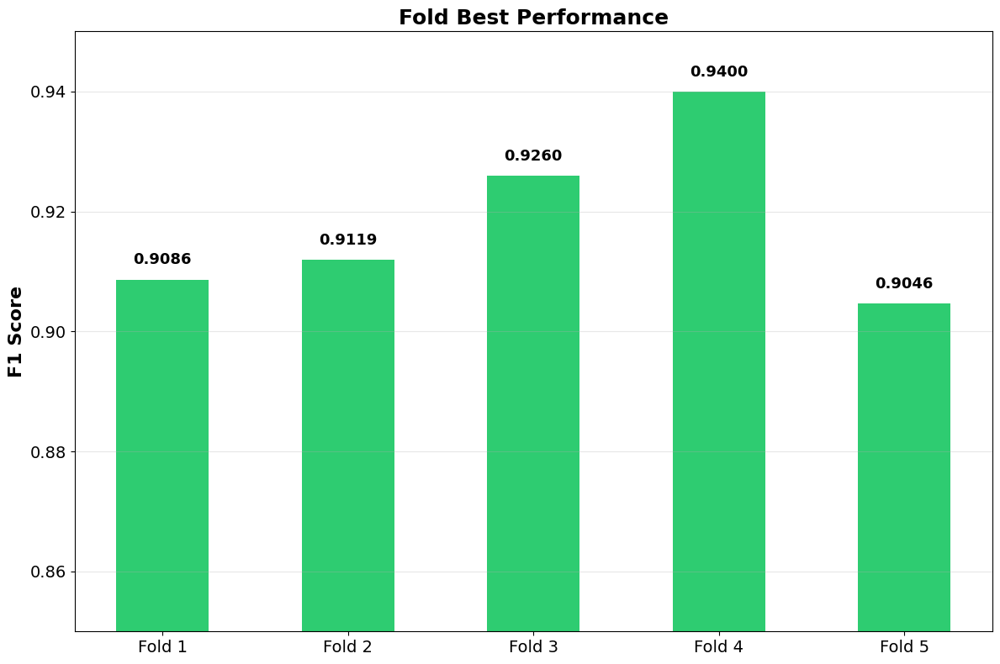


Final Results:
Mean F1 Score: 0.9182
Min F1 Score:  0.9046
Max F1 Score:  0.9400


In [16]:
import matplotlib.pyplot as plt
import numpy as np

print(f"✅ Visualization ready...")

fold_names = ['Fold 1', 'Fold 2', 'Fold 3', 'Fold 4', 'Fold 5']
best_f1s = fold_results

plt.figure(figsize=(12, 8))
colors = ['#2ecc71' if f > 0.88 else '#3498db' for f in best_f1s]
plt.bar(fold_names, best_f1s, color=colors, width=0.5)

plt.ylabel('F1 Score', fontsize=16, fontweight='bold')
plt.title('Fold Best Performance', fontsize=18, fontweight='bold')
plt.ylim([0.85, 0.95])  # ✅ 0.91 → 0.92 (더 넓게!)

plt.yticks(fontsize=14)
plt.xticks(fontsize=14)

for i, v in enumerate(best_f1s):
    plt.text(i, v + 0.002, f'{v:.4f}', ha='center', va='bottom', fontsize=13, fontweight='bold')

plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig('fold_results.png', dpi=150, bbox_inches='tight')
print("✅ Graph saved: fold_results.png")
plt.show()

print(f"\n{'='*60}")
print(f"Final Results:")
print(f"{'='*60}")
print(f"Mean F1 Score: {np.mean(best_f1s):.4f}")
print(f"Min F1 Score:  {np.min(best_f1s):.4f}")
print(f"Max F1 Score:  {np.max(best_f1s):.4f}")
print(f"{'='*60}")


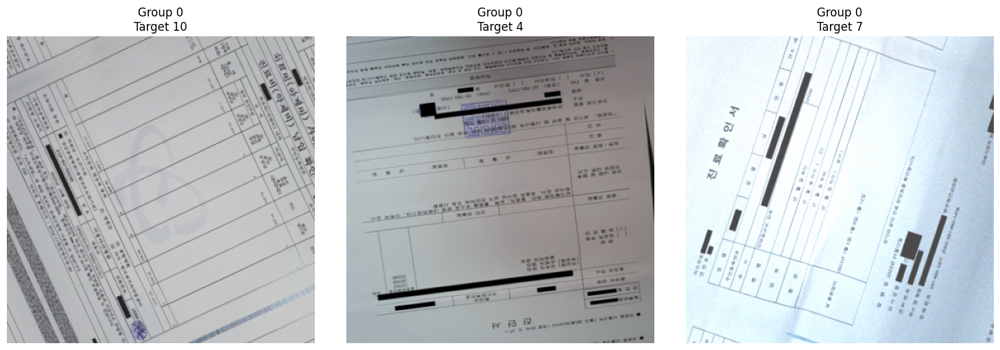

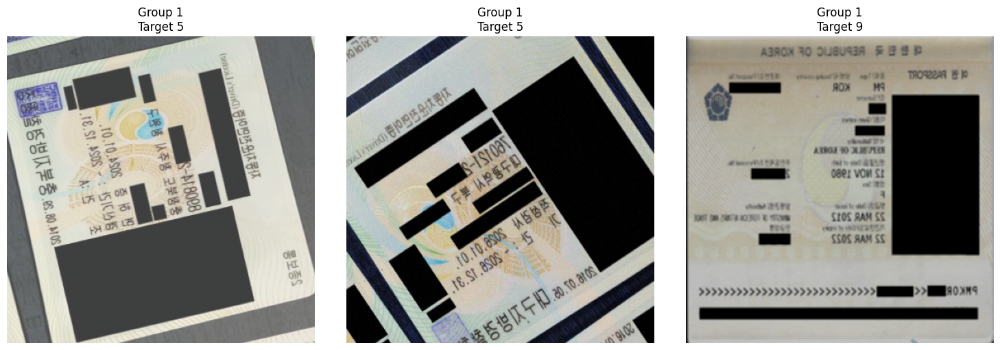

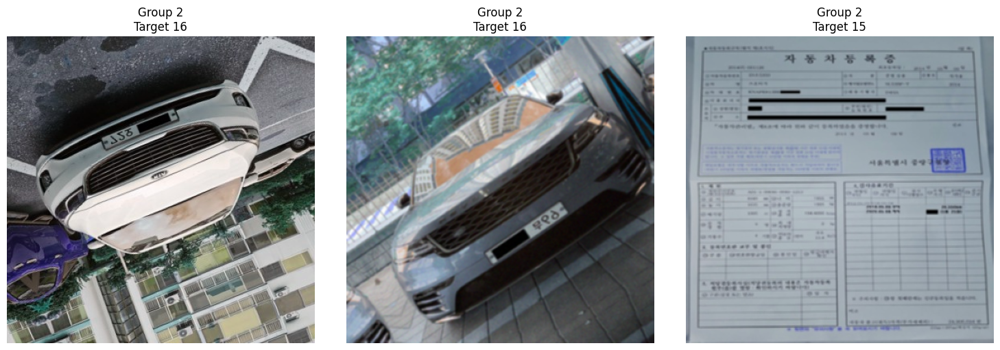

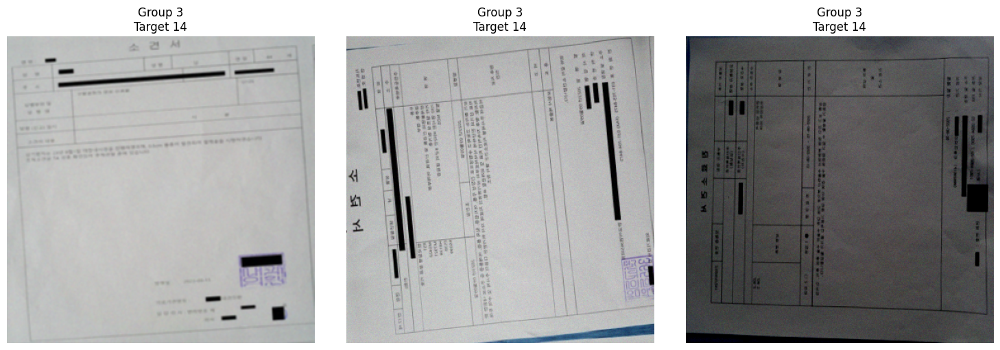

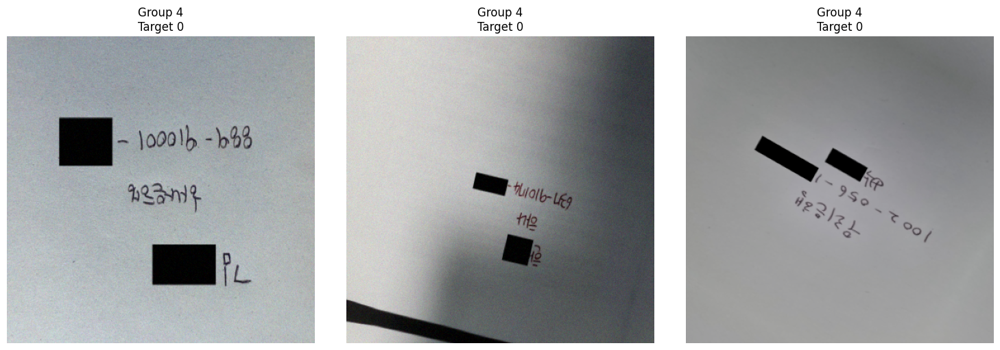

In [19]:
def denormalize_correct(image):
    """✅ 올바른 역정규화"""
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    
    # Tensor → numpy
    if torch.is_tensor(image):
        img_np = image.detach().cpu().numpy()
    else:
        img_np = image
    
    # C, H, W → H, W, C
    if img_np.ndim == 3 and img_np.shape[0] == 3:
        img_np = img_np.transpose(1, 2, 0)
    
    # ✅ 역정규화: image * std + mean
    img_denorm = img_np * std + mean
    
    return np.clip(img_denorm, 0, 1)


import matplotlib.pyplot as plt

def show_group_augmentation_visual(train_fold_dataset, train_fold, num_per_group=3):
    """
    각 그룹별 이미지 시각화 (matplotlib 사용)
    """
    
    groups = sorted(train_fold['group_idx'].unique())
    
    for group in groups:
        group_indices = train_fold[train_fold['group_idx'] == group].index[:num_per_group]
        
        fig, axes = plt.subplots(1, num_per_group, figsize=(15, 5))
        if num_per_group == 1:
            axes = [axes]
        
        for ax_idx, idx in enumerate(group_indices):
            sample = train_fold_dataset[idx]
            image = sample['image']
            target = sample['target']
            
            # 역정규화
            image_np = image.permute(1, 2, 0).numpy()
            image_np = (image_np * np.array([0.229, 0.224, 0.225]) + 
                       np.array([0.485, 0.456, 0.406]))
            image_np = np.clip(image_np, 0, 1)
            
            axes[ax_idx].imshow(image_np)
            axes[ax_idx].set_title(f"Group {group}\nTarget {target}")
            axes[ax_idx].axis('off')
        
        plt.tight_layout()
        plt.show()

# ✅ 실행!
show_group_augmentation_visual(train_fold_dataset, train_fold, num_per_group=3)


